In [1]:
# Python modules

# Remote modules
import numpy as np
import matplotlib.pyplot as plt
import torch
from transformers import (
    BartForConditionalGeneration,
    default_data_collator
)
from transformers.tokenization_utils_base import BatchEncoding
from torch.utils.data import DataLoader


# Local modules
from heads_analysis.attention_viz import AttentionVisualizer
from data.RelationsDatasets import RelationsDataset
from data.relation_utils import clean_relations
from data.data_preparation import load_and_preprocess_data
from utils import Data_Type, KGType, get_device

from kgs_binding.kg_qa_binding_utils import get_kg_qa_data_metadata, from_relations_path_2_relations, load_kg_handler

from custom_tokenizer.bart_custom_tokenizer_fast import BartCustomTokenizerFast

#############################
#   Constants
#############################

model_name = 'facebook/bart-large'

In [2]:
def relation_binary_2d_to_1d(relations_binary_mask):
    relations_binary_mask = relations_binary_mask.sum(dim=1)
    relations_binary_mask[relations_binary_mask > 1] = 1
    return relations_binary_mask

In [3]:
def plot_attn_lines_concepts(title, examples, layer, head, color_words,
              color_from=True, width=3, example_sep=3,
              word_height=1, pad=0.1, hide_sep=False):
    # examples -> {'words': tokens, 'attentions': [layer][head]}
    plt.clf()
    plt.figure(figsize=(6, 5))
    for i, example in enumerate(examples):
        yoffset = 0
        if i == 0:
            yoffset += (len(examples[0]["words"]) -
                        len(examples[1]["words"])) * word_height / 2
        xoffset = i * width * example_sep
        attn = example["attentions"][layer][head]
        if hide_sep:
            attn = np.array(attn)
            attn[:, 0] = 0
            attn[:, -1] = 0
            attn /= attn.sum(axis=-1, keepdims=True)

        words = example["words"]
        n_words = len(words)
        for position, word in enumerate(words):
            for x, from_word in [(xoffset, True), (xoffset + width, False)]:
                color = "k"
                if from_word == color_from and word in color_words:
                    color = "#cc0000"
                plt.text(x, yoffset - (position * word_height), word,
                         ha="right" if from_word else "left", va="center",
                         color=color)

        for i in range(n_words):
            for j in range(n_words):
                color = "b"
                if words[i if color_from else j] in color_words:
                    color = "r"
                plt.plot([xoffset + pad, xoffset + width - pad],
                         [yoffset - word_height * i, yoffset - word_height * j],
                         color=color, linewidth=1, alpha=attn[i, j])
    plt.axis("off")
    plt.title(title)
    plt.show()

def relations_info_to_concepts_str(text, relations_info):
    words = []
    print(text)
    for (i,j), v in relations_info.items():
        print(i,j)
        words.append(text[i:j])
        for (i_other, j_other), rel in v.items():
            words.append(text[i_other: j_other])
            print(f'{text[i:j]} -> {text[i_other: j_other]}')
    return list(set(words))

def batch_index_to_str(batch, relations_info):
    new_batch = []
    for i, b in enumerate(batch):
        new_batch.append(relations_info_to_concepts_str(b, relations_info[i]))
    return new_batch

def predict(model, inputs):
    output = model(**inputs, output_attentions=True)
    loss = output.loss
    logits = output.logits
    past_key_values = output.past_key_values
    decoder_hidden_states = output.decoder_hidden_states
    decoder_attentions = output.decoder_attentions
    cross_attentions = output.cross_attentions
    encoder_last_hidden_state = output.encoder_last_hidden_state
    encoder_hidden_states = output.encoder_hidden_states
    encoder_attentions = output.encoder_attentions
    return loss, logits, encoder_attentions

def get_examples(model, device, tokenizer, dataloader):
    examples_total = []
    relations_total = []
    for step, inputs in enumerate(dataloader):
        for k, v in inputs.items():
            inputs[k] = v.to(device)
        input_commonsense_relations = inputs.get("input_commonsense_relations")
        print('input_commonsense_relations:', input_commonsense_relations.sum())
        if 'input_commonsense_relations' in inputs:
            inputs.pop('input_commonsense_relations')
        loss, logits, encoder_attentions = predict(model, inputs)
        encoder_attentions = torch.stack(encoder_attentions)
        print(encoder_attentions.size())
        n_layers, batch_size, n_heads, src, tgt = encoder_attentions.size()
        encoder_attentions = encoder_attentions.view(batch_size, n_layers, n_heads, src, tgt)
        examples = []
        for i, ex in enumerate(encoder_attentions):
            d = {}
            indices = inputs['input_ids'][i].detach().cpu()
            all_tokens = tokenizer.convert_ids_to_tokens(indices)
            useful_indeces = indices != tokenizer.pad_token_id
            all_tokens = np.array(all_tokens)[useful_indeces]
            all_tokens = [tok.replace('Ġ', '') for tok in all_tokens]
            d['words'] = all_tokens
            d['attentions'] = ex.detach().cpu().numpy()
            examples.append(d)
        print(d['words'])
        relations_total.append(input_commonsense_relations)
        examples_total.append(examples)
    return examples_total, relations_total


def input_configation(dataset, idx=20, batch_size=2):
    start = idx
    batch = dataset.tokenized_data[start:start + batch_size]
    batch_relations_data = dataset.word_relations
    # print('batch_relations_data:', batch_relations_data[:2])
    # print(batch)
    normal_data_batch = dataset.data[start:start + batch_size]
    batch_relations_data = [batch_relations_data[x[0]] for x in normal_data_batch]
    print('batch_relations_data:', batch_relations_data)
    # normal_batch = [tokenizer.decode(b['input_ids'], skip_special_tokens=True) for b in batch]
    normal_batch = [d[-1]['question'] for d in dataset.data[start:start + batch_size]]
    words_to_spot = [word for words in batch_index_to_str(normal_batch, batch_relations_data) for word in words]
    return batch, words_to_spot

def load_tokenizer_and_model(knowledge_handler, device):
    #tokenizer = BartTokenizer.from_pretrained(model_name)
    tokenizer = BartCustomTokenizerFast.from_pretrained(model_name)
    relation_names = knowledge_handler.get_relation_types()
    tokenizer.set_known_relation_names(relation_names)
    tokenizer.set_operation_mode(there_is_difference_between_relations=True)
    model = BartForConditionalGeneration.from_pretrained(model_name)
    model.eval()
    model.zero_grad()
    model.to(device)
    return tokenizer, model

In [14]:
def plot_attn_lines_concepts_ids(title, examples, layer, head, color_words,
              relations_total,
              color_from=True, width=3, example_sep=3,
              word_height=1, pad=0.1, hide_sep=False):
    # examples -> {'words': tokens, 'attentions': [layer][head]}
    plt.clf()
    plt.figure(figsize=(6, 5))
    print('relations_total:', relations_total)
    for idx, example in enumerate(examples):
        yoffset = 0
        if idx == 0:
            yoffset += (len(examples[0]["words"]) -
                        len(examples[1]["words"])) * word_height / 2
        xoffset = idx * width * example_sep
        attn = example["attentions"][layer][head]
        if hide_sep:
            attn = np.array(attn)
            attn[:, 0] = 0
            attn[:, -1] = 0
            attn /= attn.sum(axis=-1, keepdims=True)

        words = example["words"]
        n_words = len(words)
        example_rel = relations_total[idx]
        print('example_rel:', example_rel.sum())
        print('relation_binary_2d_to_1d', relation_binary_2d_to_1d(example_rel))
        print('color_words:', color_words)
        for position, word in enumerate(words):
            for x, from_word in [(xoffset, True), (xoffset + width, False)]:
                color = "k"
                for y_idx, y in enumerate(words):
                    if from_word and example_rel[position, y_idx] > 0:
                        print('outgoing', position, y_idx)
                        color = "r"
                    if not from_word and example_rel[y_idx, position] > 0:
                        print('coming', position, y_idx)
                        color = "g"
                #if from_word == color_from and word in color_words:
                #    color = "#cc0000"
                plt.text(x, yoffset - (position * word_height), word,
                         ha="right" if from_word else "left", va="center",
                         color=color)

        for i in range(n_words):
            for j in range(n_words):
                color = "k"
                #print(i,j, example_rel[i,j])
                if example_rel[i,j].item() > 0 and i <= j:
                    print('hey r')
                    color = "r"
                if example_rel[i,j].item() > 0 and i >= j:
                    color = "g"
                    print('hey g')
                plt.plot([xoffset + pad, xoffset + width - pad],
                         [yoffset - word_height * i, yoffset - word_height * j],
                         color=color, linewidth=1, alpha=attn[i, j])
    plt.axis("off")
    plt.title(title)
    plt.show()

In [5]:
att_viz = AttentionVisualizer()
device = get_device()

dataset_types = [Data_Type.ELI5, Data_Type.STACK_EXCHANGE]
knowledge_handler = load_kg_handler(kg_type=KGType.CONCEPTNET)
tokenizer, model = load_tokenizer_and_model(knowledge_handler, device)

training_data, validation_data, test_data = load_and_preprocess_data(dataset_types, limit=500)
relations_metadata = get_kg_qa_data_metadata(knowledge_handler)
relations_data = from_relations_path_2_relations(dataset_types, metadata=relations_metadata)

No GPU available, using the CPU instead.


The tokenizer class you load from this checkpoint is not the same type as the class this function is called from. It may result in unexpected tokenization. 
The tokenizer class you load from this checkpoint is 'BartTokenizer'. 
The class this function is called from is 'BartCustomTokenizerFast'.


eli5
stackexchange_final
metadata: {'eli5': {'local': ['eli5_conceptnet_relation_data.json', 'kgs_binding/model_kgs/conceptnet'], 'remote': ['eli5_conceptnet_relation_data.json', 'kgs_binding/model_kgs/conceptnet']}, 'stackexchange_qa': {'local': ['stackexchange_qa_conceptnet_relation_data.json', 'kgs_binding/model_kgs/conceptnet'], 'remote': ['stackexchange_qa_conceptnet_relation_data.json', 'kgs_binding/model_kgs/conceptnet']}, 'commonsense_qa': {'local': ['commonsense_qa_conceptnet_relation_data.json', 'kgs_binding/model_kgs/conceptnet'], 'remote': ['commonsense_qa_conceptnet_relation_data.json', 'kgs_binding/model_kgs/conceptnet']}, 'commongen': {'local': ['commongen_conceptnet_relation_data.json', 'kgs_binding/model_kgs/conceptnet'], 'remote': ['commongen_conceptnet_relation_data.json', 'kgs_binding/model_kgs/conceptnet']}}
eli5_conceptnet_relation_data.json <built-in function dir>
stackexchange_qa_conceptnet_relation_data.json <built-in function dir>


In [6]:
dataset = RelationsDataset(training_data, relations_data=relations_data, tokenizer=tokenizer, device=device)

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 355184/355184 [00:05<00:00, 60563.92it/s]


initiated dataset
Loading dataset...
459 459
tokenizing dataset


1it [00:00,  6.55it/s]

commonsense_relation: {(10, 20): {(83, 94): 'form_of'}, (83, 94): {(10, 20): 'form_of'}}
k,v 1 (0, 3)
pair: (0, 3)
aux_dict: {(10, 20): {(83, 94): 'form_of'}, (83, 94): {(10, 20): 'form_of'}}
-----> (start, end) (10, 20)
-----> (start, end) (83, 94)
[before]token_idx_2_word_span_multiword[k]: (0, 3)
-----> (start, end) (83, 94)
-----> (start, end) (10, 20)
[after]token_idx_2_word_span_multiword[k]: (0, 3)
k,v 2 (0, 3)
pair: (0, 3)
aux_dict: {(10, 20): {(83, 94): 'form_of'}, (83, 94): {(10, 20): 'form_of'}}
-----> (start, end) (10, 20)
-----> (start, end) (83, 94)
[before]token_idx_2_word_span_multiword[k]: (0, 3)
-----> (start, end) (83, 94)
-----> (start, end) (10, 20)
[after]token_idx_2_word_span_multiword[k]: (0, 3)
k,v 3 (3, 5)
pair: (3, 5)
aux_dict: {(10, 20): {(83, 94): 'form_of'}, (83, 94): {(10, 20): 'form_of'}}
-----> (start, end) (10, 20)
-----> (start, end) (83, 94)
[before]token_idx_2_word_span_multiword[k]: (3, 5)
-----> (start, end) (83, 94)
-----> (start, end) (10, 20)
[

7it [00:00, 19.50it/s]

 (48, 52)
-----> (start, end) (25, 34)
[after]token_idx_2_word_span_multiword[k]: (48, 52)
k,v 11 (53, 59)
pair: (53, 59)
aux_dict: {(38, 47): {(25, 34): 'related_to'}}
-----> (start, end) (38, 47)
[before]token_idx_2_word_span_multiword[k]: (53, 59)
-----> (start, end) (25, 34)
[after]token_idx_2_word_span_multiword[k]: (53, 59)
k,v 12 (60, 66)
pair: (60, 66)
aux_dict: {(38, 47): {(25, 34): 'related_to'}}
-----> (start, end) (38, 47)
[before]token_idx_2_word_span_multiword[k]: (60, 66)
-----> (start, end) (25, 34)
[after]token_idx_2_word_span_multiword[k]: (60, 66)
k,v 13 (66, 67)
pair: (66, 67)
aux_dict: {(38, 47): {(25, 34): 'related_to'}}
-----> (start, end) (38, 47)
[before]token_idx_2_word_span_multiword[k]: (66, 67)
-----> (start, end) (25, 34)
[after]token_idx_2_word_span_multiword[k]: (66, 67)
(0, 3)  |  (0, 3)
(0, 3)  |  (4, 7)
(0, 3)  |  (8, 15)
(0, 3)  |  (16, 21)
(0, 3)  |  (22, 24)
(0, 3)  |  (25, 34)
(0, 3)  |  (35, 37)
(0, 3)  |  (38, 47)
(0, 3)  |  (38, 47)
(0, 3)  |  

10it [00:00, 18.70it/s]

(22, 24)
k,v 6 (25, 30)
pair: (25, 30)
aux_dict: {(36, 45): {(25, 30): 'related_to'}, (46, 53): {(36, 45): 'related_to'}}
-----> (start, end) (36, 45)
-----> (start, end) (46, 53)
[before]token_idx_2_word_span_multiword[k]: (25, 30)
-----> (start, end) (25, 30)
[after]token_idx_2_word_span_multiword[k]: (25, 30)
k,v 7 (31, 33)
pair: (31, 33)
aux_dict: {(36, 45): {(25, 30): 'related_to'}, (46, 53): {(36, 45): 'related_to'}}
-----> (start, end) (36, 45)
-----> (start, end) (46, 53)
[before]token_idx_2_word_span_multiword[k]: (31, 33)
-----> (start, end) (25, 30)
-----> (start, end) (36, 45)
[after]token_idx_2_word_span_multiword[k]: (31, 33)
k,v 8 (34, 35)
pair: (34, 35)
aux_dict: {(36, 45): {(25, 30): 'related_to'}, (46, 53): {(36, 45): 'related_to'}}
-----> (start, end) (36, 45)
-----> (start, end) (46, 53)
[before]token_idx_2_word_span_multiword[k]: (34, 35)
-----> (start, end) (25, 30)
-----> (start, end) (36, 45)
[after]token_idx_2_word_span_multiword[k]: (34, 35)
k,v 9 (36, 45)
pai

15it [00:00, 21.12it/s]

 (0, 3)
pair: (0, 3)
aux_dict: {(16, 20): {(80, 85): 'related_to'}, (80, 85): {(16, 20): 'related_to', (48, 64): 'related_to'}}
-----> (start, end) (16, 20)
-----> (start, end) (80, 85)
[before]token_idx_2_word_span_multiword[k]: (0, 3)
-----> (start, end) (80, 85)
-----> (start, end) (16, 20)
-----> (start, end) (48, 64)
[after]token_idx_2_word_span_multiword[k]: (0, 3)
k,v 2 (4, 8)
pair: (4, 8)
aux_dict: {(16, 20): {(80, 85): 'related_to'}, (80, 85): {(16, 20): 'related_to', (48, 64): 'related_to'}}
-----> (start, end) (16, 20)
-----> (start, end) (80, 85)
[before]token_idx_2_word_span_multiword[k]: (4, 8)
-----> (start, end) (80, 85)
-----> (start, end) (16, 20)
-----> (start, end) (48, 64)
[after]token_idx_2_word_span_multiword[k]: (4, 8)
k,v 3 (9, 11)
pair: (9, 11)
aux_dict: {(16, 20): {(80, 85): 'related_to'}, (80, 85): {(16, 20): 'related_to', (48, 64): 'related_to'}}
-----> (start, end) (16, 20)
-----> (start, end) (80, 85)
[before]token_idx_2_word_span_multiword[k]: (9, 11)
--

possible_relations: {(13, 18): {(19, 26): 'related_to'}, (19, 26): {(13, 18): 'related_to'}}
(19, 26)  |  (63, 65)
possible_relations: {(13, 18): {(19, 26): 'related_to'}, (19, 26): {(13, 18): 'related_to'}}
(19, 26)  |  (65, 66)
possible_relations: {(13, 18): {(19, 26): 'related_to'}, (19, 26): {(13, 18): 'related_to'}}
(27, 28)  |  (0, 3)
(27, 28)  |  (4, 6)
(27, 28)  |  (7, 8)
(27, 28)  |  (9, 12)
(27, 28)  |  (13, 18)
(27, 28)  |  (19, 26)
(27, 28)  |  (27, 28)
(27, 28)  |  (28, 31)
(27, 28)  |  (32, 39)
(27, 28)  |  (40, 42)
(27, 28)  |  (43, 45)
(27, 28)  |  (46, 49)
(27, 28)  |  (50, 55)
(27, 28)  |  (56, 62)
(27, 28)  |  (63, 65)
(27, 28)  |  (65, 66)
(28, 31)  |  (0, 3)
(28, 31)  |  (4, 6)
(28, 31)  |  (7, 8)
(28, 31)  |  (9, 12)
(28, 31)  |  (13, 18)
(28, 31)  |  (19, 26)
(28, 31)  |  (27, 28)
(28, 31)  |  (28, 31)
(28, 31)  |  (32, 39)
(28, 31)  |  (40, 42)
(28, 31)  |  (43, 45)
(28, 31)  |  (46, 49)
(28, 31)  |  (50, 55)
(28, 31)  |  (56, 62)
(28, 31)  |  (63, 65)
(28, 31) 

(46, 49)  |  (105, 108)
(46, 49)  |  (109, 122)
(46, 49)  |  (109, 122)
(46, 49)  |  (123, 126)
(46, 49)  |  (127, 132)
(46, 49)  |  (133, 135)
(46, 49)  |  (136, 138)
(46, 49)  |  (139, 143)
(46, 49)  |  (144, 151)
(46, 49)  |  (152, 155)
(46, 49)  |  (155, 156)
(46, 49)  |  (157, 160)
(46, 49)  |  (161, 166)
(46, 49)  |  (167, 171)
(46, 49)  |  (172, 174)
(46, 49)  |  (175, 181)
(46, 49)  |  (182, 184)
(46, 49)  |  (185, 190)
(46, 49)  |  (191, 195)
(46, 49)  |  (196, 198)
(46, 49)  |  (199, 204)
(46, 49)  |  (204, 205)
(50, 53)  |  (0, 3)
(50, 53)  |  (4, 6)
(50, 53)  |  (7, 10)
(50, 53)  |  (11, 18)
(50, 53)  |  (11, 18)
(50, 53)  |  (19, 25)
(50, 53)  |  (26, 31)
(50, 53)  |  (32, 36)
(50, 53)  |  (37, 45)
(50, 53)  |  (46, 49)
(50, 53)  |  (50, 53)
(50, 53)  |  (54, 57)
(50, 53)  |  (58, 59)
(50, 53)  |  (59, 62)
(50, 53)  |  (63, 67)
(50, 53)  |  (67, 68)
(50, 53)  |  (69, 71)
(50, 53)  |  (72, 76)
(50, 53)  |  (77, 84)
(50, 53)  |  (85, 88)
(50, 53)  |  (88, 89)
(50, 53)  |  (9

19it [00:01, 10.79it/s]

  |  (136, 138)
(123, 126)  |  (139, 143)
(123, 126)  |  (144, 151)
(123, 126)  |  (152, 155)
(123, 126)  |  (155, 156)
(123, 126)  |  (157, 160)
(123, 126)  |  (161, 166)
(123, 126)  |  (167, 171)
(123, 126)  |  (172, 174)
(123, 126)  |  (175, 181)
(123, 126)  |  (182, 184)
(123, 126)  |  (185, 190)
(123, 126)  |  (191, 195)
(123, 126)  |  (196, 198)
(123, 126)  |  (199, 204)
(123, 126)  |  (204, 205)
(127, 132)  |  (0, 3)
(127, 132)  |  (4, 6)
(127, 132)  |  (7, 10)
(127, 132)  |  (11, 18)
(127, 132)  |  (11, 18)
(127, 132)  |  (19, 25)
(127, 132)  |  (26, 31)
(127, 132)  |  (32, 36)
(127, 132)  |  (37, 45)
(127, 132)  |  (46, 49)
(127, 132)  |  (50, 53)
(127, 132)  |  (54, 57)
(127, 132)  |  (58, 59)
(127, 132)  |  (59, 62)
(127, 132)  |  (63, 67)
(127, 132)  |  (67, 68)
(127, 132)  |  (69, 71)
(127, 132)  |  (72, 76)
(127, 132)  |  (77, 84)
(127, 132)  |  (85, 88)
(127, 132)  |  (88, 89)
(127, 132)  |  (90, 92)
(127, 132)  |  (93, 102)
(127, 132)  |  (102, 104)
(127, 132)  |  (105,

22it [00:01, 12.20it/s]

 {(16, 23): {(41, 48): 'synonym'}, (41, 48): {(16, 23): 'synonym'}}
k,v 1 (0, 4)
pair: (0, 4)
aux_dict: {(16, 23): {(41, 48): 'synonym'}, (41, 48): {(16, 23): 'synonym'}}
-----> (start, end) (16, 23)
-----> (start, end) (41, 48)
[before]token_idx_2_word_span_multiword[k]: (0, 4)
-----> (start, end) (41, 48)
-----> (start, end) (16, 23)
[after]token_idx_2_word_span_multiword[k]: (0, 4)
k,v 2 (5, 12)
pair: (5, 12)
aux_dict: {(16, 23): {(41, 48): 'synonym'}, (41, 48): {(16, 23): 'synonym'}}
-----> (start, end) (16, 23)
-----> (start, end) (41, 48)
[before]token_idx_2_word_span_multiword[k]: (5, 12)
-----> (start, end) (41, 48)
-----> (start, end) (16, 23)
[after]token_idx_2_word_span_multiword[k]: (5, 12)
k,v 3 (13, 15)
pair: (13, 15)
aux_dict: {(16, 23): {(41, 48): 'synonym'}, (41, 48): {(16, 23): 'synonym'}}
-----> (start, end) (16, 23)
-----> (start, end) (41, 48)
[before]token_idx_2_word_span_multiword[k]: (13, 15)
-----> (start, end) (41, 48)
-----> (start, end) (16, 23)
[after]token

26it [00:01, 15.66it/s]

 |  (50, 52)
(4, 8)  |  (53, 59)
(4, 8)  |  (60, 66)
(4, 8)  |  (66, 67)
(9, 14)  |  (0, 3)
(9, 14)  |  (4, 8)
(9, 14)  |  (9, 14)
(9, 14)  |  (15, 20)
(9, 14)  |  (21, 22)
(9, 14)  |  (23, 27)
(9, 14)  |  (28, 35)
(9, 14)  |  (36, 43)
(9, 14)  |  (36, 43)
(9, 14)  |  (44, 49)
(9, 14)  |  (44, 49)
(9, 14)  |  (44, 49)
(9, 14)  |  (50, 52)
(9, 14)  |  (53, 59)
(9, 14)  |  (60, 66)
(9, 14)  |  (66, 67)
(15, 20)  |  (0, 3)
(15, 20)  |  (4, 8)
(15, 20)  |  (9, 14)
(15, 20)  |  (15, 20)
(15, 20)  |  (21, 22)
(15, 20)  |  (23, 27)
(15, 20)  |  (28, 35)
(15, 20)  |  (36, 43)
(15, 20)  |  (36, 43)
(15, 20)  |  (44, 49)
(15, 20)  |  (44, 49)
(15, 20)  |  (44, 49)
(15, 20)  |  (50, 52)
(15, 20)  |  (53, 59)
(15, 20)  |  (60, 66)
(15, 20)  |  (66, 67)
(21, 22)  |  (0, 3)
(21, 22)  |  (4, 8)
(21, 22)  |  (9, 14)
(21, 22)  |  (15, 20)
(21, 22)  |  (21, 22)
(21, 22)  |  (23, 27)
(21, 22)  |  (28, 35)
(21, 22)  |  (36, 43)
(21, 22)  |  (36, 43)
(21, 22)  |  (44, 49)
(21, 22)  |  (44, 49)
(21, 22)  | 

(58, 64)  |  (92, 101)
(58, 64)  |  (102, 107)
(58, 64)  |  (108, 111)
(58, 64)  |  (111, 112)
(64, 65)  |  (0, 3)
(64, 65)  |  (4, 7)
(64, 65)  |  (8, 11)
(64, 65)  |  (12, 16)
(64, 65)  |  (17, 20)
(64, 65)  |  (21, 27)
(64, 65)  |  (28, 30)
(64, 65)  |  (31, 34)
(64, 65)  |  (35, 44)
(64, 65)  |  (45, 50)
(64, 65)  |  (51, 54)
(64, 65)  |  (55, 57)
(64, 65)  |  (58, 64)
(64, 65)  |  (64, 65)
(64, 65)  |  (66, 69)
(64, 65)  |  (70, 73)
(64, 65)  |  (74, 77)
(64, 65)  |  (78, 84)
(64, 65)  |  (85, 87)
(64, 65)  |  (88, 91)
(64, 65)  |  (92, 101)
(64, 65)  |  (102, 107)
(64, 65)  |  (108, 111)
(64, 65)  |  (111, 112)
(66, 69)  |  (0, 3)
(66, 69)  |  (4, 7)
(66, 69)  |  (8, 11)
(66, 69)  |  (12, 16)
(66, 69)  |  (17, 20)
(66, 69)  |  (21, 27)
(66, 69)  |  (28, 30)
(66, 69)  |  (31, 34)
(66, 69)  |  (35, 44)
(66, 69)  |  (45, 50)
(66, 69)  |  (51, 54)
(66, 69)  |  (55, 57)
(66, 69)  |  (58, 64)
(66, 69)  |  (64, 65)
(66, 69)  |  (66, 69)
(66, 69)  |  (70, 73)
(66, 69)  |  (74, 77)
(66, 6

31it [00:03,  5.92it/s]

 (46, 47)
(86, 88)  |  (48, 51)
(86, 88)  |  (52, 54)
(86, 88)  |  (55, 57)
(86, 88)  |  (58, 61)
(86, 88)  |  (62, 64)
(86, 88)  |  (65, 68)
(86, 88)  |  (69, 77)
(86, 88)  |  (78, 85)
(86, 88)  |  (86, 88)
(86, 88)  |  (89, 91)
(86, 88)  |  (91, 92)
(89, 91)  |  (0, 2)
(89, 91)  |  (3, 6)
(89, 91)  |  (7, 13)
(89, 91)  |  (14, 16)
(89, 91)  |  (17, 19)
(89, 91)  |  (20, 29)
(89, 91)  |  (30, 32)
(89, 91)  |  (33, 37)
(89, 91)  |  (38, 40)
(89, 91)  |  (41, 46)
(89, 91)  |  (46, 47)
(89, 91)  |  (48, 51)
(89, 91)  |  (52, 54)
(89, 91)  |  (55, 57)
(89, 91)  |  (58, 61)
(89, 91)  |  (62, 64)
(89, 91)  |  (65, 68)
(89, 91)  |  (69, 77)
(89, 91)  |  (78, 85)
(89, 91)  |  (86, 88)
(89, 91)  |  (89, 91)
(89, 91)  |  (91, 92)
(91, 92)  |  (0, 2)
(91, 92)  |  (3, 6)
(91, 92)  |  (7, 13)
(91, 92)  |  (14, 16)
(91, 92)  |  (17, 19)
(91, 92)  |  (20, 29)
(91, 92)  |  (30, 32)
(91, 92)  |  (33, 37)
(91, 92)  |  (38, 40)
(91, 92)  |  (41, 46)
(91, 92)  |  (46, 47)
(91, 92)  |  (48, 51)
(91, 92)  

(5, 13)  |  (105, 107)
(5, 13)  |  (107, 108)
(14, 19)  |  (0, 1)
(14, 19)  |  (2, 4)
(14, 19)  |  (5, 13)
(14, 19)  |  (14, 19)
(14, 19)  |  (20, 23)
(14, 19)  |  (24, 28)
(14, 19)  |  (29, 31)
(14, 19)  |  (32, 35)
(14, 19)  |  (36, 38)
(14, 19)  |  (39, 40)
(14, 19)  |  (41, 43)
(14, 19)  |  (41, 43)
(14, 19)  |  (43, 44)
(14, 19)  |  (45, 49)
(14, 19)  |  (50, 57)
(14, 19)  |  (58, 62)
(14, 19)  |  (63, 65)
(14, 19)  |  (66, 69)
(14, 19)  |  (70, 74)
(14, 19)  |  (75, 78)
(14, 19)  |  (79, 85)
(14, 19)  |  (86, 89)
(14, 19)  |  (90, 94)
(14, 19)  |  (94, 95)
(14, 19)  |  (96, 101)
(14, 19)  |  (102, 104)
(14, 19)  |  (105, 107)
(14, 19)  |  (107, 108)
(20, 23)  |  (0, 1)
(20, 23)  |  (2, 4)
(20, 23)  |  (5, 13)
(20, 23)  |  (14, 19)
(20, 23)  |  (20, 23)
(20, 23)  |  (24, 28)
(20, 23)  |  (29, 31)
(20, 23)  |  (32, 35)
(20, 23)  |  (36, 38)
(20, 23)  |  (39, 40)
(20, 23)  |  (41, 43)
(20, 23)  |  (41, 43)
(20, 23)  |  (43, 44)
(20, 23)  |  (45, 49)
(20, 23)  |  (50, 57)
(20, 23)  |

33it [00:03,  5.70it/s]

 (109, 110)
(9, 10)  |  (0, 3)
(9, 10)  |  (4, 8)
(9, 10)  |  (9, 10)
(9, 10)  |  (11, 14)
(9, 10)  |  (15, 21)
(9, 10)  |  (22, 29)
(9, 10)  |  (22, 29)
(9, 10)  |  (29, 30)
(9, 10)  |  (30, 37)
(9, 10)  |  (30, 37)
(9, 10)  |  (30, 37)
(9, 10)  |  (38, 43)
(9, 10)  |  (44, 48)
(9, 10)  |  (48, 49)
(9, 10)  |  (50, 53)
(9, 10)  |  (54, 56)
(9, 10)  |  (57, 61)
(9, 10)  |  (62, 66)
(9, 10)  |  (67, 72)
(9, 10)  |  (73, 79)
(9, 10)  |  (80, 88)
(9, 10)  |  (89, 94)
(9, 10)  |  (95, 98)
(9, 10)  |  (99, 102)
(9, 10)  |  (103, 109)
(9, 10)  |  (109, 110)
(11, 14)  |  (0, 3)
(11, 14)  |  (4, 8)
(11, 14)  |  (9, 10)
(11, 14)  |  (11, 14)
(11, 14)  |  (15, 21)
(11, 14)  |  (22, 29)
(11, 14)  |  (22, 29)
(11, 14)  |  (29, 30)
(11, 14)  |  (30, 37)
(11, 14)  |  (30, 37)
(11, 14)  |  (30, 37)
(11, 14)  |  (38, 43)
(11, 14)  |  (44, 48)
(11, 14)  |  (48, 49)
(11, 14)  |  (50, 53)
(11, 14)  |  (54, 56)
(11, 14)  |  (57, 61)
(11, 14)  |  (62, 66)
(11, 14)  |  (67, 72)
(11, 14)  |  (73, 79)
(11, 14

possible_relations: {(20, 27): {(14, 19): 'has_context', (91, 96): 'derived_from'}, (14, 19): {(91, 96): 'related_to', (109, 114): 'has_property'}, (91, 96): {(14, 19): 'has_context', (109, 114): 'manner_of'}, (109, 114): {(14, 19): 'at_location'}, (41, 46): {(91, 96): 'manner_of'}}
(14, 19)  |  (73, 77)
possible_relations: {(20, 27): {(14, 19): 'has_context', (91, 96): 'derived_from'}, (14, 19): {(91, 96): 'related_to', (109, 114): 'has_property'}, (91, 96): {(14, 19): 'has_context', (109, 114): 'manner_of'}, (109, 114): {(14, 19): 'at_location'}, (41, 46): {(91, 96): 'manner_of'}}
(14, 19)  |  (78, 85)
possible_relations: {(20, 27): {(14, 19): 'has_context', (91, 96): 'derived_from'}, (14, 19): {(91, 96): 'related_to', (109, 114): 'has_property'}, (91, 96): {(14, 19): 'has_context', (109, 114): 'manner_of'}, (109, 114): {(14, 19): 'at_location'}, (41, 46): {(91, 96): 'manner_of'}}
(14, 19)  |  (86, 90)
possible_relations: {(20, 27): {(14, 19): 'has_context', (91, 96): 'derived_from'}

35it [00:04,  5.66it/s]

 (7, 13)
(84, 86)  |  (14, 18)
(84, 86)  |  (19, 21)
(84, 86)  |  (22, 27)
(84, 86)  |  (28, 31)
(84, 86)  |  (31, 32)
(84, 86)  |  (33, 37)
(84, 86)  |  (38, 43)
(84, 86)  |  (44, 53)
(84, 86)  |  (54, 59)
(84, 86)  |  (60, 67)
(84, 86)  |  (68, 74)
(84, 86)  |  (75, 78)
(84, 86)  |  (79, 83)
(84, 86)  |  (84, 86)
(84, 86)  |  (87, 94)
(84, 86)  |  (95, 97)
(84, 86)  |  (98, 103)
(84, 86)  |  (104, 113)
(84, 86)  |  (113, 114)
(87, 94)  |  (0, 2)
possible_relations: {(87, 94): {(44, 53): 'is_a', (68, 74): 'related_to'}}
(87, 94)  |  (3, 6)
possible_relations: {(87, 94): {(44, 53): 'is_a', (68, 74): 'related_to'}}
(87, 94)  |  (7, 13)
possible_relations: {(87, 94): {(44, 53): 'is_a', (68, 74): 'related_to'}}
(87, 94)  |  (14, 18)
possible_relations: {(87, 94): {(44, 53): 'is_a', (68, 74): 'related_to'}}
(87, 94)  |  (19, 21)
possible_relations: {(87, 94): {(44, 53): 'is_a', (68, 74): 'related_to'}}
(87, 94)  |  (22, 27)
possible_relations: {(87, 94): {(44, 53): 'is_a', (68, 74): 'relat

(5, 6)  |  (53, 58)
(5, 6)  |  (58, 59)
(5, 6)  |  (60, 61)
(5, 6)  |  (62, 72)
(5, 6)  |  (73, 77)
(5, 6)  |  (78, 81)
(5, 6)  |  (82, 84)
(5, 6)  |  (85, 91)
(5, 6)  |  (92, 97)
(5, 6)  |  (98, 101)
(5, 6)  |  (102, 106)
(5, 6)  |  (107, 117)
(5, 6)  |  (117, 118)
(5, 6)  |  (119, 122)
(5, 6)  |  (122, 123)
(5, 6)  |  (124, 128)
(5, 6)  |  (129, 134)
(5, 6)  |  (135, 138)
(5, 6)  |  (139, 142)
(5, 6)  |  (143, 148)
(5, 6)  |  (148, 149)
(5, 6)  |  (150, 152)
(5, 6)  |  (153, 156)
(5, 6)  |  (157, 161)
(5, 6)  |  (162, 169)
(5, 6)  |  (170, 172)
(5, 6)  |  (173, 178)
(5, 6)  |  (179, 192)
(5, 6)  |  (179, 192)
(5, 6)  |  (179, 192)
(5, 6)  |  (179, 192)
(5, 6)  |  (192, 193)
(5, 6)  |  (194, 199)
(5, 6)  |  (200, 211)
(5, 6)  |  (200, 211)
(5, 6)  |  (211, 212)
(5, 6)  |  (213, 216)
(5, 6)  |  (216, 219)
(7, 10)  |  (0, 4)
(7, 10)  |  (5, 6)
(7, 10)  |  (7, 10)
(7, 10)  |  (11, 18)
(7, 10)  |  (19, 21)
(7, 10)  |  (22, 27)
(7, 10)  |  (27, 28)
(7, 10)  |  (29, 34)
(7, 10)  |  (35, 37)

(82, 84)  |  (78, 81)
(82, 84)  |  (82, 84)
(82, 84)  |  (85, 91)
(82, 84)  |  (92, 97)
(82, 84)  |  (98, 101)
(82, 84)  |  (102, 106)
(82, 84)  |  (107, 117)
(82, 84)  |  (117, 118)
(82, 84)  |  (119, 122)
(82, 84)  |  (122, 123)
(82, 84)  |  (124, 128)
(82, 84)  |  (129, 134)
(82, 84)  |  (135, 138)
(82, 84)  |  (139, 142)
(82, 84)  |  (143, 148)
(82, 84)  |  (148, 149)
(82, 84)  |  (150, 152)
(82, 84)  |  (153, 156)
(82, 84)  |  (157, 161)
(82, 84)  |  (162, 169)
(82, 84)  |  (170, 172)
(82, 84)  |  (173, 178)
(82, 84)  |  (179, 192)
(82, 84)  |  (179, 192)
(82, 84)  |  (179, 192)
(82, 84)  |  (179, 192)
(82, 84)  |  (192, 193)
(82, 84)  |  (194, 199)
(82, 84)  |  (200, 211)
(82, 84)  |  (200, 211)
(82, 84)  |  (211, 212)
(82, 84)  |  (213, 216)
(82, 84)  |  (216, 219)
(85, 91)  |  (0, 4)
(85, 91)  |  (5, 6)
(85, 91)  |  (7, 10)
(85, 91)  |  (11, 18)
(85, 91)  |  (19, 21)
(85, 91)  |  (22, 27)
(85, 91)  |  (27, 28)
(85, 91)  |  (29, 34)
(85, 91)  |  (35, 37)
(85, 91)  |  (38, 42)
(8

38it [00:05,  4.77it/s]

(162, 169)  |  (192, 193)
possible_relations: {(11, 18): {(53, 58): 'antonym'}, (53, 58): {(11, 18): 'at_location', (162, 169): 'related_to', (200, 211): 'related_to'}, (162, 169): {(11, 18): 'at_location', (53, 58): 'synonym', (179, 192): 'related_to', (200, 211): 'related_to'}, (179, 192): {(11, 18): 'at_location'}, (173, 178): {(194, 199): 'manner_of'}, (194, 199): {(173, 178): 'manner_of'}}
(162, 169)  |  (194, 199)
possible_relations: {(11, 18): {(53, 58): 'antonym'}, (53, 58): {(11, 18): 'at_location', (162, 169): 'related_to', (200, 211): 'related_to'}, (162, 169): {(11, 18): 'at_location', (53, 58): 'synonym', (179, 192): 'related_to', (200, 211): 'related_to'}, (179, 192): {(11, 18): 'at_location'}, (173, 178): {(194, 199): 'manner_of'}, (194, 199): {(173, 178): 'manner_of'}}
(162, 169)  |  (200, 211)
possible_relations: {(11, 18): {(53, 58): 'antonym'}, (53, 58): {(11, 18): 'at_location', (162, 169): 'related_to', (200, 211): 'related_to'}, (162, 169): {(11, 18): 'at_location

[after]token_idx_2_word_span_multiword[k]: (0, 4)
k,v 2 (5, 11)
pair: (5, 11)
aux_dict: {(51, 63): {(40, 50): 'related_to'}, (116, 121): {(40, 50): 'related_to'}}
-----> (start, end) (51, 63)
-----> (start, end) (116, 121)
[before]token_idx_2_word_span_multiword[k]: (5, 11)
-----> (start, end) (40, 50)
-----> (start, end) (40, 50)
[after]token_idx_2_word_span_multiword[k]: (5, 11)
k,v 3 (12, 16)
pair: (12, 16)
aux_dict: {(51, 63): {(40, 50): 'related_to'}, (116, 121): {(40, 50): 'related_to'}}
-----> (start, end) (51, 63)
-----> (start, end) (116, 121)
[before]token_idx_2_word_span_multiword[k]: (12, 16)
-----> (start, end) (40, 50)
-----> (start, end) (40, 50)
[after]token_idx_2_word_span_multiword[k]: (12, 16)
k,v 4 (17, 28)
pair: (17, 28)
aux_dict: {(51, 63): {(40, 50): 'related_to'}, (116, 121): {(40, 50): 'related_to'}}
-----> (start, end) (51, 63)
-----> (start, end) (116, 121)
[before]token_idx_2_word_span_multiword[k]: (17, 28)
-----> (start, end) (40, 50)
-----> (start, end) (

40it [00:05,  5.21it/s]

 (121, 122)
(123, 126)  |  (123, 126)
(123, 126)  |  (127, 130)
(123, 126)  |  (131, 136)
(123, 126)  |  (137, 141)
(123, 126)  |  (142, 144)
(123, 126)  |  (145, 153)
(123, 126)  |  (153, 154)
(127, 130)  |  (0, 4)
(127, 130)  |  (5, 11)
(127, 130)  |  (12, 16)
(127, 130)  |  (17, 28)
(127, 130)  |  (29, 34)
(127, 130)  |  (35, 39)
(127, 130)  |  (40, 50)
(127, 130)  |  (51, 63)
(127, 130)  |  (51, 63)
(127, 130)  |  (63, 64)
(127, 130)  |  (65, 69)
(127, 130)  |  (70, 72)
(127, 130)  |  (73, 78)
(127, 130)  |  (79, 87)
(127, 130)  |  (87, 88)
(127, 130)  |  (89, 97)
(127, 130)  |  (98, 102)
(127, 130)  |  (103, 107)
(127, 130)  |  (108, 110)
(127, 130)  |  (111, 113)
(127, 130)  |  (113, 115)
(127, 130)  |  (116, 121)
(127, 130)  |  (121, 122)
(127, 130)  |  (123, 126)
(127, 130)  |  (127, 130)
(127, 130)  |  (131, 136)
(127, 130)  |  (137, 141)
(127, 130)  |  (142, 144)
(127, 130)  |  (145, 153)
(127, 130)  |  (153, 154)
(131, 136)  |  (0, 4)
(131, 136)  |  (5, 11)
(131, 136)  |  (1

-----> (start, end) (167, 173)
-----> (start, end) (9, 13)
-----> (start, end) (123, 127)
-----> (start, end) (9, 13)
-----> (start, end) (48, 56)
-----> (start, end) (167, 173)
-----> (start, end) (9, 13)
-----> (start, end) (123, 127)
-----> (start, end) (174, 186)
[after]token_idx_2_word_span_multiword[k]: (118, 122)
k,v 34 (123, 127)
pair: (123, 127)
aux_dict: {(9, 13): {(48, 56): 'at_location', (123, 127): 'synonym', (167, 173): 'has_a'}, (48, 56): {(9, 13): 'related_to', (123, 127): 'related_to'}, (123, 127): {(9, 13): 'synonym', (48, 56): 'at_location', (167, 173): 'has_a'}, (167, 173): {(9, 13): 'part_of', (123, 127): 'part_of'}, (128, 135): {(174, 186): 'related_to'}}
-----> (start, end) (9, 13)
-----> (start, end) (48, 56)
-----> (start, end) (123, 127)
[before]token_idx_2_word_span_multiword[k]: (123, 127)
-----> (start, end) (48, 56)
-----> (start, end) (123, 127)
[after]token_idx_2_word_span_multiword[k]: (123, 127)
k,v 35 (128, 131)
pair: (128, 131)
aux_dict: {(9, 13): {(

possible_relations: {(9, 13): {(48, 56): 'at_location', (123, 127): 'synonym', (167, 173): 'has_a'}, (48, 56): {(9, 13): 'related_to', (123, 127): 'related_to'}, (123, 127): {(9, 13): 'synonym', (48, 56): 'at_location', (167, 173): 'has_a'}, (167, 173): {(9, 13): 'part_of', (123, 127): 'part_of'}, (128, 135): {(174, 186): 'related_to'}}
relation_kind: related_to
(48, 56)  |  (128, 131)
possible_relations: {(9, 13): {(48, 56): 'at_location', (123, 127): 'synonym', (167, 173): 'has_a'}, (48, 56): {(9, 13): 'related_to', (123, 127): 'related_to'}, (123, 127): {(9, 13): 'synonym', (48, 56): 'at_location', (167, 173): 'has_a'}, (167, 173): {(9, 13): 'part_of', (123, 127): 'part_of'}, (128, 135): {(174, 186): 'related_to'}}
(48, 56)  |  (132, 135)
possible_relations: {(9, 13): {(48, 56): 'at_location', (123, 127): 'synonym', (167, 173): 'has_a'}, (48, 56): {(9, 13): 'related_to', (123, 127): 'related_to'}, (123, 127): {(9, 13): 'synonym', (48, 56): 'at_location', (167, 173): 'has_a'}, (167, 

42it [00:06,  4.04it/s]

  |  (32, 34)
(128, 131)  |  (35, 38)
(128, 131)  |  (39, 41)
(128, 131)  |  (41, 42)
(128, 131)  |  (42, 43)
(128, 131)  |  (44, 47)
(128, 131)  |  (48, 56)
(128, 131)  |  (57, 61)
(128, 131)  |  (62, 67)
(128, 131)  |  (68, 74)
(128, 131)  |  (75, 77)
(128, 131)  |  (78, 80)
(128, 131)  |  (81, 83)
(128, 131)  |  (84, 87)
(128, 131)  |  (88, 90)
(128, 131)  |  (90, 91)
(128, 131)  |  (91, 92)
(128, 131)  |  (92, 93)
(128, 131)  |  (94, 100)
(128, 131)  |  (100, 102)
(128, 131)  |  (103, 105)
(128, 131)  |  (106, 108)
(128, 131)  |  (109, 114)
(128, 131)  |  (115, 117)
(128, 131)  |  (118, 122)
(128, 131)  |  (123, 127)
(128, 131)  |  (128, 131)
(128, 131)  |  (132, 135)
(128, 131)  |  (136, 138)
(128, 131)  |  (139, 142)
(128, 131)  |  (143, 145)
(128, 131)  |  (145, 146)
(128, 131)  |  (146, 147)
(128, 131)  |  (147, 148)
(128, 131)  |  (148, 151)
(128, 131)  |  (152, 155)
(128, 131)  |  (156, 162)
(128, 131)  |  (163, 166)
(128, 131)  |  (167, 173)
(128, 131)  |  (174, 186)
(128, 1

47it [00:06,  7.16it/s]

 |  (41, 42)
(12, 16)  |  (43, 46)
(12, 16)  |  (47, 51)
(12, 16)  |  (52, 54)
(12, 16)  |  (55, 58)
(17, 20)  |  (0, 6)
(17, 20)  |  (7, 10)
(17, 20)  |  (7, 10)
(17, 20)  |  (10, 11)
(17, 20)  |  (12, 16)
(17, 20)  |  (17, 20)
(17, 20)  |  (21, 26)
(17, 20)  |  (27, 29)
(17, 20)  |  (30, 34)
(17, 20)  |  (35, 36)
(17, 20)  |  (37, 40)
(17, 20)  |  (41, 42)
(17, 20)  |  (43, 46)
(17, 20)  |  (47, 51)
(17, 20)  |  (52, 54)
(17, 20)  |  (55, 58)
(21, 26)  |  (0, 6)
possible_relations: {(21, 26): {(55, 58): 'related_to'}}
(21, 26)  |  (7, 10)
possible_relations: {(21, 26): {(55, 58): 'related_to'}}
(21, 26)  |  (7, 10)
possible_relations: {(21, 26): {(55, 58): 'related_to'}}
(21, 26)  |  (10, 11)
possible_relations: {(21, 26): {(55, 58): 'related_to'}}
(21, 26)  |  (12, 16)
possible_relations: {(21, 26): {(55, 58): 'related_to'}}
(21, 26)  |  (17, 20)
possible_relations: {(21, 26): {(55, 58): 'related_to'}}
(21, 26)  |  (21, 26)
possible_relations: {(21, 26): {(55, 58): 'related_to'}}
(2

52it [00:06,  9.73it/s]

  |  (55, 59)
(64, 65)  |  (60, 61)
(64, 65)  |  (61, 64)
(64, 65)  |  (64, 65)
(64, 65)  |  (65, 68)
(64, 65)  |  (69, 76)
(64, 65)  |  (76, 77)
(64, 65)  |  (78, 82)
(64, 65)  |  (83, 88)
(64, 65)  |  (89, 95)
(64, 65)  |  (89, 95)
(64, 65)  |  (96, 98)
(64, 65)  |  (99, 103)
(64, 65)  |  (103, 104)
(65, 68)  |  (0, 3)
(65, 68)  |  (4, 6)
(65, 68)  |  (7, 9)
(65, 68)  |  (10, 14)
(65, 68)  |  (15, 21)
(65, 68)  |  (22, 35)
(65, 68)  |  (36, 40)
(65, 68)  |  (41, 45)
(65, 68)  |  (46, 53)
(65, 68)  |  (54, 55)
(65, 68)  |  (55, 59)
(65, 68)  |  (60, 61)
(65, 68)  |  (61, 64)
(65, 68)  |  (64, 65)
(65, 68)  |  (65, 68)
(65, 68)  |  (69, 76)
(65, 68)  |  (76, 77)
(65, 68)  |  (78, 82)
(65, 68)  |  (83, 88)
(65, 68)  |  (89, 95)
(65, 68)  |  (89, 95)
(65, 68)  |  (96, 98)
(65, 68)  |  (99, 103)
(65, 68)  |  (103, 104)
(69, 76)  |  (0, 3)
(69, 76)  |  (4, 6)
(69, 76)  |  (7, 9)
(69, 76)  |  (10, 14)
(69, 76)  |  (15, 21)
(69, 76)  |  (22, 35)
(69, 76)  |  (36, 40)
(69, 76)  |  (41, 45)
(6

pair: (38, 45)
aux_dict: {(13, 17): {(69, 73): 'antonym'}, (69, 73): {(13, 17): 'antonym'}, (22, 28): {(50, 59): 'is_a'}}
-----> (start, end) (13, 17)
-----> (start, end) (69, 73)
-----> (start, end) (22, 28)
[before]token_idx_2_word_span_multiword[k]: (38, 45)
-----> (start, end) (69, 73)
-----> (start, end) (13, 17)
-----> (start, end) (50, 59)
[after]token_idx_2_word_span_multiword[k]: (38, 45)
k,v 11 (46, 49)
pair: (46, 49)
aux_dict: {(13, 17): {(69, 73): 'antonym'}, (69, 73): {(13, 17): 'antonym'}, (22, 28): {(50, 59): 'is_a'}}
-----> (start, end) (13, 17)
-----> (start, end) (69, 73)
-----> (start, end) (22, 28)
[before]token_idx_2_word_span_multiword[k]: (46, 49)
-----> (start, end) (69, 73)
-----> (start, end) (13, 17)
-----> (start, end) (50, 59)
[after]token_idx_2_word_span_multiword[k]: (46, 49)
k,v 12 (50, 59)
pair: (50, 59)
aux_dict: {(13, 17): {(69, 73): 'antonym'}, (69, 73): {(13, 17): 'antonym'}, (22, 28): {(50, 59): 'is_a'}}
-----> (start, end) (13, 17)
-----> (start, 

54it [00:06,  9.41it/s]

commonsense_relation: {}
commonsense_relation: {(30, 38): {(39, 44): 'related_to'}, (66, 74): {(39, 44): 'related_to'}}
k,v 1 (0, 3)
pair: (0, 3)
aux_dict: {(30, 38): {(39, 44): 'related_to'}, (66, 74): {(39, 44): 'related_to'}}
-----> (start, end) (30, 38)
-----> (start, end) (66, 74)
[before]token_idx_2_word_span_multiword[k]: (0, 3)
-----> (start, end) (39, 44)
-----> (start, end) (39, 44)
[after]token_idx_2_word_span_multiword[k]: (0, 3)
k,v 2 (4, 8)
pair: (4, 8)
aux_dict: {(30, 38): {(39, 44): 'related_to'}, (66, 74): {(39, 44): 'related_to'}}
-----> (start, end) (30, 38)
-----> (start, end) (66, 74)
[before]token_idx_2_word_span_multiword[k]: (4, 8)
-----> (start, end) (39, 44)
-----> (start, end) (39, 44)
[after]token_idx_2_word_span_multiword[k]: (4, 8)
k,v 3 (9, 13)
pair: (9, 13)
aux_dict: {(30, 38): {(39, 44): 'related_to'}, (66, 74): {(39, 44): 'related_to'}}
-----> (start, end) (30, 38)
-----> (start, end) (66, 74)
[before]token_idx_2_word_span_multiword[k]: (9, 13)
-----> 

possible_relations: {(28, 32): {(63, 66): 'synonym'}, (63, 66): {(28, 32): 'synonym'}, (199, 211): {(28, 32): 'is_a', (63, 66): 'is_a'}, (52, 60): {(159, 163): 'related_to'}}
(28, 32)  |  (88, 93)
possible_relations: {(28, 32): {(63, 66): 'synonym'}, (63, 66): {(28, 32): 'synonym'}, (199, 211): {(28, 32): 'is_a', (63, 66): 'is_a'}, (52, 60): {(159, 163): 'related_to'}}
(28, 32)  |  (94, 104)
possible_relations: {(28, 32): {(63, 66): 'synonym'}, (63, 66): {(28, 32): 'synonym'}, (199, 211): {(28, 32): 'is_a', (63, 66): 'is_a'}, (52, 60): {(159, 163): 'related_to'}}
(28, 32)  |  (105, 113)
possible_relations: {(28, 32): {(63, 66): 'synonym'}, (63, 66): {(28, 32): 'synonym'}, (199, 211): {(28, 32): 'is_a', (63, 66): 'is_a'}, (52, 60): {(159, 163): 'related_to'}}
(28, 32)  |  (114, 120)
possible_relations: {(28, 32): {(63, 66): 'synonym'}, (63, 66): {(28, 32): 'synonym'}, (199, 211): {(28, 32): 'is_a', (63, 66): 'is_a'}, (52, 60): {(159, 163): 'related_to'}}
(28, 32)  |  (121, 125)
possible

59it [00:07,  9.36it/s]

(33, 35)
(164, 166)  |  (36, 41)
(164, 166)  |  (42, 48)
(164, 166)  |  (49, 51)
(164, 166)  |  (52, 55)
(164, 166)  |  (56, 60)
(164, 166)  |  (61, 62)
(164, 166)  |  (63, 66)
(164, 166)  |  (67, 70)
(164, 166)  |  (71, 81)
(164, 166)  |  (82, 87)
(164, 166)  |  (88, 93)
(164, 166)  |  (94, 104)
(164, 166)  |  (105, 113)
(164, 166)  |  (114, 120)
(164, 166)  |  (121, 125)
(164, 166)  |  (126, 133)
(164, 166)  |  (134, 139)
(164, 166)  |  (140, 143)
(164, 166)  |  (144, 150)
(164, 166)  |  (151, 154)
(164, 166)  |  (155, 158)
(164, 166)  |  (159, 163)
(164, 166)  |  (164, 166)
(164, 166)  |  (167, 168)
(164, 166)  |  (169, 176)
(164, 166)  |  (177, 180)
(164, 166)  |  (181, 185)
(164, 166)  |  (186, 190)
(164, 166)  |  (191, 195)
(164, 166)  |  (196, 198)
(164, 166)  |  (199, 207)
(164, 166)  |  (208, 211)
(164, 166)  |  (211, 212)
(167, 168)  |  (0, 3)
(167, 168)  |  (4, 7)
(167, 168)  |  (8, 16)
(167, 168)  |  (17, 23)
(167, 168)  |  (24, 27)
(167, 168)  |  (28, 32)
(167, 168)  |  (3

64it [00:07, 12.39it/s]

(50, 51)
pair: (50, 51)
aux_dict: {(87, 91): {(22, 29): 'related_to'}}
-----> (start, end) (87, 91)
[before]token_idx_2_word_span_multiword[k]: (50, 51)
-----> (start, end) (22, 29)
[after]token_idx_2_word_span_multiword[k]: (50, 51)
k,v 13 (52, 57)
pair: (52, 57)
aux_dict: {(87, 91): {(22, 29): 'related_to'}}
-----> (start, end) (87, 91)
[before]token_idx_2_word_span_multiword[k]: (52, 57)
-----> (start, end) (22, 29)
[after]token_idx_2_word_span_multiword[k]: (52, 57)
k,v 14 (52, 57)
pair: (52, 57)
aux_dict: {(87, 91): {(22, 29): 'related_to'}}
-----> (start, end) (87, 91)
[before]token_idx_2_word_span_multiword[k]: (52, 57)
-----> (start, end) (22, 29)
[after]token_idx_2_word_span_multiword[k]: (52, 57)
k,v 15 (58, 60)
pair: (58, 60)
aux_dict: {(87, 91): {(22, 29): 'related_to'}}
-----> (start, end) (87, 91)
[before]token_idx_2_word_span_multiword[k]: (58, 60)
-----> (start, end) (22, 29)
[after]token_idx_2_word_span_multiword[k]: (58, 60)
k,v 16 (61, 66)
pair: (61, 66)
aux_dict: {(

68it [00:07, 12.93it/s]


(76, 77)  |  (53, 57)
(76, 77)  |  (58, 60)
(76, 77)  |  (61, 64)
(76, 77)  |  (65, 67)
(76, 77)  |  (68, 75)
(76, 77)  |  (76, 77)
(76, 77)  |  (78, 90)
(78, 90)  |  (0, 3)
(78, 90)  |  (4, 5)
(78, 90)  |  (6, 10)
(78, 90)  |  (11, 15)
(78, 90)  |  (16, 20)
(78, 90)  |  (21, 28)
(78, 90)  |  (29, 30)
(78, 90)  |  (31, 43)
(78, 90)  |  (44, 46)
(78, 90)  |  (47, 52)
(78, 90)  |  (53, 57)
(78, 90)  |  (58, 60)
(78, 90)  |  (61, 64)
(78, 90)  |  (65, 67)
(78, 90)  |  (68, 75)
(78, 90)  |  (76, 77)
(78, 90)  |  (78, 90)
commonsense_relation: {}
commonsense_relation: {(26, 34): {(65, 71): 'derived_from'}}
k,v 1 (0, 3)
pair: (0, 3)
aux_dict: {(26, 34): {(65, 71): 'derived_from'}}
-----> (start, end) (26, 34)
[before]token_idx_2_word_span_multiword[k]: (0, 3)
-----> (start, end) (65, 71)
[after]token_idx_2_word_span_multiword[k]: (0, 3)
k,v 2 (4, 9)
pair: (4, 9)
aux_dict: {(26, 34): {(65, 71): 'derived_from'}}
-----> (start, end) (26, 34)
[before]token_idx_2_word_span_multiword[k]: (4, 9)
-

71it [00:07, 15.04it/s]

15 (57, 67)
pair: (57, 67)
aux_dict: {(40, 44): {(57, 67): 'has_last_subevent'}, (57, 67): {(40, 44): 'motivated_by_goal'}}
-----> (start, end) (40, 44)
-----> (start, end) (57, 67)
[before]token_idx_2_word_span_multiword[k]: (57, 67)
-----> (start, end) (57, 67)
[after]token_idx_2_word_span_multiword[k]: (57, 67)
k,v 16 (68, 70)
pair: (68, 70)
aux_dict: {(40, 44): {(57, 67): 'has_last_subevent'}, (57, 67): {(40, 44): 'motivated_by_goal'}}
-----> (start, end) (40, 44)
-----> (start, end) (57, 67)
[before]token_idx_2_word_span_multiword[k]: (68, 70)
-----> (start, end) (57, 67)
-----> (start, end) (40, 44)
[after]token_idx_2_word_span_multiword[k]: (68, 70)
k,v 17 (71, 74)
pair: (71, 74)
aux_dict: {(40, 44): {(57, 67): 'has_last_subevent'}, (57, 67): {(40, 44): 'motivated_by_goal'}}
-----> (start, end) (40, 44)
-----> (start, end) (57, 67)
[before]token_idx_2_word_span_multiword[k]: (71, 74)
-----> (start, end) (57, 67)
-----> (start, end) (40, 44)
[after]token_idx_2_word_span_multiword

k,v 19 (87, 90)
pair: (87, 90)
aux_dict: {(122, 128): {(33, 37): 'related_to', (38, 46): 'synonym'}, (38, 46): {(150, 158): 'related_to'}, (150, 158): {(38, 46): 'derived_from'}}
-----> (start, end) (122, 128)
-----> (start, end) (38, 46)
-----> (start, end) (150, 158)
[before]token_idx_2_word_span_multiword[k]: (87, 90)
-----> (start, end) (33, 37)
-----> (start, end) (38, 46)
-----> (start, end) (150, 158)
-----> (start, end) (38, 46)
[after]token_idx_2_word_span_multiword[k]: (87, 90)
k,v 20 (91, 95)
pair: (91, 95)
aux_dict: {(122, 128): {(33, 37): 'related_to', (38, 46): 'synonym'}, (38, 46): {(150, 158): 'related_to'}, (150, 158): {(38, 46): 'derived_from'}}
-----> (start, end) (122, 128)
-----> (start, end) (38, 46)
-----> (start, end) (150, 158)
[before]token_idx_2_word_span_multiword[k]: (91, 95)
-----> (start, end) (33, 37)
-----> (start, end) (38, 46)
-----> (start, end) (150, 158)
-----> (start, end) (38, 46)
[after]token_idx_2_word_span_multiword[k]: (91, 95)
k,v 21 (96, 98

74it [00:08, 10.23it/s]

(110, 113)
(91, 95)  |  (114, 119)
(91, 95)  |  (119, 121)
(91, 95)  |  (122, 128)
(91, 95)  |  (129, 135)
(91, 95)  |  (136, 140)
(91, 95)  |  (141, 146)
(91, 95)  |  (147, 149)
(91, 95)  |  (150, 158)
(91, 95)  |  (159, 161)
(91, 95)  |  (162, 167)
(91, 95)  |  (168, 171)
(91, 95)  |  (172, 179)
(91, 95)  |  (180, 191)
(91, 95)  |  (191, 192)
(96, 98)  |  (0, 3)
(96, 98)  |  (4, 8)
(96, 98)  |  (9, 12)
(96, 98)  |  (13, 18)
(96, 98)  |  (19, 24)
(96, 98)  |  (25, 27)
(96, 98)  |  (28, 32)
(96, 98)  |  (33, 37)
(96, 98)  |  (38, 46)
(96, 98)  |  (47, 50)
(96, 98)  |  (51, 59)
(96, 98)  |  (60, 62)
(96, 98)  |  (63, 70)
(96, 98)  |  (71, 73)
(96, 98)  |  (74, 77)
(96, 98)  |  (78, 81)
(96, 98)  |  (78, 81)
(96, 98)  |  (82, 86)
(96, 98)  |  (87, 90)
(96, 98)  |  (91, 95)
(96, 98)  |  (96, 98)
(96, 98)  |  (99, 102)
(96, 98)  |  (103, 108)
(96, 98)  |  (108, 109)
(96, 98)  |  (110, 113)
(96, 98)  |  (114, 119)
(96, 98)  |  (119, 121)
(96, 98)  |  (122, 128)
(96, 98)  |  (129, 135)
(96, 

-----> (start, end) (9, 20)
-----> (start, end) (95, 106)
-----> (start, end) (78, 83)
-----> (start, end) (66, 72)
[before]token_idx_2_word_span_multiword[k]: (73, 77)
-----> (start, end) (9, 20)
-----> (start, end) (78, 83)
-----> (start, end) (95, 106)
-----> (start, end) (95, 106)
-----> (start, end) (9, 20)
-----> (start, end) (34, 42)
-----> (start, end) (66, 72)
-----> (start, end) (78, 83)
[after]token_idx_2_word_span_multiword[k]: (73, 77)
k,v 18 (78, 83)
pair: (78, 83)
aux_dict: {(34, 42): {(9, 20): 'has_context', (78, 83): 'synonym', (95, 106): 'has_context'}, (9, 20): {(95, 106): 'synonym'}, (95, 106): {(9, 20): 'synonym'}, (78, 83): {(34, 42): 'at_location', (66, 72): 'is_a'}, (66, 72): {(78, 83): 'related_to'}}
-----> (start, end) (34, 42)
-----> (start, end) (9, 20)
-----> (start, end) (95, 106)
-----> (start, end) (78, 83)
[before]token_idx_2_word_span_multiword[k]: (78, 83)
-----> (start, end) (9, 20)
-----> (start, end) (78, 83)
[after]token_idx_2_word_span_multiword[

76it [00:08,  9.11it/s]

possible_relations: {(12, 21): {(58, 65): 'related_to'}}
(12, 21)  |  (4, 6)
possible_relations: {(12, 21): {(58, 65): 'related_to'}}
(12, 21)  |  (7, 11)
possible_relations: {(12, 21): {(58, 65): 'related_to'}}
(12, 21)  |  (12, 21)
possible_relations: {(12, 21): {(58, 65): 'related_to'}}
(12, 21)  |  (22, 31)
possible_relations: {(12, 21): {(58, 65): 'related_to'}}
(12, 21)  |  (32, 35)
possible_relations: {(12, 21): {(58, 65): 'related_to'}}
(12, 21)  |  (36, 46)
possible_relations: {(12, 21): {(58, 65): 'related_to'}}
(12, 21)  |  (47, 51)
possible_relations: {(12, 21): {(58, 65): 'related_to'}}
(12, 21)  |  (52, 55)
possible_relations: {(12, 21): {(58, 65): 'related_to'}}
(12, 21)  |  (56, 57)
possible_relations: {(12, 21): {(58, 65): 'related_to'}}
(12, 21)  |  (58, 65)
possible_relations: {(12, 21): {(58, 65): 'related_to'}}
relation_kind: related_to
(12, 21)  |  (65, 66)
possible_relations: {(12, 21): {(58, 65): 'related_to'}}
(22, 31)  |  (0, 3)
(22, 31)  |  (4, 6)
(22, 31)  |

(27, 30)  |  (149, 156)
(27, 30)  |  (157, 159)
(27, 30)  |  (160, 163)
(27, 30)  |  (164, 176)
(27, 30)  |  (164, 176)
(27, 30)  |  (176, 177)
(31, 35)  |  (0, 3)
(31, 35)  |  (4, 6)
(31, 35)  |  (7, 9)
(31, 35)  |  (10, 18)
(31, 35)  |  (19, 23)
(31, 35)  |  (24, 26)
(31, 35)  |  (27, 30)
(31, 35)  |  (31, 35)
(31, 35)  |  (36, 38)
(31, 35)  |  (39, 43)
(31, 35)  |  (44, 51)
(31, 35)  |  (52, 55)
(31, 35)  |  (56, 60)
(31, 35)  |  (61, 65)
(31, 35)  |  (66, 69)
(31, 35)  |  (70, 75)
(31, 35)  |  (76, 77)
(31, 35)  |  (77, 81)
(31, 35)  |  (82, 88)
(31, 35)  |  (82, 88)
(31, 35)  |  (88, 89)
(31, 35)  |  (89, 92)
(31, 35)  |  (93, 94)
(31, 35)  |  (95, 97)
(31, 35)  |  (98, 101)
(31, 35)  |  (98, 101)
(31, 35)  |  (102, 103)
(31, 35)  |  (103, 107)
(31, 35)  |  (103, 107)
(31, 35)  |  (107, 108)
(31, 35)  |  (108, 110)
(31, 35)  |  (110, 111)
(31, 35)  |  (112, 115)
(31, 35)  |  (116, 118)
(31, 35)  |  (119, 122)
(31, 35)  |  (122, 123)
(31, 35)  |  (122, 123)
(31, 35)  |  (123, 124)


(98, 101)  |  (143, 148)
(98, 101)  |  (149, 156)
(98, 101)  |  (157, 159)
(98, 101)  |  (160, 163)
(98, 101)  |  (164, 176)
(98, 101)  |  (164, 176)
(98, 101)  |  (176, 177)
(102, 103)  |  (0, 3)
(102, 103)  |  (4, 6)
(102, 103)  |  (7, 9)
(102, 103)  |  (10, 18)
(102, 103)  |  (19, 23)
(102, 103)  |  (24, 26)
(102, 103)  |  (27, 30)
(102, 103)  |  (31, 35)
(102, 103)  |  (36, 38)
(102, 103)  |  (39, 43)
(102, 103)  |  (44, 51)
(102, 103)  |  (52, 55)
(102, 103)  |  (56, 60)
(102, 103)  |  (61, 65)
(102, 103)  |  (66, 69)
(102, 103)  |  (70, 75)
(102, 103)  |  (76, 77)
(102, 103)  |  (77, 81)
(102, 103)  |  (82, 88)
(102, 103)  |  (82, 88)
(102, 103)  |  (88, 89)
(102, 103)  |  (89, 92)
(102, 103)  |  (93, 94)
(102, 103)  |  (95, 97)
(102, 103)  |  (98, 101)
(102, 103)  |  (98, 101)
(102, 103)  |  (102, 103)
(102, 103)  |  (103, 107)
(102, 103)  |  (103, 107)
(102, 103)  |  (107, 108)
(102, 103)  |  (108, 110)
(102, 103)  |  (110, 111)
(102, 103)  |  (112, 115)
(102, 103)  |  (116, 11

(143, 148)  |  (157, 159)
(143, 148)  |  (160, 163)
(143, 148)  |  (164, 176)
(143, 148)  |  (164, 176)
(143, 148)  |  (176, 177)
(149, 156)  |  (0, 3)
(149, 156)  |  (4, 6)
(149, 156)  |  (7, 9)
(149, 156)  |  (10, 18)
(149, 156)  |  (19, 23)
(149, 156)  |  (24, 26)
(149, 156)  |  (27, 30)
(149, 156)  |  (31, 35)
(149, 156)  |  (36, 38)
(149, 156)  |  (39, 43)
(149, 156)  |  (44, 51)
(149, 156)  |  (52, 55)
(149, 156)  |  (56, 60)
(149, 156)  |  (61, 65)
(149, 156)  |  (66, 69)
(149, 156)  |  (70, 75)
(149, 156)  |  (76, 77)
(149, 156)  |  (77, 81)
(149, 156)  |  (82, 88)
(149, 156)  |  (82, 88)
(149, 156)  |  (88, 89)
(149, 156)  |  (89, 92)
(149, 156)  |  (93, 94)
(149, 156)  |  (95, 97)
(149, 156)  |  (98, 101)
(149, 156)  |  (98, 101)
(149, 156)  |  (102, 103)
(149, 156)  |  (103, 107)
(149, 156)  |  (103, 107)
(149, 156)  |  (107, 108)
(149, 156)  |  (108, 110)
(149, 156)  |  (110, 111)
(149, 156)  |  (112, 115)
(149, 156)  |  (116, 118)
(149, 156)  |  (119, 122)
(149, 156)  |  (

78it [00:09,  5.26it/s]


(89, 92)  |  (3, 4)
(89, 92)  |  (5, 9)
(89, 92)  |  (10, 21)
(89, 92)  |  (21, 22)
(89, 92)  |  (23, 27)
(89, 92)  |  (28, 30)
(89, 92)  |  (31, 35)
(89, 92)  |  (36, 40)
(89, 92)  |  (41, 51)
(89, 92)  |  (52, 54)
(89, 92)  |  (55, 63)
(89, 92)  |  (64, 68)
(89, 92)  |  (69, 72)
(89, 92)  |  (73, 78)
(89, 92)  |  (79, 83)
(89, 92)  |  (84, 88)
(89, 92)  |  (89, 92)
(89, 92)  |  (93, 98)
(89, 92)  |  (99, 107)
(89, 92)  |  (108, 112)
(89, 92)  |  (113, 116)
(89, 92)  |  (117, 121)
(89, 92)  |  (122, 126)
(89, 92)  |  (126, 127)
(93, 98)  |  (0, 3)
possible_relations: {(55, 63): {(99, 107): 'synonym'}, (99, 107): {(55, 63): 'synonym'}, (93, 98): {(73, 78): 'related_to'}}
(93, 98)  |  (3, 4)
possible_relations: {(55, 63): {(99, 107): 'synonym'}, (99, 107): {(55, 63): 'synonym'}, (93, 98): {(73, 78): 'related_to'}}
(93, 98)  |  (5, 9)
possible_relations: {(55, 63): {(99, 107): 'synonym'}, (99, 107): {(55, 63): 'synonym'}, (93, 98): {(73, 78): 'related_to'}}
(93, 98)  |  (10, 21)
possibl

79it [00:09,  4.95it/s]

 (40, 43)
(40, 43)  |  (44, 48)
(40, 43)  |  (49, 53)
(40, 43)  |  (54, 56)
(40, 43)  |  (57, 60)
(40, 43)  |  (61, 63)
(40, 43)  |  (64, 69)
(40, 43)  |  (70, 73)
(40, 43)  |  (74, 83)
(40, 43)  |  (84, 94)
(40, 43)  |  (94, 95)
(40, 43)  |  (96, 100)
(40, 43)  |  (101, 106)
(40, 43)  |  (107, 109)
(40, 43)  |  (110, 117)
(40, 43)  |  (118, 120)
(40, 43)  |  (121, 123)
(40, 43)  |  (124, 127)
(40, 43)  |  (128, 140)
(40, 43)  |  (140, 141)
(44, 48)  |  (0, 3)
(44, 48)  |  (4, 7)
(44, 48)  |  (7, 9)
(44, 48)  |  (10, 12)
(44, 48)  |  (13, 17)
(44, 48)  |  (18, 23)
(44, 48)  |  (24, 29)
(44, 48)  |  (30, 32)
(44, 48)  |  (33, 39)
(44, 48)  |  (40, 43)
(44, 48)  |  (44, 48)
(44, 48)  |  (49, 53)
(44, 48)  |  (54, 56)
(44, 48)  |  (57, 60)
(44, 48)  |  (61, 63)
(44, 48)  |  (64, 69)
(44, 48)  |  (70, 73)
(44, 48)  |  (74, 83)
(44, 48)  |  (84, 94)
(44, 48)  |  (94, 95)
(44, 48)  |  (96, 100)
(44, 48)  |  (101, 106)
(44, 48)  |  (107, 109)
(44, 48)  |  (110, 117)
(44, 48)  |  (118, 120)
(4

81it [00:10,  6.27it/s]

(37, 39)
(57, 59)  |  (40, 43)
(57, 59)  |  (44, 48)
(57, 59)  |  (44, 48)
(57, 59)  |  (49, 56)
(57, 59)  |  (49, 56)
(57, 59)  |  (57, 59)
(57, 59)  |  (60, 63)
(57, 59)  |  (64, 71)
(57, 59)  |  (71, 72)
(60, 63)  |  (0, 4)
(60, 63)  |  (5, 8)
(60, 63)  |  (9, 10)
(60, 63)  |  (11, 13)
(60, 63)  |  (14, 16)
(60, 63)  |  (17, 18)
(60, 63)  |  (19, 25)
(60, 63)  |  (26, 36)
(60, 63)  |  (37, 39)
(60, 63)  |  (40, 43)
(60, 63)  |  (44, 48)
(60, 63)  |  (44, 48)
(60, 63)  |  (49, 56)
(60, 63)  |  (49, 56)
(60, 63)  |  (57, 59)
(60, 63)  |  (60, 63)
(60, 63)  |  (64, 71)
(60, 63)  |  (71, 72)
(64, 71)  |  (0, 4)
(64, 71)  |  (5, 8)
(64, 71)  |  (9, 10)
(64, 71)  |  (11, 13)
(64, 71)  |  (14, 16)
(64, 71)  |  (17, 18)
(64, 71)  |  (19, 25)
(64, 71)  |  (26, 36)
(64, 71)  |  (37, 39)
(64, 71)  |  (40, 43)
(64, 71)  |  (44, 48)
(64, 71)  |  (44, 48)
(64, 71)  |  (49, 56)
(64, 71)  |  (49, 56)
(64, 71)  |  (57, 59)
(64, 71)  |  (60, 63)
(64, 71)  |  (64, 71)
(64, 71)  |  (71, 72)
(71, 72)  |

(0, 3)  |  (78, 80)
(0, 3)  |  (81, 89)
(0, 3)  |  (90, 96)
(0, 3)  |  (90, 96)
(0, 3)  |  (90, 96)
(0, 3)  |  (96, 97)
(0, 3)  |  (98, 103)
(0, 3)  |  (103, 105)
(0, 3)  |  (106, 108)
(0, 3)  |  (109, 113)
(0, 3)  |  (114, 118)
(0, 3)  |  (119, 122)
(0, 3)  |  (123, 127)
(0, 3)  |  (128, 133)
(0, 3)  |  (133, 134)
(4, 8)  |  (0, 3)
(4, 8)  |  (4, 8)
(4, 8)  |  (9, 12)
(4, 8)  |  (13, 18)
(4, 8)  |  (19, 23)
(4, 8)  |  (24, 26)
(4, 8)  |  (27, 34)
(4, 8)  |  (35, 41)
(4, 8)  |  (35, 41)
(4, 8)  |  (35, 41)
(4, 8)  |  (42, 47)
(4, 8)  |  (48, 57)
(4, 8)  |  (58, 62)
(4, 8)  |  (63, 66)
(4, 8)  |  (67, 72)
(4, 8)  |  (73, 77)
(4, 8)  |  (78, 80)
(4, 8)  |  (81, 89)
(4, 8)  |  (90, 96)
(4, 8)  |  (90, 96)
(4, 8)  |  (90, 96)
(4, 8)  |  (96, 97)
(4, 8)  |  (98, 103)
(4, 8)  |  (103, 105)
(4, 8)  |  (106, 108)
(4, 8)  |  (109, 113)
(4, 8)  |  (114, 118)
(4, 8)  |  (119, 122)
(4, 8)  |  (123, 127)
(4, 8)  |  (128, 133)
(4, 8)  |  (133, 134)
(9, 12)  |  (0, 3)
(9, 12)  |  (4, 8)
(9, 12)  |  (

85it [00:10,  7.36it/s]

(109, 113)  |  (106, 108)
(109, 113)  |  (109, 113)
(109, 113)  |  (114, 118)
(109, 113)  |  (119, 122)
(109, 113)  |  (123, 127)
(109, 113)  |  (128, 133)
(109, 113)  |  (133, 134)
(114, 118)  |  (0, 3)
(114, 118)  |  (4, 8)
(114, 118)  |  (9, 12)
(114, 118)  |  (13, 18)
(114, 118)  |  (19, 23)
(114, 118)  |  (24, 26)
(114, 118)  |  (27, 34)
(114, 118)  |  (35, 41)
(114, 118)  |  (35, 41)
(114, 118)  |  (35, 41)
(114, 118)  |  (42, 47)
(114, 118)  |  (48, 57)
(114, 118)  |  (58, 62)
(114, 118)  |  (63, 66)
(114, 118)  |  (67, 72)
(114, 118)  |  (73, 77)
(114, 118)  |  (78, 80)
(114, 118)  |  (81, 89)
(114, 118)  |  (90, 96)
(114, 118)  |  (90, 96)
(114, 118)  |  (90, 96)
(114, 118)  |  (96, 97)
(114, 118)  |  (98, 103)
(114, 118)  |  (103, 105)
(114, 118)  |  (106, 108)
(114, 118)  |  (109, 113)
(114, 118)  |  (114, 118)
(114, 118)  |  (119, 122)
(114, 118)  |  (123, 127)
(114, 118)  |  (128, 133)
(114, 118)  |  (133, 134)
(119, 122)  |  (0, 3)
(119, 122)  |  (4, 8)
(119, 122)  |  (9,

89it [00:10,  8.90it/s]

 (64, 74)
(75, 77)  |  (75, 77)
(75, 77)  |  (78, 81)
(75, 77)  |  (82, 87)
(75, 77)  |  (88, 93)
(75, 77)  |  (94, 98)
(75, 77)  |  (98, 101)
(75, 77)  |  (102, 106)
(75, 77)  |  (107, 109)
(75, 77)  |  (110, 116)
(75, 77)  |  (117, 121)
(75, 77)  |  (122, 126)
(75, 77)  |  (127, 134)
(75, 77)  |  (135, 138)
(75, 77)  |  (139, 145)
(75, 77)  |  (139, 145)
(75, 77)  |  (145, 146)
(78, 81)  |  (0, 3)
(78, 81)  |  (4, 7)
(78, 81)  |  (8, 14)
(78, 81)  |  (15, 17)
(78, 81)  |  (18, 23)
(78, 81)  |  (24, 26)
(78, 81)  |  (27, 32)
(78, 81)  |  (33, 39)
(78, 81)  |  (40, 44)
(78, 81)  |  (45, 53)
(78, 81)  |  (54, 57)
(78, 81)  |  (58, 62)
(78, 81)  |  (62, 63)
(78, 81)  |  (64, 74)
(78, 81)  |  (75, 77)
(78, 81)  |  (78, 81)
(78, 81)  |  (82, 87)
(78, 81)  |  (88, 93)
(78, 81)  |  (94, 98)
(78, 81)  |  (98, 101)
(78, 81)  |  (102, 106)
(78, 81)  |  (107, 109)
(78, 81)  |  (110, 116)
(78, 81)  |  (117, 121)
(78, 81)  |  (122, 126)
(78, 81)  |  (127, 134)
(78, 81)  |  (135, 138)
(78, 81)  |  

(18, 23)  |  (92, 100)
(18, 23)  |  (101, 105)
(18, 23)  |  (106, 110)
(18, 23)  |  (111, 118)
(18, 23)  |  (118, 119)
(18, 23)  |  (120, 124)
(18, 23)  |  (125, 132)
(18, 23)  |  (133, 136)
(18, 23)  |  (137, 139)
(18, 23)  |  (140, 142)
(18, 23)  |  (143, 145)
(18, 23)  |  (146, 152)
(18, 23)  |  (153, 156)
(18, 23)  |  (157, 162)
(18, 23)  |  (163, 167)
(18, 23)  |  (168, 173)
(18, 23)  |  (174, 178)
(18, 23)  |  (179, 183)
(18, 23)  |  (184, 186)
(18, 23)  |  (187, 189)
(18, 23)  |  (190, 194)
(18, 23)  |  (194, 195)
(18, 23)  |  (196, 199)
(18, 23)  |  (200, 203)
(18, 23)  |  (204, 207)
(18, 23)  |  (208, 215)
(18, 23)  |  (208, 215)
(18, 23)  |  (215, 216)
(24, 29)  |  (0, 2)
(24, 29)  |  (3, 8)
(24, 29)  |  (9, 13)
(24, 29)  |  (14, 17)
(24, 29)  |  (18, 23)
(24, 29)  |  (24, 29)
(24, 29)  |  (30, 32)
(24, 29)  |  (33, 40)
(24, 29)  |  (41, 47)
(24, 29)  |  (41, 47)
(24, 29)  |  (48, 53)
(24, 29)  |  (48, 53)
(24, 29)  |  (53, 54)
(24, 29)  |  (55, 61)
(24, 29)  |  (55, 61)
(24,

(92, 100)  |  (125, 132)
possible_relations: {(92, 100): {(55, 61): 'antonym'}}
(92, 100)  |  (133, 136)
possible_relations: {(92, 100): {(55, 61): 'antonym'}}
(92, 100)  |  (137, 139)
possible_relations: {(92, 100): {(55, 61): 'antonym'}}
(92, 100)  |  (140, 142)
possible_relations: {(92, 100): {(55, 61): 'antonym'}}
(92, 100)  |  (143, 145)
possible_relations: {(92, 100): {(55, 61): 'antonym'}}
(92, 100)  |  (146, 152)
possible_relations: {(92, 100): {(55, 61): 'antonym'}}
(92, 100)  |  (153, 156)
possible_relations: {(92, 100): {(55, 61): 'antonym'}}
(92, 100)  |  (157, 162)
possible_relations: {(92, 100): {(55, 61): 'antonym'}}
(92, 100)  |  (163, 167)
possible_relations: {(92, 100): {(55, 61): 'antonym'}}
(92, 100)  |  (168, 173)
possible_relations: {(92, 100): {(55, 61): 'antonym'}}
(92, 100)  |  (174, 178)
possible_relations: {(92, 100): {(55, 61): 'antonym'}}
(92, 100)  |  (179, 183)
possible_relations: {(92, 100): {(55, 61): 'antonym'}}
(92, 100)  |  (184, 186)
possible_relati

91it [00:11,  6.42it/s]

 |  (24, 29)
(190, 194)  |  (30, 32)
(190, 194)  |  (33, 40)
(190, 194)  |  (41, 47)
(190, 194)  |  (41, 47)
(190, 194)  |  (48, 53)
(190, 194)  |  (48, 53)
(190, 194)  |  (53, 54)
(190, 194)  |  (55, 61)
(190, 194)  |  (55, 61)
(190, 194)  |  (62, 65)
(190, 194)  |  (66, 76)
(190, 194)  |  (66, 76)
(190, 194)  |  (77, 84)
(190, 194)  |  (85, 87)
(190, 194)  |  (88, 91)
(190, 194)  |  (92, 100)
(190, 194)  |  (101, 105)
(190, 194)  |  (106, 110)
(190, 194)  |  (111, 118)
(190, 194)  |  (118, 119)
(190, 194)  |  (120, 124)
(190, 194)  |  (125, 132)
(190, 194)  |  (133, 136)
(190, 194)  |  (137, 139)
(190, 194)  |  (140, 142)
(190, 194)  |  (143, 145)
(190, 194)  |  (146, 152)
(190, 194)  |  (153, 156)
(190, 194)  |  (157, 162)
(190, 194)  |  (163, 167)
(190, 194)  |  (168, 173)
(190, 194)  |  (174, 178)
(190, 194)  |  (179, 183)
(190, 194)  |  (184, 186)
(190, 194)  |  (187, 189)
(190, 194)  |  (190, 194)
(190, 194)  |  (194, 195)
(190, 194)  |  (196, 199)
(190, 194)  |  (200, 203)
(190

92it [00:11,  5.70it/s]


(43, 50)  |  (58, 61)
(43, 50)  |  (58, 61)
(43, 50)  |  (61, 62)
(43, 50)  |  (63, 66)
(43, 50)  |  (67, 72)
(43, 50)  |  (72, 74)
(43, 50)  |  (75, 76)
(43, 50)  |  (77, 81)
(43, 50)  |  (82, 86)
(43, 50)  |  (87, 92)
(43, 50)  |  (93, 97)
(43, 50)  |  (98, 104)
(43, 50)  |  (105, 110)
(43, 50)  |  (111, 117)
(43, 50)  |  (118, 121)
(43, 50)  |  (122, 127)
(43, 50)  |  (128, 130)
(43, 50)  |  (131, 136)
(43, 50)  |  (137, 140)
(43, 50)  |  (141, 146)
(43, 50)  |  (147, 150)
(43, 50)  |  (150, 151)
(43, 50)  |  (0, 2)
(43, 50)  |  (3, 8)
(43, 50)  |  (9, 12)
(43, 50)  |  (13, 15)
(43, 50)  |  (16, 20)
(43, 50)  |  (21, 32)
(43, 50)  |  (33, 42)
(43, 50)  |  (43, 50)
(43, 50)  |  (43, 50)
(43, 50)  |  (51, 53)
(43, 50)  |  (54, 57)
(43, 50)  |  (58, 61)
(43, 50)  |  (58, 61)
(43, 50)  |  (61, 62)
(43, 50)  |  (63, 66)
(43, 50)  |  (67, 72)
(43, 50)  |  (72, 74)
(43, 50)  |  (75, 76)
(43, 50)  |  (77, 81)
(43, 50)  |  (82, 86)
(43, 50)  |  (87, 92)
(43, 50)  |  (93, 97)
(43, 50)  |  (9

94it [00:11,  6.44it/s]

 1 (0, 4)
pair: (0, 4)
aux_dict: {(8, 14): {(105, 111): 'synonym'}, (105, 111): {(8, 14): 'synonym'}, (51, 57): {(91, 95): 'derived_from'}}
-----> (start, end) (8, 14)
-----> (start, end) (105, 111)
-----> (start, end) (51, 57)
[before]token_idx_2_word_span_multiword[k]: (0, 4)
-----> (start, end) (105, 111)
-----> (start, end) (8, 14)
-----> (start, end) (91, 95)
[after]token_idx_2_word_span_multiword[k]: (0, 4)
k,v 2 (5, 7)
pair: (5, 7)
aux_dict: {(8, 14): {(105, 111): 'synonym'}, (105, 111): {(8, 14): 'synonym'}, (51, 57): {(91, 95): 'derived_from'}}
-----> (start, end) (8, 14)
-----> (start, end) (105, 111)
-----> (start, end) (51, 57)
[before]token_idx_2_word_span_multiword[k]: (5, 7)
-----> (start, end) (105, 111)
-----> (start, end) (8, 14)
-----> (start, end) (91, 95)
[after]token_idx_2_word_span_multiword[k]: (5, 7)
k,v 3 (8, 14)
pair: (8, 14)
aux_dict: {(8, 14): {(105, 111): 'synonym'}, (105, 111): {(8, 14): 'synonym'}, (51, 57): {(91, 95): 'derived_from'}}
-----> (start, end

95it [00:12,  6.78it/s]


-----> (start, end) (42, 50)
-----> (start, end) (55, 63)
[before]token_idx_2_word_span_multiword[k]: (11, 15)
-----> (start, end) (32, 37)
-----> (start, end) (42, 50)
-----> (start, end) (16, 23)
-----> (start, end) (42, 50)
-----> (start, end) (32, 37)
-----> (start, end) (64, 71)
[after]token_idx_2_word_span_multiword[k]: (11, 15)
k,v 5 (16, 23)
pair: (16, 23)
aux_dict: {(16, 23): {(32, 37): 'related_to', (42, 50): 'related_to'}, (32, 37): {(16, 23): 'related_to', (42, 50): 'is_a'}, (42, 50): {(32, 37): 'related_to'}, (55, 63): {(64, 71): 'related_to'}}
-----> (start, end) (16, 23)
[before]token_idx_2_word_span_multiword[k]: (16, 23)
-----> (start, end) (32, 37)
-----> (start, end) (42, 50)
-----> (start, end) (16, 23)
[after]token_idx_2_word_span_multiword[k]: (16, 23)
k,v 6 (24, 31)
pair: (24, 31)
aux_dict: {(16, 23): {(32, 37): 'related_to', (42, 50): 'related_to'}, (32, 37): {(16, 23): 'related_to', (42, 50): 'is_a'}, (42, 50): {(32, 37): 'related_to'}, (55, 63): {(64, 71): 'r

96it [00:12,  5.84it/s]

 |  (35, 40)
(46, 48)  |  (41, 45)
(46, 48)  |  (46, 48)
(46, 48)  |  (49, 53)
(46, 48)  |  (54, 55)
(46, 48)  |  (56, 60)
(46, 48)  |  (61, 64)
(46, 48)  |  (65, 67)
(46, 48)  |  (68, 74)
(46, 48)  |  (75, 77)
(46, 48)  |  (78, 83)
(46, 48)  |  (84, 88)
(46, 48)  |  (89, 92)
(46, 48)  |  (93, 98)
(46, 48)  |  (99, 104)
(46, 48)  |  (104, 106)
(46, 48)  |  (107, 111)
(46, 48)  |  (112, 116)
(46, 48)  |  (117, 121)
(46, 48)  |  (122, 132)
(46, 48)  |  (132, 133)
(49, 53)  |  (0, 3)
(49, 53)  |  (4, 8)
(49, 53)  |  (9, 12)
(49, 53)  |  (13, 14)
(49, 53)  |  (14, 17)
(49, 53)  |  (17, 18)
(49, 53)  |  (18, 19)
(49, 53)  |  (19, 20)
(49, 53)  |  (21, 25)
(49, 53)  |  (26, 34)
(49, 53)  |  (35, 40)
(49, 53)  |  (41, 45)
(49, 53)  |  (46, 48)
(49, 53)  |  (49, 53)
(49, 53)  |  (54, 55)
(49, 53)  |  (56, 60)
(49, 53)  |  (61, 64)
(49, 53)  |  (65, 67)
(49, 53)  |  (68, 74)
(49, 53)  |  (75, 77)
(49, 53)  |  (78, 83)
(49, 53)  |  (84, 88)
(49, 53)  |  (89, 92)
(49, 53)  |  (93, 98)
(49, 53)  |

101it [00:12, 11.53it/s]

k,v 1 (0, 4)
pair: (0, 4)
aux_dict: {(51, 61): {(31, 38): 'related_to'}}
-----> (start, end) (51, 61)
[before]token_idx_2_word_span_multiword[k]: (0, 4)
-----> (start, end) (31, 38)
[after]token_idx_2_word_span_multiword[k]: (0, 4)
k,v 2 (5, 15)
pair: (5, 15)
aux_dict: {(51, 61): {(31, 38): 'related_to'}}
-----> (start, end) (51, 61)
[before]token_idx_2_word_span_multiword[k]: (5, 15)
-----> (start, end) (31, 38)
[after]token_idx_2_word_span_multiword[k]: (5, 15)
k,v 3 (16, 21)
pair: (16, 21)
aux_dict: {(51, 61): {(31, 38): 'related_to'}}
-----> (start, end) (51, 61)
[before]token_idx_2_word_span_multiword[k]: (16, 21)
-----> (start, end) (31, 38)
[after]token_idx_2_word_span_multiword[k]: (16, 21)
k,v 4 (22, 25)
pair: (22, 25)
aux_dict: {(51, 61): {(31, 38): 'related_to'}}
-----> (start, end) (51, 61)
[before]token_idx_2_word_span_multiword[k]: (22, 25)
-----> (start, end) (31, 38)
[after]token_idx_2_word_span_multiword[k]: (22, 25)
k,v 5 (26, 30)
pair: (26, 30)
aux_dict: {(51, 61): {

(3, 10)  |  (227, 228)
(11, 16)  |  (0, 2)
(11, 16)  |  (3, 10)
(11, 16)  |  (11, 16)
(11, 16)  |  (17, 19)
(11, 16)  |  (20, 23)
(11, 16)  |  (24, 31)
(11, 16)  |  (32, 39)
(11, 16)  |  (40, 44)
(11, 16)  |  (45, 48)
(11, 16)  |  (49, 54)
(11, 16)  |  (55, 61)
(11, 16)  |  (61, 62)
(11, 16)  |  (63, 66)
(11, 16)  |  (67, 73)
(11, 16)  |  (73, 75)
(11, 16)  |  (75, 76)
(11, 16)  |  (76, 82)
(11, 16)  |  (76, 82)
(11, 16)  |  (82, 84)
(11, 16)  |  (85, 87)
(11, 16)  |  (88, 92)
(11, 16)  |  (93, 99)
(11, 16)  |  (100, 103)
(11, 16)  |  (104, 109)
(11, 16)  |  (110, 114)
(11, 16)  |  (115, 120)
(11, 16)  |  (121, 124)
(11, 16)  |  (125, 129)
(11, 16)  |  (130, 133)
(11, 16)  |  (134, 137)
(11, 16)  |  (138, 140)
(11, 16)  |  (141, 148)
(11, 16)  |  (149, 151)
(11, 16)  |  (152, 154)
(11, 16)  |  (154, 155)
(11, 16)  |  (156, 158)
(11, 16)  |  (159, 163)
(11, 16)  |  (164, 168)
(11, 16)  |  (169, 173)
(11, 16)  |  (174, 179)
(11, 16)  |  (179, 180)
(11, 16)  |  (181, 184)
(11, 16)  |  (18

(88, 92)  |  (61, 62)
(88, 92)  |  (63, 66)
(88, 92)  |  (67, 73)
(88, 92)  |  (73, 75)
(88, 92)  |  (75, 76)
(88, 92)  |  (76, 82)
(88, 92)  |  (76, 82)
(88, 92)  |  (82, 84)
(88, 92)  |  (85, 87)
(88, 92)  |  (88, 92)
(88, 92)  |  (93, 99)
(88, 92)  |  (100, 103)
(88, 92)  |  (104, 109)
(88, 92)  |  (110, 114)
(88, 92)  |  (115, 120)
(88, 92)  |  (121, 124)
(88, 92)  |  (125, 129)
(88, 92)  |  (130, 133)
(88, 92)  |  (134, 137)
(88, 92)  |  (138, 140)
(88, 92)  |  (141, 148)
(88, 92)  |  (149, 151)
(88, 92)  |  (152, 154)
(88, 92)  |  (154, 155)
(88, 92)  |  (156, 158)
(88, 92)  |  (159, 163)
(88, 92)  |  (164, 168)
(88, 92)  |  (169, 173)
(88, 92)  |  (174, 179)
(88, 92)  |  (179, 180)
(88, 92)  |  (181, 184)
(88, 92)  |  (184, 186)
(88, 92)  |  (187, 192)
(88, 92)  |  (193, 199)
(88, 92)  |  (200, 202)
(88, 92)  |  (203, 212)
(88, 92)  |  (213, 218)
(88, 92)  |  (218, 219)
(88, 92)  |  (220, 227)
(88, 92)  |  (227, 228)
(93, 99)  |  (0, 2)
(93, 99)  |  (3, 10)
(93, 99)  |  (11, 16)

103it [00:13,  6.36it/s]

(227, 228)
(159, 163)  |  (0, 2)
(159, 163)  |  (3, 10)
(159, 163)  |  (11, 16)
(159, 163)  |  (17, 19)
(159, 163)  |  (20, 23)
(159, 163)  |  (24, 31)
(159, 163)  |  (32, 39)
(159, 163)  |  (40, 44)
(159, 163)  |  (45, 48)
(159, 163)  |  (49, 54)
(159, 163)  |  (55, 61)
(159, 163)  |  (61, 62)
(159, 163)  |  (63, 66)
(159, 163)  |  (67, 73)
(159, 163)  |  (73, 75)
(159, 163)  |  (75, 76)
(159, 163)  |  (76, 82)
(159, 163)  |  (76, 82)
(159, 163)  |  (82, 84)
(159, 163)  |  (85, 87)
(159, 163)  |  (88, 92)
(159, 163)  |  (93, 99)
(159, 163)  |  (100, 103)
(159, 163)  |  (104, 109)
(159, 163)  |  (110, 114)
(159, 163)  |  (115, 120)
(159, 163)  |  (121, 124)
(159, 163)  |  (125, 129)
(159, 163)  |  (130, 133)
(159, 163)  |  (134, 137)
(159, 163)  |  (138, 140)
(159, 163)  |  (141, 148)
(159, 163)  |  (149, 151)
(159, 163)  |  (152, 154)
(159, 163)  |  (154, 155)
(159, 163)  |  (156, 158)
(159, 163)  |  (159, 163)
(159, 163)  |  (164, 168)
(159, 163)  |  (169, 173)
(159, 163)  |  (174, 1

105it [00:13,  7.32it/s]

 (18, 23)
[after]token_idx_2_word_span_multiword[k]: (11, 13)
k,v 5 (14, 17)
pair: (14, 17)
aux_dict: {(18, 23): {(68, 73): 'synonym'}, (68, 73): {(18, 23): 'synonym'}}
-----> (start, end) (18, 23)
-----> (start, end) (68, 73)
[before]token_idx_2_word_span_multiword[k]: (14, 17)
-----> (start, end) (68, 73)
-----> (start, end) (18, 23)
[after]token_idx_2_word_span_multiword[k]: (14, 17)
k,v 6 (18, 23)
pair: (18, 23)
aux_dict: {(18, 23): {(68, 73): 'synonym'}, (68, 73): {(18, 23): 'synonym'}}
-----> (start, end) (18, 23)
[before]token_idx_2_word_span_multiword[k]: (18, 23)
-----> (start, end) (68, 73)
-----> (start, end) (18, 23)
[after]token_idx_2_word_span_multiword[k]: (18, 23)
k,v 7 (24, 26)
pair: (24, 26)
aux_dict: {(18, 23): {(68, 73): 'synonym'}, (68, 73): {(18, 23): 'synonym'}}
-----> (start, end) (18, 23)
-----> (start, end) (68, 73)
[before]token_idx_2_word_span_multiword[k]: (24, 26)
-----> (start, end) (68, 73)
-----> (start, end) (18, 23)
[after]token_idx_2_word_span_multiw

108it [00:13,  9.37it/s]


(46, 49)  |  (87, 89)
(46, 49)  |  (90, 92)
(46, 49)  |  (92, 93)
(50, 54)  |  (0, 3)
(50, 54)  |  (4, 6)
(50, 54)  |  (7, 9)
(50, 54)  |  (10, 14)
(50, 54)  |  (15, 17)
(50, 54)  |  (18, 23)
(50, 54)  |  (24, 28)
(50, 54)  |  (29, 31)
(50, 54)  |  (32, 35)
(50, 54)  |  (35, 37)
(50, 54)  |  (38, 42)
(50, 54)  |  (43, 45)
(50, 54)  |  (46, 49)
(50, 54)  |  (50, 54)
(50, 54)  |  (55, 57)
(50, 54)  |  (58, 62)
(50, 54)  |  (63, 65)
(50, 54)  |  (66, 70)
(50, 54)  |  (71, 75)
(50, 54)  |  (76, 78)
(50, 54)  |  (79, 86)
(50, 54)  |  (79, 86)
(50, 54)  |  (87, 89)
(50, 54)  |  (90, 92)
(50, 54)  |  (92, 93)
(55, 57)  |  (0, 3)
(55, 57)  |  (4, 6)
(55, 57)  |  (7, 9)
(55, 57)  |  (10, 14)
(55, 57)  |  (15, 17)
(55, 57)  |  (18, 23)
(55, 57)  |  (24, 28)
(55, 57)  |  (29, 31)
(55, 57)  |  (32, 35)
(55, 57)  |  (35, 37)
(55, 57)  |  (38, 42)
(55, 57)  |  (43, 45)
(55, 57)  |  (46, 49)
(55, 57)  |  (50, 54)
(55, 57)  |  (55, 57)
(55, 57)  |  (58, 62)
(55, 57)  |  (63, 65)
(55, 57)  |  (66, 70)

110it [00:13,  8.49it/s]


(15, 16)  |  (83, 85)
(15, 16)  |  (86, 91)
(15, 16)  |  (92, 96)
(15, 16)  |  (97, 98)
(15, 16)  |  (99, 102)
(15, 16)  |  (102, 104)
(15, 16)  |  (105, 107)
(15, 16)  |  (108, 113)
(15, 16)  |  (114, 120)
(15, 16)  |  (120, 121)
(17, 21)  |  (0, 3)
(17, 21)  |  (4, 6)
(17, 21)  |  (7, 9)
(17, 21)  |  (10, 14)
(17, 21)  |  (15, 16)
(17, 21)  |  (17, 21)
(17, 21)  |  (22, 29)
(17, 21)  |  (30, 31)
(17, 21)  |  (32, 35)
(17, 21)  |  (35, 36)
(17, 21)  |  (37, 41)
(17, 21)  |  (42, 51)
(17, 21)  |  (52, 53)
(17, 21)  |  (54, 58)
(17, 21)  |  (59, 61)
(17, 21)  |  (62, 65)
(17, 21)  |  (66, 70)
(17, 21)  |  (71, 78)
(17, 21)  |  (79, 82)
(17, 21)  |  (83, 85)
(17, 21)  |  (86, 91)
(17, 21)  |  (92, 96)
(17, 21)  |  (97, 98)
(17, 21)  |  (99, 102)
(17, 21)  |  (102, 104)
(17, 21)  |  (105, 107)
(17, 21)  |  (108, 113)
(17, 21)  |  (114, 120)
(17, 21)  |  (120, 121)
(22, 29)  |  (0, 3)
(22, 29)  |  (4, 6)
(22, 29)  |  (7, 9)
(22, 29)  |  (10, 14)
(22, 29)  |  (15, 16)
(22, 29)  |  (17, 21)

112it [00:13,  8.94it/s]

 |  (11, 20)
(0, 3)  |  (21, 23)
(0, 3)  |  (24, 28)
(0, 3)  |  (29, 33)
(0, 3)  |  (34, 41)
(0, 3)  |  (42, 46)
(0, 3)  |  (47, 52)
(0, 3)  |  (53, 63)
(0, 3)  |  (64, 73)
(0, 3)  |  (64, 73)
(0, 3)  |  (64, 73)
(0, 3)  |  (73, 74)
(4, 6)  |  (0, 3)
(4, 6)  |  (4, 6)
(4, 6)  |  (7, 10)
(4, 6)  |  (11, 20)
(4, 6)  |  (11, 20)
(4, 6)  |  (21, 23)
(4, 6)  |  (24, 28)
(4, 6)  |  (29, 33)
(4, 6)  |  (34, 41)
(4, 6)  |  (42, 46)
(4, 6)  |  (47, 52)
(4, 6)  |  (53, 63)
(4, 6)  |  (64, 73)
(4, 6)  |  (64, 73)
(4, 6)  |  (64, 73)
(4, 6)  |  (73, 74)
(7, 10)  |  (0, 3)
(7, 10)  |  (4, 6)
(7, 10)  |  (7, 10)
(7, 10)  |  (11, 20)
(7, 10)  |  (11, 20)
(7, 10)  |  (21, 23)
(7, 10)  |  (24, 28)
(7, 10)  |  (29, 33)
(7, 10)  |  (34, 41)
(7, 10)  |  (42, 46)
(7, 10)  |  (47, 52)
(7, 10)  |  (53, 63)
(7, 10)  |  (64, 73)
(7, 10)  |  (64, 73)
(7, 10)  |  (64, 73)
(7, 10)  |  (73, 74)
(11, 20)  |  (0, 3)
possible_relations: {(11, 20): {(53, 63): 'has_context', (64, 73): 'related_to'}, (64, 73): {(11, 20)

114it [00:14,  8.86it/s]

  |  (82, 90)
(0, 4)  |  (91, 95)
(0, 4)  |  (96, 98)
(0, 4)  |  (99, 104)
(0, 4)  |  (104, 106)
(5, 7)  |  (0, 4)
(5, 7)  |  (5, 7)
(5, 7)  |  (8, 11)
(5, 7)  |  (12, 22)
(5, 7)  |  (23, 30)
(5, 7)  |  (31, 33)
(5, 7)  |  (34, 49)
(5, 7)  |  (34, 49)
(5, 7)  |  (34, 49)
(5, 7)  |  (34, 49)
(5, 7)  |  (50, 53)
(5, 7)  |  (54, 55)
(5, 7)  |  (56, 57)
(5, 7)  |  (57, 63)
(5, 7)  |  (63, 64)
(5, 7)  |  (65, 80)
(5, 7)  |  (65, 80)
(5, 7)  |  (65, 80)
(5, 7)  |  (81, 82)
(5, 7)  |  (82, 90)
(5, 7)  |  (82, 90)
(5, 7)  |  (91, 95)
(5, 7)  |  (96, 98)
(5, 7)  |  (99, 104)
(5, 7)  |  (104, 106)
(8, 11)  |  (0, 4)
(8, 11)  |  (5, 7)
(8, 11)  |  (8, 11)
(8, 11)  |  (12, 22)
(8, 11)  |  (23, 30)
(8, 11)  |  (31, 33)
(8, 11)  |  (34, 49)
(8, 11)  |  (34, 49)
(8, 11)  |  (34, 49)
(8, 11)  |  (34, 49)
(8, 11)  |  (50, 53)
(8, 11)  |  (54, 55)
(8, 11)  |  (56, 57)
(8, 11)  |  (57, 63)
(8, 11)  |  (63, 64)
(8, 11)  |  (65, 80)
(8, 11)  |  (65, 80)
(8, 11)  |  (65, 80)
(8, 11)  |  (81, 82)
(8, 11)  | 

117it [00:14, 11.48it/s]

 {(42, 52): {(46, 49): 'derived_from'}, (46, 49): {(42, 52): 'similar_to'}}
k,v 1 (0, 3)
pair: (0, 3)
aux_dict: {(42, 52): {(46, 49): 'derived_from'}, (46, 49): {(42, 52): 'similar_to'}}
-----> (start, end) (42, 52)
-----> (start, end) (46, 49)
[before]token_idx_2_word_span_multiword[k]: (0, 3)
-----> (start, end) (46, 49)
-----> (start, end) (42, 52)
[after]token_idx_2_word_span_multiword[k]: (0, 3)
k,v 2 (4, 7)
pair: (4, 7)
aux_dict: {(42, 52): {(46, 49): 'derived_from'}, (46, 49): {(42, 52): 'similar_to'}}
-----> (start, end) (42, 52)
-----> (start, end) (46, 49)
[before]token_idx_2_word_span_multiword[k]: (4, 7)
-----> (start, end) (46, 49)
-----> (start, end) (42, 52)
[after]token_idx_2_word_span_multiword[k]: (4, 7)
k,v 3 (7, 9)
pair: (7, 9)
aux_dict: {(42, 52): {(46, 49): 'derived_from'}, (46, 49): {(42, 52): 'similar_to'}}
-----> (start, end) (42, 52)
-----> (start, end) (46, 49)
[before]token_idx_2_word_span_multiword[k]: (7, 9)
-----> (start, end) (46, 49)
-----> (start, end)

(33, 43)  |  (29, 32)
possible_relations: {(23, 28): {(60, 64): 'at_location'}, (60, 64): {(23, 28): 'related_to', (33, 43): 'related_to', (98, 104): 'related_to'}, (65, 76): {(23, 28): 'related_to'}, (33, 43): {(98, 104): 'related_to'}}
(33, 43)  |  (33, 43)
possible_relations: {(23, 28): {(60, 64): 'at_location'}, (60, 64): {(23, 28): 'related_to', (33, 43): 'related_to', (98, 104): 'related_to'}, (65, 76): {(23, 28): 'related_to'}, (33, 43): {(98, 104): 'related_to'}}
(33, 43)  |  (44, 46)
possible_relations: {(23, 28): {(60, 64): 'at_location'}, (60, 64): {(23, 28): 'related_to', (33, 43): 'related_to', (98, 104): 'related_to'}, (65, 76): {(23, 28): 'related_to'}, (33, 43): {(98, 104): 'related_to'}}
(33, 43)  |  (47, 54)
possible_relations: {(23, 28): {(60, 64): 'at_location'}, (60, 64): {(23, 28): 'related_to', (33, 43): 'related_to', (98, 104): 'related_to'}, (65, 76): {(23, 28): 'related_to'}, (33, 43): {(98, 104): 'related_to'}}
(33, 43)  |  (55, 59)
possible_relations: {(23, 

121it [00:14,  9.84it/s]

commonsense_relation: {(15, 20): {(21, 27): 'related_to', (34, 40): 'related_to'}, (21, 27): {(15, 20): 'is_a'}}
k,v 1 (0, 3)
pair: (0, 3)
aux_dict: {(15, 20): {(21, 27): 'related_to', (34, 40): 'related_to'}, (21, 27): {(15, 20): 'is_a'}}
-----> (start, end) (15, 20)
-----> (start, end) (21, 27)
[before]token_idx_2_word_span_multiword[k]: (0, 3)
-----> (start, end) (21, 27)
-----> (start, end) (34, 40)
-----> (start, end) (15, 20)
[after]token_idx_2_word_span_multiword[k]: (0, 3)
k,v 2 (4, 8)
pair: (4, 8)
aux_dict: {(15, 20): {(21, 27): 'related_to', (34, 40): 'related_to'}, (21, 27): {(15, 20): 'is_a'}}
-----> (start, end) (15, 20)
-----> (start, end) (21, 27)
[before]token_idx_2_word_span_multiword[k]: (4, 8)
-----> (start, end) (21, 27)
-----> (start, end) (34, 40)
-----> (start, end) (15, 20)
[after]token_idx_2_word_span_multiword[k]: (4, 8)
k,v 3 (9, 14)
pair: (9, 14)
aux_dict: {(15, 20): {(21, 27): 'related_to', (34, 40): 'related_to'}, (21, 27): {(15, 20): 'is_a'}}
-----> (star

commonsense_relation: {(48, 52): {(21, 27): 'related_to'}}
k,v 1 (0, 3)
pair: (0, 3)
aux_dict: {(48, 52): {(21, 27): 'related_to'}}
-----> (start, end) (48, 52)
[before]token_idx_2_word_span_multiword[k]: (0, 3)
-----> (start, end) (21, 27)
[after]token_idx_2_word_span_multiword[k]: (0, 3)
k,v 2 (4, 6)
pair: (4, 6)
aux_dict: {(48, 52): {(21, 27): 'related_to'}}
-----> (start, end) (48, 52)
[before]token_idx_2_word_span_multiword[k]: (4, 6)
-----> (start, end) (21, 27)
[after]token_idx_2_word_span_multiword[k]: (4, 6)
k,v 3 (7, 10)
pair: (7, 10)
aux_dict: {(48, 52): {(21, 27): 'related_to'}}
-----> (start, end) (48, 52)
[before]token_idx_2_word_span_multiword[k]: (7, 10)
-----> (start, end) (21, 27)
[after]token_idx_2_word_span_multiword[k]: (7, 10)
k,v 4 (11, 14)
pair: (11, 14)
aux_dict: {(48, 52): {(21, 27): 'related_to'}}
-----> (start, end) (48, 52)
[before]token_idx_2_word_span_multiword[k]: (11, 14)
-----> (start, end) (21, 27)
[after]token_idx_2_word_span_multiword[k]: (11, 14)
k

126it [00:15, 11.01it/s]

 |  (121, 126)
(55, 64)  |  (127, 130)
(55, 64)  |  (131, 136)
(55, 64)  |  (137, 139)
(55, 64)  |  (140, 143)
(55, 64)  |  (144, 151)
(55, 64)  |  (151, 152)
(64, 65)  |  (0, 4)
(64, 65)  |  (5, 7)
(64, 65)  |  (8, 12)
(64, 65)  |  (13, 18)
(64, 65)  |  (19, 24)
(64, 65)  |  (19, 24)
(64, 65)  |  (25, 34)
(64, 65)  |  (35, 37)
(64, 65)  |  (38, 42)
(64, 65)  |  (43, 48)
(64, 65)  |  (49, 54)
(64, 65)  |  (55, 64)
(64, 65)  |  (55, 64)
(64, 65)  |  (64, 65)
(64, 65)  |  (66, 70)
(64, 65)  |  (71, 73)
(64, 65)  |  (74, 77)
(64, 65)  |  (78, 83)
(64, 65)  |  (84, 86)
(64, 65)  |  (87, 89)
(64, 65)  |  (90, 93)
(64, 65)  |  (94, 96)
(64, 65)  |  (97, 101)
(64, 65)  |  (102, 105)
(64, 65)  |  (106, 112)
(64, 65)  |  (113, 115)
(64, 65)  |  (116, 120)
(64, 65)  |  (121, 126)
(64, 65)  |  (127, 130)
(64, 65)  |  (131, 136)
(64, 65)  |  (137, 139)
(64, 65)  |  (140, 143)
(64, 65)  |  (144, 151)
(64, 65)  |  (151, 152)
(66, 70)  |  (0, 4)
(66, 70)  |  (5, 7)
(66, 70)  |  (8, 12)
(66, 70)  |  (

-----> (start, end) (43, 46)
-----> (start, end) (48, 52)
-----> (start, end) (135, 140)
-----> (start, end) (141, 147)
-----> (start, end) (158, 162)
-----> (start, end) (57, 68)
[before]token_idx_2_word_span_multiword[k]: (14, 16)
-----> (start, end) (48, 52)
-----> (start, end) (141, 147)
-----> (start, end) (158, 162)
-----> (start, end) (43, 46)
-----> (start, end) (135, 140)
-----> (start, end) (141, 147)
-----> (start, end) (158, 162)
-----> (start, end) (43, 46)
-----> (start, end) (48, 52)
-----> (start, end) (141, 147)
-----> (start, end) (158, 162)
-----> (start, end) (43, 46)
-----> (start, end) (48, 52)
-----> (start, end) (135, 140)
-----> (start, end) (158, 162)
-----> (start, end) (43, 46)
-----> (start, end) (48, 52)
-----> (start, end) (135, 140)
-----> (start, end) (141, 147)
-----> (start, end) (135, 140)
[after]token_idx_2_word_span_multiword[k]: (14, 16)
k,v 5 (17, 23)
pair: (17, 23)
aux_dict: {(43, 46): {(48, 52): 'antonym', (141, 147): 'is_a', (158, 162): 'anton

(17, 23)  |  (102, 105)
(17, 23)  |  (105, 106)
(17, 23)  |  (107, 110)
(17, 23)  |  (111, 118)
(17, 23)  |  (118, 119)
(17, 23)  |  (120, 123)
(17, 23)  |  (124, 127)
(17, 23)  |  (128, 131)
(17, 23)  |  (132, 134)
(17, 23)  |  (135, 140)
(17, 23)  |  (141, 147)
(17, 23)  |  (147, 148)
(17, 23)  |  (149, 153)
(17, 23)  |  (154, 157)
(17, 23)  |  (158, 162)
(17, 23)  |  (163, 165)
(17, 23)  |  (166, 174)
(17, 23)  |  (175, 183)
(17, 23)  |  (183, 184)
(24, 25)  |  (0, 2)
(24, 25)  |  (3, 7)
(24, 25)  |  (8, 13)
(24, 25)  |  (14, 16)
(24, 25)  |  (17, 23)
(24, 25)  |  (24, 25)
(24, 25)  |  (26, 37)
(24, 25)  |  (38, 40)
(24, 25)  |  (41, 42)
(24, 25)  |  (43, 46)
(24, 25)  |  (46, 47)
(24, 25)  |  (48, 52)
(24, 25)  |  (52, 53)
(24, 25)  |  (54, 56)
(24, 25)  |  (57, 62)
(24, 25)  |  (63, 68)
(24, 25)  |  (68, 69)
(24, 25)  |  (70, 73)
(24, 25)  |  (74, 77)
(24, 25)  |  (77, 79)
(24, 25)  |  (80, 90)
(24, 25)  |  (80, 90)
(24, 25)  |  (91, 97)
(24, 25)  |  (98, 101)
(24, 25)  |  (102, 1

(98, 101)  |  (43, 46)
(98, 101)  |  (46, 47)
(98, 101)  |  (48, 52)
(98, 101)  |  (52, 53)
(98, 101)  |  (54, 56)
(98, 101)  |  (57, 62)
(98, 101)  |  (63, 68)
(98, 101)  |  (68, 69)
(98, 101)  |  (70, 73)
(98, 101)  |  (74, 77)
(98, 101)  |  (77, 79)
(98, 101)  |  (80, 90)
(98, 101)  |  (80, 90)
(98, 101)  |  (91, 97)
(98, 101)  |  (98, 101)
(98, 101)  |  (102, 105)
(98, 101)  |  (105, 106)
(98, 101)  |  (107, 110)
(98, 101)  |  (111, 118)
(98, 101)  |  (118, 119)
(98, 101)  |  (120, 123)
(98, 101)  |  (124, 127)
(98, 101)  |  (128, 131)
(98, 101)  |  (132, 134)
(98, 101)  |  (135, 140)
(98, 101)  |  (141, 147)
(98, 101)  |  (147, 148)
(98, 101)  |  (149, 153)
(98, 101)  |  (154, 157)
(98, 101)  |  (158, 162)
(98, 101)  |  (163, 165)
(98, 101)  |  (166, 174)
(98, 101)  |  (175, 183)
(98, 101)  |  (183, 184)
(102, 105)  |  (0, 2)
(102, 105)  |  (3, 7)
(102, 105)  |  (8, 13)
(102, 105)  |  (14, 16)
(102, 105)  |  (17, 23)
(102, 105)  |  (24, 25)
(102, 105)  |  (26, 37)
(102, 105)  |  (

128it [00:16,  6.06it/s]

 |  (147, 148)
(175, 183)  |  (149, 153)
(175, 183)  |  (154, 157)
(175, 183)  |  (158, 162)
(175, 183)  |  (163, 165)
(175, 183)  |  (166, 174)
(175, 183)  |  (175, 183)
(175, 183)  |  (183, 184)
(183, 184)  |  (0, 2)
(183, 184)  |  (3, 7)
(183, 184)  |  (8, 13)
(183, 184)  |  (14, 16)
(183, 184)  |  (17, 23)
(183, 184)  |  (24, 25)
(183, 184)  |  (26, 37)
(183, 184)  |  (38, 40)
(183, 184)  |  (41, 42)
(183, 184)  |  (43, 46)
(183, 184)  |  (46, 47)
(183, 184)  |  (48, 52)
(183, 184)  |  (52, 53)
(183, 184)  |  (54, 56)
(183, 184)  |  (57, 62)
(183, 184)  |  (63, 68)
(183, 184)  |  (68, 69)
(183, 184)  |  (70, 73)
(183, 184)  |  (74, 77)
(183, 184)  |  (77, 79)
(183, 184)  |  (80, 90)
(183, 184)  |  (80, 90)
(183, 184)  |  (91, 97)
(183, 184)  |  (98, 101)
(183, 184)  |  (102, 105)
(183, 184)  |  (105, 106)
(183, 184)  |  (107, 110)
(183, 184)  |  (111, 118)
(183, 184)  |  (118, 119)
(183, 184)  |  (120, 123)
(183, 184)  |  (124, 127)
(183, 184)  |  (128, 131)
(183, 184)  |  (132, 13

129it [00:16,  6.05it/s]

 9 (33, 45)
pair: (33, 45)
aux_dict: {(33, 45): {(65, 69): 'is_a'}, (98, 110): {(65, 69): 'is_a'}}
-----> (start, end) (33, 45)
[before]token_idx_2_word_span_multiword[k]: (33, 45)
-----> (start, end) (65, 69)
-----> (start, end) (65, 69)
[after]token_idx_2_word_span_multiword[k]: (33, 45)
k,v 10 (46, 57)
pair: (46, 57)
aux_dict: {(33, 45): {(65, 69): 'is_a'}, (98, 110): {(65, 69): 'is_a'}}
-----> (start, end) (33, 45)
-----> (start, end) (98, 110)
[before]token_idx_2_word_span_multiword[k]: (46, 57)
-----> (start, end) (65, 69)
-----> (start, end) (65, 69)
[after]token_idx_2_word_span_multiword[k]: (46, 57)
k,v 11 (46, 57)
pair: (46, 57)
aux_dict: {(33, 45): {(65, 69): 'is_a'}, (98, 110): {(65, 69): 'is_a'}}
-----> (start, end) (33, 45)
-----> (start, end) (98, 110)
[before]token_idx_2_word_span_multiword[k]: (46, 57)
-----> (start, end) (65, 69)
-----> (start, end) (65, 69)
[after]token_idx_2_word_span_multiword[k]: (46, 57)
k,v 12 (58, 62)
pair: (58, 62)
aux_dict: {(33, 45): {(65, 6

132it [00:16,  8.32it/s]

(10, 18)  |  (55, 63)
possible_relations: {(10, 18): {(32, 40): 'related_to'}, (32, 40): {(10, 18): 'related_to', (55, 63): 'similar_to'}, (55, 63): {(32, 40): 'at_location'}, (68, 77): {(41, 45): 'related_to'}}
(10, 18)  |  (64, 67)
possible_relations: {(10, 18): {(32, 40): 'related_to'}, (32, 40): {(10, 18): 'related_to', (55, 63): 'similar_to'}, (55, 63): {(32, 40): 'at_location'}, (68, 77): {(41, 45): 'related_to'}}
(10, 18)  |  (68, 77)
possible_relations: {(10, 18): {(32, 40): 'related_to'}, (32, 40): {(10, 18): 'related_to', (55, 63): 'similar_to'}, (55, 63): {(32, 40): 'at_location'}, (68, 77): {(41, 45): 'related_to'}}
(10, 18)  |  (78, 83)
possible_relations: {(10, 18): {(32, 40): 'related_to'}, (32, 40): {(10, 18): 'related_to', (55, 63): 'similar_to'}, (55, 63): {(32, 40): 'at_location'}, (68, 77): {(41, 45): 'related_to'}}
(10, 18)  |  (84, 88)
possible_relations: {(10, 18): {(32, 40): 'related_to'}, (32, 40): {(10, 18): 'related_to', (55, 63): 'similar_to'}, (55, 63): {(3

(4, 5)  |  (20, 21)
(4, 5)  |  (22, 27)
(4, 5)  |  (28, 34)
(4, 5)  |  (35, 39)
(4, 5)  |  (40, 43)
(4, 5)  |  (44, 46)
(4, 5)  |  (47, 49)
(4, 5)  |  (50, 51)
(4, 5)  |  (52, 55)
(4, 5)  |  (56, 62)
(4, 5)  |  (63, 66)
(4, 5)  |  (67, 72)
(4, 5)  |  (73, 75)
(4, 5)  |  (76, 79)
(4, 5)  |  (80, 83)
(4, 5)  |  (84, 90)
(4, 5)  |  (91, 97)
(4, 5)  |  (98, 102)
(4, 5)  |  (103, 106)
(4, 5)  |  (107, 111)
(4, 5)  |  (111, 112)
(4, 5)  |  (113, 115)
(4, 5)  |  (116, 123)
(4, 5)  |  (124, 127)
(4, 5)  |  (128, 132)
(4, 5)  |  (133, 138)
(4, 5)  |  (139, 143)
(4, 5)  |  (143, 144)
(5, 8)  |  (0, 3)
(5, 8)  |  (3, 4)
(5, 8)  |  (4, 5)
(5, 8)  |  (5, 8)
(5, 8)  |  (9, 11)
(5, 8)  |  (12, 14)
(5, 8)  |  (15, 19)
(5, 8)  |  (20, 21)
(5, 8)  |  (22, 27)
(5, 8)  |  (28, 34)
(5, 8)  |  (35, 39)
(5, 8)  |  (40, 43)
(5, 8)  |  (44, 46)
(5, 8)  |  (47, 49)
(5, 8)  |  (50, 51)
(5, 8)  |  (52, 55)
(5, 8)  |  (56, 62)
(5, 8)  |  (63, 66)
(5, 8)  |  (67, 72)
(5, 8)  |  (73, 75)
(5, 8)  |  (76, 79)
(5, 8)  

134it [00:16,  6.69it/s]

possible_relations: {(28, 34): {(56, 62): 'is_a', (91, 97): 'is_a', (116, 123): 'is_a'}, (56, 62): {(28, 34): 'is_a', (91, 97): 'is_a', (116, 123): 'is_a'}, (91, 97): {(28, 34): 'is_a', (56, 62): 'is_a', (116, 123): 'is_a'}, (116, 123): {(28, 34): 'is_a', (56, 62): 'is_a', (91, 97): 'is_a'}}
(91, 97)  |  (133, 138)
possible_relations: {(28, 34): {(56, 62): 'is_a', (91, 97): 'is_a', (116, 123): 'is_a'}, (56, 62): {(28, 34): 'is_a', (91, 97): 'is_a', (116, 123): 'is_a'}, (91, 97): {(28, 34): 'is_a', (56, 62): 'is_a', (116, 123): 'is_a'}, (116, 123): {(28, 34): 'is_a', (56, 62): 'is_a', (91, 97): 'is_a'}}
(91, 97)  |  (139, 143)
possible_relations: {(28, 34): {(56, 62): 'is_a', (91, 97): 'is_a', (116, 123): 'is_a'}, (56, 62): {(28, 34): 'is_a', (91, 97): 'is_a', (116, 123): 'is_a'}, (91, 97): {(28, 34): 'is_a', (56, 62): 'is_a', (116, 123): 'is_a'}, (116, 123): {(28, 34): 'is_a', (56, 62): 'is_a', (91, 97): 'is_a'}}
(91, 97)  |  (143, 144)
possible_relations: {(28, 34): {(56, 62): 'is_a',

136it [00:17,  6.81it/s]

 (29, 33)
possible_relations: {(11, 16): {(25, 28): 'at_location'}, (25, 28): {(11, 16): 'has_prerequisite'}}
(25, 28)  |  (34, 37)
possible_relations: {(11, 16): {(25, 28): 'at_location'}, (25, 28): {(11, 16): 'has_prerequisite'}}
(25, 28)  |  (38, 44)
possible_relations: {(11, 16): {(25, 28): 'at_location'}, (25, 28): {(11, 16): 'has_prerequisite'}}
(25, 28)  |  (45, 49)
possible_relations: {(11, 16): {(25, 28): 'at_location'}, (25, 28): {(11, 16): 'has_prerequisite'}}
(25, 28)  |  (50, 53)
possible_relations: {(11, 16): {(25, 28): 'at_location'}, (25, 28): {(11, 16): 'has_prerequisite'}}
(25, 28)  |  (54, 58)
possible_relations: {(11, 16): {(25, 28): 'at_location'}, (25, 28): {(11, 16): 'has_prerequisite'}}
(25, 28)  |  (59, 63)
possible_relations: {(11, 16): {(25, 28): 'at_location'}, (25, 28): {(11, 16): 'has_prerequisite'}}
(25, 28)  |  (64, 67)
possible_relations: {(11, 16): {(25, 28): 'at_location'}, (25, 28): {(11, 16): 'has_prerequisite'}}
(25, 28)  |  (68, 75)
possible_relat

143it [00:17, 13.73it/s]

 {}
commonsense_relation: {}
commonsense_relation: {}
commonsense_relation: {(53, 57): {(74, 78): 'related_to'}, (74, 78): {(53, 57): 'related_to'}}
k,v 1 (0, 4)
pair: (0, 4)
aux_dict: {(53, 57): {(74, 78): 'related_to'}, (74, 78): {(53, 57): 'related_to'}}
-----> (start, end) (53, 57)
-----> (start, end) (74, 78)
[before]token_idx_2_word_span_multiword[k]: (0, 4)
-----> (start, end) (74, 78)
-----> (start, end) (53, 57)
[after]token_idx_2_word_span_multiword[k]: (0, 4)
k,v 2 (5, 10)
pair: (5, 10)
aux_dict: {(53, 57): {(74, 78): 'related_to'}, (74, 78): {(53, 57): 'related_to'}}
-----> (start, end) (53, 57)
-----> (start, end) (74, 78)
[before]token_idx_2_word_span_multiword[k]: (5, 10)
-----> (start, end) (74, 78)
-----> (start, end) (53, 57)
[after]token_idx_2_word_span_multiword[k]: (5, 10)
k,v 3 (11, 17)
pair: (11, 17)
aux_dict: {(53, 57): {(74, 78): 'related_to'}, (74, 78): {(53, 57): 'related_to'}}
-----> (start, end) (53, 57)
-----> (start, end) (74, 78)
[before]token_idx_2_word

pair: (158, 165)
aux_dict: {(16, 22): {(97, 102): 'related_to'}, (166, 173): {(16, 22): 'at_location'}}
-----> (start, end) (16, 22)
-----> (start, end) (166, 173)
[before]token_idx_2_word_span_multiword[k]: (158, 165)
-----> (start, end) (97, 102)
-----> (start, end) (16, 22)
[after]token_idx_2_word_span_multiword[k]: (158, 165)
k,v 34 (166, 173)
pair: (166, 173)
aux_dict: {(16, 22): {(97, 102): 'related_to'}, (166, 173): {(16, 22): 'at_location'}}
-----> (start, end) (16, 22)
-----> (start, end) (166, 173)
[before]token_idx_2_word_span_multiword[k]: (166, 173)
-----> (start, end) (97, 102)
-----> (start, end) (16, 22)
[after]token_idx_2_word_span_multiword[k]: (166, 173)
k,v 35 (174, 177)
pair: (174, 177)
aux_dict: {(16, 22): {(97, 102): 'related_to'}, (166, 173): {(16, 22): 'at_location'}}
-----> (start, end) (16, 22)
-----> (start, end) (166, 173)
[before]token_idx_2_word_span_multiword[k]: (174, 177)
-----> (start, end) (97, 102)
-----> (start, end) (16, 22)
[after]token_idx_2_wor

146it [00:17, 10.07it/s]

(48, 54)
(110, 112)  |  (55, 64)
(110, 112)  |  (65, 73)
(110, 112)  |  (74, 78)
(110, 112)  |  (79, 81)
(110, 112)  |  (82, 87)
(110, 112)  |  (88, 92)
(110, 112)  |  (93, 96)
(110, 112)  |  (97, 102)
(110, 112)  |  (103, 109)
(110, 112)  |  (110, 112)
(110, 112)  |  (113, 116)
(110, 112)  |  (117, 123)
(110, 112)  |  (124, 127)
(110, 112)  |  (128, 131)
(110, 112)  |  (131, 133)
(110, 112)  |  (134, 138)
(110, 112)  |  (139, 141)
(110, 112)  |  (142, 144)
(110, 112)  |  (145, 148)
(110, 112)  |  (149, 153)
(110, 112)  |  (154, 157)
(110, 112)  |  (158, 165)
(110, 112)  |  (166, 173)
(110, 112)  |  (174, 177)
(110, 112)  |  (178, 182)
(110, 112)  |  (183, 195)
(110, 112)  |  (195, 196)
(113, 116)  |  (0, 3)
(113, 116)  |  (4, 6)
(113, 116)  |  (7, 15)
(113, 116)  |  (7, 15)
(113, 116)  |  (16, 22)
(113, 116)  |  (23, 28)
(113, 116)  |  (29, 33)
(113, 116)  |  (34, 36)
(113, 116)  |  (37, 41)
(113, 116)  |  (42, 47)
(113, 116)  |  (48, 54)
(113, 116)  |  (55, 64)
(113, 116)  |  (65, 73

150it [00:17, 12.86it/s]

 (18, 21)
(0, 3)  |  (22, 30)
(0, 3)  |  (31, 37)
(0, 3)  |  (38, 40)
(0, 3)  |  (41, 43)
(0, 3)  |  (41, 43)
(0, 3)  |  (44, 48)
(0, 3)  |  (49, 62)
(0, 3)  |  (49, 62)
(0, 3)  |  (63, 72)
(0, 3)  |  (73, 79)
(0, 3)  |  (80, 85)
(0, 3)  |  (86, 89)
(0, 3)  |  (86, 89)
(0, 3)  |  (90, 97)
(0, 3)  |  (97, 98)
(4, 6)  |  (0, 3)
(4, 6)  |  (4, 6)
(4, 6)  |  (7, 13)
(4, 6)  |  (14, 17)
(4, 6)  |  (18, 21)
(4, 6)  |  (22, 30)
(4, 6)  |  (31, 37)
(4, 6)  |  (38, 40)
(4, 6)  |  (41, 43)
(4, 6)  |  (41, 43)
(4, 6)  |  (44, 48)
(4, 6)  |  (49, 62)
(4, 6)  |  (49, 62)
(4, 6)  |  (63, 72)
(4, 6)  |  (73, 79)
(4, 6)  |  (80, 85)
(4, 6)  |  (86, 89)
(4, 6)  |  (86, 89)
(4, 6)  |  (90, 97)
(4, 6)  |  (97, 98)
(7, 13)  |  (0, 3)
possible_relations: {(7, 13): {(49, 62): 'at_location'}, (49, 62): {(7, 13): 'related_to'}}
(7, 13)  |  (4, 6)
possible_relations: {(7, 13): {(49, 62): 'at_location'}, (49, 62): {(7, 13): 'related_to'}}
(7, 13)  |  (7, 13)
possible_relations: {(7, 13): {(49, 62): 'at_location

(69, 74)  |  (89, 92)
(69, 74)  |  (93, 101)
(69, 74)  |  (102, 108)
(69, 74)  |  (109, 111)
(69, 74)  |  (111, 112)
(75, 81)  |  (0, 4)
possible_relations: {(25, 30): {(60, 68): 'used_for'}, (60, 68): {(25, 30): 'related_to'}, (75, 81): {(102, 108): 'causes'}, (102, 108): {(75, 81): 'causes'}}
(75, 81)  |  (5, 7)
possible_relations: {(25, 30): {(60, 68): 'used_for'}, (60, 68): {(25, 30): 'related_to'}, (75, 81): {(102, 108): 'causes'}, (102, 108): {(75, 81): 'causes'}}
(75, 81)  |  (8, 17)
possible_relations: {(25, 30): {(60, 68): 'used_for'}, (60, 68): {(25, 30): 'related_to'}, (75, 81): {(102, 108): 'causes'}, (102, 108): {(75, 81): 'causes'}}
(75, 81)  |  (18, 20)
possible_relations: {(25, 30): {(60, 68): 'used_for'}, (60, 68): {(25, 30): 'related_to'}, (75, 81): {(102, 108): 'causes'}, (102, 108): {(75, 81): 'causes'}}
(75, 81)  |  (21, 24)
possible_relations: {(25, 30): {(60, 68): 'used_for'}, (60, 68): {(25, 30): 'related_to'}, (75, 81): {(102, 108): 'causes'}, (102, 108): {(75,

(90, 96)  |  (109, 113)
(90, 96)  |  (114, 119)
(90, 96)  |  (120, 128)
(90, 96)  |  (129, 134)
(90, 96)  |  (134, 135)
(97, 108)  |  (0, 3)
(97, 108)  |  (4, 6)
(97, 108)  |  (7, 16)
(97, 108)  |  (17, 18)
(97, 108)  |  (19, 22)
(97, 108)  |  (23, 30)
(97, 108)  |  (31, 32)
(97, 108)  |  (33, 37)
(97, 108)  |  (38, 45)
(97, 108)  |  (46, 50)
(97, 108)  |  (51, 60)
(97, 108)  |  (61, 68)
(97, 108)  |  (69, 72)
(97, 108)  |  (73, 83)
(97, 108)  |  (83, 84)
(97, 108)  |  (85, 89)
(97, 108)  |  (90, 96)
(97, 108)  |  (97, 108)
(97, 108)  |  (97, 108)
(97, 108)  |  (109, 113)
(97, 108)  |  (114, 119)
(97, 108)  |  (120, 128)
(97, 108)  |  (129, 134)
(97, 108)  |  (134, 135)
(97, 108)  |  (0, 3)
(97, 108)  |  (4, 6)
(97, 108)  |  (7, 16)
(97, 108)  |  (17, 18)
(97, 108)  |  (19, 22)
(97, 108)  |  (23, 30)
(97, 108)  |  (31, 32)
(97, 108)  |  (33, 37)
(97, 108)  |  (38, 45)
(97, 108)  |  (46, 50)
(97, 108)  |  (51, 60)
(97, 108)  |  (61, 68)
(97, 108)  |  (69, 72)
(97, 108)  |  (73, 83)
(97,

153it [00:18,  9.13it/s]

(5, 8)
(105, 106)  |  (9, 12)
(105, 106)  |  (13, 24)
(105, 106)  |  (25, 32)
(105, 106)  |  (33, 38)
(105, 106)  |  (39, 40)
(105, 106)  |  (40, 51)
(105, 106)  |  (51, 52)
(105, 106)  |  (53, 61)
(105, 106)  |  (62, 67)
(105, 106)  |  (68, 71)
(105, 106)  |  (72, 75)
(105, 106)  |  (76, 80)
(105, 106)  |  (81, 84)
(105, 106)  |  (85, 91)
(105, 106)  |  (92, 105)
(105, 106)  |  (92, 105)
(105, 106)  |  (105, 106)
(105, 106)  |  (107, 113)
(105, 106)  |  (114, 120)
(105, 106)  |  (114, 120)
(105, 106)  |  (120, 121)
(105, 106)  |  (122, 128)
(105, 106)  |  (129, 136)
(105, 106)  |  (137, 140)
(105, 106)  |  (140, 141)
(107, 113)  |  (0, 4)
(107, 113)  |  (5, 8)
(107, 113)  |  (9, 12)
(107, 113)  |  (13, 24)
(107, 113)  |  (25, 32)
(107, 113)  |  (33, 38)
(107, 113)  |  (39, 40)
(107, 113)  |  (40, 51)
(107, 113)  |  (51, 52)
(107, 113)  |  (53, 61)
(107, 113)  |  (62, 67)
(107, 113)  |  (68, 71)
(107, 113)  |  (72, 75)
(107, 113)  |  (76, 80)
(107, 113)  |  (81, 84)
(107, 113)  |  (85,

(49, 52)  |  (43, 48)
(49, 52)  |  (49, 52)
(49, 52)  |  (53, 58)
(49, 52)  |  (59, 63)
(49, 52)  |  (64, 65)
(49, 52)  |  (66, 70)
(49, 52)  |  (71, 72)
(49, 52)  |  (73, 75)
(49, 52)  |  (76, 79)
(49, 52)  |  (80, 86)
(49, 52)  |  (87, 88)
(49, 52)  |  (89, 92)
(49, 52)  |  (93, 100)
(49, 52)  |  (101, 105)
(49, 52)  |  (106, 111)
(49, 52)  |  (112, 113)
(49, 52)  |  (114, 117)
(49, 52)  |  (118, 123)
(53, 58)  |  (0, 2)
possible_relations: {(53, 58): {(3, 11): 'related_to', (106, 111): 'has_prerequisite'}, (66, 70): {(3, 11): 'has_context', (101, 105): 'causes'}, (101, 105): {(3, 11): 'has_context', (66, 70): 'causes'}, (106, 111): {(3, 11): 'related_to', (53, 58): 'has_prerequisite'}, (31, 38): {(66, 70): 'related_to', (101, 105): 'related_to'}}
(53, 58)  |  (3, 11)
possible_relations: {(53, 58): {(3, 11): 'related_to', (106, 111): 'has_prerequisite'}, (66, 70): {(3, 11): 'has_context', (101, 105): 'causes'}, (101, 105): {(3, 11): 'has_context', (66, 70): 'causes'}, (106, 111): {(3

155it [00:19,  7.22it/s]

  |  (39, 44)
(39, 44)  |  (45, 48)
(39, 44)  |  (49, 52)
(39, 44)  |  (53, 57)
(39, 44)  |  (58, 64)
(39, 44)  |  (65, 68)
(39, 44)  |  (69, 73)
(39, 44)  |  (74, 78)
(39, 44)  |  (79, 81)
(39, 44)  |  (82, 87)
(39, 44)  |  (87, 88)
(39, 44)  |  (89, 92)
(39, 44)  |  (93, 96)
(39, 44)  |  (97, 99)
(39, 44)  |  (100, 103)
(39, 44)  |  (104, 114)
(39, 44)  |  (108, 111)
(39, 44)  |  (104, 114)
(39, 44)  |  (115, 119)
(39, 44)  |  (119, 120)
(45, 48)  |  (0, 4)
(45, 48)  |  (5, 8)
(45, 48)  |  (9, 14)
(45, 48)  |  (15, 24)
(45, 48)  |  (15, 24)
(45, 48)  |  (25, 31)
(45, 48)  |  (32, 38)
(45, 48)  |  (39, 44)
(45, 48)  |  (39, 44)
(45, 48)  |  (45, 48)
(45, 48)  |  (49, 52)
(45, 48)  |  (53, 57)
(45, 48)  |  (58, 64)
(45, 48)  |  (65, 68)
(45, 48)  |  (69, 73)
(45, 48)  |  (74, 78)
(45, 48)  |  (79, 81)
(45, 48)  |  (82, 87)
(45, 48)  |  (87, 88)
(45, 48)  |  (89, 92)
(45, 48)  |  (93, 96)
(45, 48)  |  (97, 99)
(45, 48)  |  (100, 103)
(45, 48)  |  (104, 114)
(45, 48)  |  (108, 111)
(45, 

possible_relations: {(16, 21): {(29, 39): 'related_to', (45, 50): 'antonym'}, (29, 39): {(16, 21): 'is_a'}, (45, 50): {(16, 21): 'antonym'}}
(16, 21)  |  (96, 97)
possible_relations: {(16, 21): {(29, 39): 'related_to', (45, 50): 'antonym'}, (29, 39): {(16, 21): 'is_a'}, (45, 50): {(16, 21): 'antonym'}}
(22, 24)  |  (0, 3)
(22, 24)  |  (4, 8)
(22, 24)  |  (9, 15)
(22, 24)  |  (16, 21)
(22, 24)  |  (22, 24)
(22, 24)  |  (25, 28)
(22, 24)  |  (29, 39)
(22, 24)  |  (40, 41)
(22, 24)  |  (41, 43)
(22, 24)  |  (43, 44)
(22, 24)  |  (45, 50)
(22, 24)  |  (50, 51)
(22, 24)  |  (52, 55)
(22, 24)  |  (55, 57)
(22, 24)  |  (58, 62)
(22, 24)  |  (63, 65)
(22, 24)  |  (66, 70)
(22, 24)  |  (71, 76)
(22, 24)  |  (77, 81)
(22, 24)  |  (82, 83)
(22, 24)  |  (83, 85)
(22, 24)  |  (86, 90)
(22, 24)  |  (91, 96)
(22, 24)  |  (96, 97)
(25, 28)  |  (0, 3)
(25, 28)  |  (4, 8)
(25, 28)  |  (9, 15)
(25, 28)  |  (16, 21)
(25, 28)  |  (22, 24)
(25, 28)  |  (25, 28)
(25, 28)  |  (29, 39)
(25, 28)  |  (40, 41)
(2

-----> (start, end) (108, 113)
-----> (start, end) (88, 93)
-----> (start, end) (97, 102)
-----> (start, end) (97, 102)
[after]token_idx_2_word_span_multiword[k]: (124, 126)
k,v 31 (127, 128)
pair: (127, 128)
aux_dict: {(4, 12): {(18, 26): 'part_of', (56, 63): 'part_of'}, (18, 26): {(4, 12): 'part_of', (56, 63): 'part_of'}, (56, 63): {(4, 12): 'part_of', (18, 26): 'part_of'}, (88, 93): {(108, 113): 'synonym'}, (108, 113): {(88, 93): 'synonym', (97, 102): 'related_to'}, (136, 142): {(97, 102): 'related_to'}}
-----> (start, end) (4, 12)
-----> (start, end) (18, 26)
-----> (start, end) (56, 63)
-----> (start, end) (88, 93)
-----> (start, end) (108, 113)
-----> (start, end) (136, 142)
[before]token_idx_2_word_span_multiword[k]: (127, 128)
-----> (start, end) (18, 26)
-----> (start, end) (56, 63)
-----> (start, end) (4, 12)
-----> (start, end) (56, 63)
-----> (start, end) (4, 12)
-----> (start, end) (18, 26)
-----> (start, end) (108, 113)
-----> (start, end) (88, 93)
-----> (start, end) (97

157it [00:19,  5.57it/s]


(83, 85)  |  (83, 85)
(83, 85)  |  (86, 87)
(83, 85)  |  (88, 93)
(83, 85)  |  (94, 96)
(83, 85)  |  (97, 102)
(83, 85)  |  (103, 105)
(83, 85)  |  (106, 107)
(83, 85)  |  (108, 113)
(83, 85)  |  (114, 116)
(83, 85)  |  (117, 123)
(83, 85)  |  (124, 126)
(83, 85)  |  (127, 128)
(83, 85)  |  (129, 132)
(83, 85)  |  (133, 135)
(83, 85)  |  (136, 142)
(83, 85)  |  (142, 143)
(86, 87)  |  (0, 3)
(86, 87)  |  (4, 12)
(86, 87)  |  (13, 17)
(86, 87)  |  (18, 26)
(86, 87)  |  (26, 27)
(86, 87)  |  (28, 30)
(86, 87)  |  (31, 33)
(86, 87)  |  (34, 37)
(86, 87)  |  (38, 42)
(86, 87)  |  (43, 45)
(86, 87)  |  (46, 49)
(86, 87)  |  (50, 53)
(86, 87)  |  (54, 55)
(86, 87)  |  (56, 63)
(86, 87)  |  (64, 68)
(86, 87)  |  (69, 70)
(86, 87)  |  (71, 76)
(86, 87)  |  (71, 76)
(86, 87)  |  (77, 82)
(86, 87)  |  (83, 85)
(86, 87)  |  (86, 87)
(86, 87)  |  (88, 93)
(86, 87)  |  (94, 96)
(86, 87)  |  (97, 102)
(86, 87)  |  (103, 105)
(86, 87)  |  (106, 107)
(86, 87)  |  (108, 113)
(86, 87)  |  (114, 116)
(8

163it [00:19,  9.78it/s]

commonsense_relation: {}
commonsense_relation: {}
commonsense_relation: {(7, 10): {(56, 59): 'synonym'}, (56, 59): {(7, 10): 'synonym'}}
k,v 1 (0, 3)
pair: (0, 3)
aux_dict: {(7, 10): {(56, 59): 'synonym'}, (56, 59): {(7, 10): 'synonym'}}
-----> (start, end) (7, 10)
-----> (start, end) (56, 59)
[before]token_idx_2_word_span_multiword[k]: (0, 3)
-----> (start, end) (56, 59)
-----> (start, end) (7, 10)
[after]token_idx_2_word_span_multiword[k]: (0, 3)
k,v 2 (4, 6)
pair: (4, 6)
aux_dict: {(7, 10): {(56, 59): 'synonym'}, (56, 59): {(7, 10): 'synonym'}}
-----> (start, end) (7, 10)
-----> (start, end) (56, 59)
[before]token_idx_2_word_span_multiword[k]: (4, 6)
-----> (start, end) (56, 59)
-----> (start, end) (7, 10)
[after]token_idx_2_word_span_multiword[k]: (4, 6)
k,v 3 (7, 10)
pair: (7, 10)
aux_dict: {(7, 10): {(56, 59): 'synonym'}, (56, 59): {(7, 10): 'synonym'}}
-----> (start, end) (7, 10)
[before]token_idx_2_word_span_multiword[k]: (7, 10)
-----> (start, end) (56, 59)
-----> (start, end)

166it [00:20,  9.77it/s]

 |  (26, 27)
(53, 57)  |  (28, 32)
(53, 57)  |  (33, 35)
(53, 57)  |  (36, 40)
(53, 57)  |  (41, 45)
(53, 57)  |  (46, 52)
(53, 57)  |  (53, 57)
(53, 57)  |  (58, 61)
(53, 57)  |  (62, 66)
(53, 57)  |  (67, 69)
(53, 57)  |  (70, 73)
(53, 57)  |  (74, 79)
(53, 57)  |  (79, 80)
(58, 61)  |  (0, 3)
(58, 61)  |  (4, 8)
(58, 61)  |  (9, 14)
(58, 61)  |  (9, 14)
(58, 61)  |  (14, 15)
(58, 61)  |  (16, 21)
(58, 61)  |  (16, 21)
(58, 61)  |  (21, 22)
(58, 61)  |  (23, 26)
(58, 61)  |  (26, 27)
(58, 61)  |  (28, 32)
(58, 61)  |  (33, 35)
(58, 61)  |  (36, 40)
(58, 61)  |  (41, 45)
(58, 61)  |  (46, 52)
(58, 61)  |  (53, 57)
(58, 61)  |  (58, 61)
(58, 61)  |  (62, 66)
(58, 61)  |  (67, 69)
(58, 61)  |  (70, 73)
(58, 61)  |  (74, 79)
(58, 61)  |  (79, 80)
(62, 66)  |  (0, 3)
(62, 66)  |  (4, 8)
(62, 66)  |  (9, 14)
(62, 66)  |  (9, 14)
(62, 66)  |  (14, 15)
(62, 66)  |  (16, 21)
(62, 66)  |  (16, 21)
(62, 66)  |  (21, 22)
(62, 66)  |  (23, 26)
(62, 66)  |  (26, 27)
(62, 66)  |  (28, 32)
(62, 66) 

169it [00:20, 10.79it/s]

possible_relations: {(8, 24): {(58, 64): 'antonym'}, (58, 64): {(8, 24): 'antonym'}}
(8, 24)  |  (8, 24)
possible_relations: {(8, 24): {(58, 64): 'antonym'}, (58, 64): {(8, 24): 'antonym'}}
(8, 24)  |  (25, 34)
possible_relations: {(8, 24): {(58, 64): 'antonym'}, (58, 64): {(8, 24): 'antonym'}}
(8, 24)  |  (35, 43)
possible_relations: {(8, 24): {(58, 64): 'antonym'}, (58, 64): {(8, 24): 'antonym'}}
(8, 24)  |  (44, 46)
possible_relations: {(8, 24): {(58, 64): 'antonym'}, (58, 64): {(8, 24): 'antonym'}}
(8, 24)  |  (47, 52)
possible_relations: {(8, 24): {(58, 64): 'antonym'}, (58, 64): {(8, 24): 'antonym'}}
(8, 24)  |  (53, 57)
possible_relations: {(8, 24): {(58, 64): 'antonym'}, (58, 64): {(8, 24): 'antonym'}}
(8, 24)  |  (58, 64)
possible_relations: {(8, 24): {(58, 64): 'antonym'}, (58, 64): {(8, 24): 'antonym'}}
relation_kind: antonym
(8, 24)  |  (65, 76)
possible_relations: {(8, 24): {(58, 64): 'antonym'}, (58, 64): {(8, 24): 'antonym'}}
(8, 24)  |  (0, 3)
possible_relations: {(8, 2

171it [00:20, 11.56it/s]


(10, 20)  |  (89, 95)
(10, 20)  |  (95, 96)
(10, 20)  |  (0, 3)
(10, 20)  |  (4, 8)
(10, 20)  |  (9, 10)
(10, 20)  |  (10, 20)
(10, 20)  |  (10, 20)
(10, 20)  |  (21, 30)
(10, 20)  |  (21, 30)
(10, 20)  |  (30, 31)
(10, 20)  |  (32, 36)
(10, 20)  |  (36, 37)
(10, 20)  |  (38, 41)
(10, 20)  |  (42, 48)
(10, 20)  |  (49, 58)
(10, 20)  |  (59, 61)
(10, 20)  |  (62, 70)
(10, 20)  |  (71, 73)
(10, 20)  |  (74, 79)
(10, 20)  |  (80, 82)
(10, 20)  |  (83, 88)
(10, 20)  |  (89, 95)
(10, 20)  |  (95, 96)
(21, 30)  |  (0, 3)
(21, 30)  |  (4, 8)
(21, 30)  |  (9, 10)
(21, 30)  |  (10, 20)
(21, 30)  |  (10, 20)
(21, 30)  |  (21, 30)
(21, 30)  |  (21, 30)
(21, 30)  |  (30, 31)
(21, 30)  |  (32, 36)
(21, 30)  |  (36, 37)
(21, 30)  |  (38, 41)
(21, 30)  |  (42, 48)
(21, 30)  |  (49, 58)
(21, 30)  |  (59, 61)
(21, 30)  |  (62, 70)
(21, 30)  |  (71, 73)
(21, 30)  |  (74, 79)
(21, 30)  |  (80, 82)
(21, 30)  |  (83, 88)
(21, 30)  |  (89, 95)
(21, 30)  |  (95, 96)
(21, 30)  |  (0, 3)
(21, 30)  |  (4, 8)
(

(4, 6)  |  (17, 22)
(4, 6)  |  (23, 32)
(4, 6)  |  (33, 35)
(4, 6)  |  (36, 44)
(4, 6)  |  (36, 44)
(4, 6)  |  (44, 46)
(4, 6)  |  (47, 50)
(4, 6)  |  (51, 55)
(4, 6)  |  (51, 55)
(4, 6)  |  (55, 56)
(4, 6)  |  (56, 60)
(4, 6)  |  (56, 60)
(4, 6)  |  (61, 64)
(4, 6)  |  (65, 69)
(4, 6)  |  (70, 72)
(4, 6)  |  (73, 81)
(4, 6)  |  (82, 84)
(4, 6)  |  (85, 87)
(4, 6)  |  (88, 91)
(4, 6)  |  (92, 96)
(4, 6)  |  (97, 105)
(4, 6)  |  (106, 108)
(4, 6)  |  (109, 112)
(4, 6)  |  (113, 118)
(4, 6)  |  (119, 122)
(4, 6)  |  (122, 123)
(4, 6)  |  (123, 131)
(4, 6)  |  (123, 131)
(4, 6)  |  (123, 131)
(4, 6)  |  (131, 132)
(4, 6)  |  (132, 135)
(4, 6)  |  (135, 137)
(4, 6)  |  (138, 140)
(4, 6)  |  (141, 147)
(4, 6)  |  (148, 154)
(4, 6)  |  (155, 158)
(4, 6)  |  (159, 163)
(4, 6)  |  (164, 169)
(4, 6)  |  (170, 179)
(4, 6)  |  (180, 182)
(4, 6)  |  (183, 187)
(4, 6)  |  (188, 193)
(4, 6)  |  (193, 194)
(7, 11)  |  (0, 3)
(7, 11)  |  (4, 6)
(7, 11)  |  (7, 11)
(7, 11)  |  (12, 16)
(7, 11)  |  (16,

(73, 81)  |  (106, 108)
(73, 81)  |  (109, 112)
(73, 81)  |  (113, 118)
(73, 81)  |  (119, 122)
(73, 81)  |  (122, 123)
(73, 81)  |  (123, 131)
(73, 81)  |  (123, 131)
(73, 81)  |  (123, 131)
(73, 81)  |  (131, 132)
(73, 81)  |  (132, 135)
(73, 81)  |  (135, 137)
(73, 81)  |  (138, 140)
(73, 81)  |  (141, 147)
(73, 81)  |  (148, 154)
(73, 81)  |  (155, 158)
(73, 81)  |  (159, 163)
(73, 81)  |  (164, 169)
(73, 81)  |  (170, 179)
(73, 81)  |  (180, 182)
(73, 81)  |  (183, 187)
(73, 81)  |  (188, 193)
(73, 81)  |  (193, 194)
(82, 84)  |  (0, 3)
(82, 84)  |  (4, 6)
(82, 84)  |  (7, 11)
(82, 84)  |  (12, 16)
(82, 84)  |  (16, 17)
(82, 84)  |  (17, 22)
(82, 84)  |  (23, 32)
(82, 84)  |  (33, 35)
(82, 84)  |  (36, 44)
(82, 84)  |  (36, 44)
(82, 84)  |  (44, 46)
(82, 84)  |  (47, 50)
(82, 84)  |  (51, 55)
(82, 84)  |  (51, 55)
(82, 84)  |  (55, 56)
(82, 84)  |  (56, 60)
(82, 84)  |  (56, 60)
(82, 84)  |  (61, 64)
(82, 84)  |  (65, 69)
(82, 84)  |  (70, 72)
(82, 84)  |  (73, 81)
(82, 84)  |  (8

173it [00:21,  6.88it/s]

(159, 163)  |  (65, 69)
(159, 163)  |  (70, 72)
(159, 163)  |  (73, 81)
(159, 163)  |  (82, 84)
(159, 163)  |  (85, 87)
(159, 163)  |  (88, 91)
(159, 163)  |  (92, 96)
(159, 163)  |  (97, 105)
(159, 163)  |  (106, 108)
(159, 163)  |  (109, 112)
(159, 163)  |  (113, 118)
(159, 163)  |  (119, 122)
(159, 163)  |  (122, 123)
(159, 163)  |  (123, 131)
(159, 163)  |  (123, 131)
(159, 163)  |  (123, 131)
(159, 163)  |  (131, 132)
(159, 163)  |  (132, 135)
(159, 163)  |  (135, 137)
(159, 163)  |  (138, 140)
(159, 163)  |  (141, 147)
(159, 163)  |  (148, 154)
(159, 163)  |  (155, 158)
(159, 163)  |  (159, 163)
(159, 163)  |  (164, 169)
(159, 163)  |  (170, 179)
(159, 163)  |  (180, 182)
(159, 163)  |  (183, 187)
(159, 163)  |  (188, 193)
(159, 163)  |  (193, 194)
(164, 169)  |  (0, 3)
(164, 169)  |  (4, 6)
(164, 169)  |  (7, 11)
(164, 169)  |  (12, 16)
(164, 169)  |  (16, 17)
(164, 169)  |  (17, 22)
(164, 169)  |  (23, 32)
(164, 169)  |  (33, 35)
(164, 169)  |  (36, 44)
(164, 169)  |  (36, 44)


(33, 37)  |  (157, 161)
(33, 37)  |  (162, 168)
(33, 37)  |  (169, 172)
(33, 37)  |  (173, 178)
(33, 37)  |  (179, 185)
(33, 37)  |  (186, 190)
(33, 37)  |  (190, 191)
(38, 41)  |  (0, 3)
(38, 41)  |  (4, 6)
(38, 41)  |  (7, 9)
(38, 41)  |  (10, 16)
(38, 41)  |  (17, 21)
(38, 41)  |  (22, 24)
(38, 41)  |  (25, 29)
(38, 41)  |  (30, 32)
(38, 41)  |  (33, 37)
(38, 41)  |  (38, 41)
(38, 41)  |  (42, 46)
(38, 41)  |  (47, 50)
(38, 41)  |  (51, 57)
(38, 41)  |  (51, 57)
(38, 41)  |  (58, 62)
(38, 41)  |  (63, 71)
(38, 41)  |  (72, 79)
(38, 41)  |  (79, 80)
(38, 41)  |  (81, 85)
(38, 41)  |  (86, 90)
(38, 41)  |  (91, 100)
(38, 41)  |  (101, 103)
(38, 41)  |  (104, 110)
(38, 41)  |  (111, 112)
(38, 41)  |  (113, 117)
(38, 41)  |  (118, 121)
(38, 41)  |  (121, 122)
(38, 41)  |  (123, 126)
(38, 41)  |  (127, 131)
(38, 41)  |  (132, 135)
(38, 41)  |  (136, 140)
(38, 41)  |  (141, 144)
(38, 41)  |  (145, 156)
(38, 41)  |  (157, 161)
(38, 41)  |  (162, 168)
(38, 41)  |  (169, 172)
(38, 41)  |  (1

(136, 140)  |  (4, 6)
(136, 140)  |  (7, 9)
(136, 140)  |  (10, 16)
(136, 140)  |  (17, 21)
(136, 140)  |  (22, 24)
(136, 140)  |  (25, 29)
(136, 140)  |  (30, 32)
(136, 140)  |  (33, 37)
(136, 140)  |  (38, 41)
(136, 140)  |  (42, 46)
(136, 140)  |  (47, 50)
(136, 140)  |  (51, 57)
(136, 140)  |  (51, 57)
(136, 140)  |  (58, 62)
(136, 140)  |  (63, 71)
(136, 140)  |  (72, 79)
(136, 140)  |  (79, 80)
(136, 140)  |  (81, 85)
(136, 140)  |  (86, 90)
(136, 140)  |  (91, 100)
(136, 140)  |  (101, 103)
(136, 140)  |  (104, 110)
(136, 140)  |  (111, 112)
(136, 140)  |  (113, 117)
(136, 140)  |  (118, 121)
(136, 140)  |  (121, 122)
(136, 140)  |  (123, 126)
(136, 140)  |  (127, 131)
(136, 140)  |  (132, 135)
(136, 140)  |  (136, 140)
(136, 140)  |  (141, 144)
(136, 140)  |  (145, 156)
(136, 140)  |  (157, 161)
(136, 140)  |  (162, 168)
(136, 140)  |  (169, 172)
(136, 140)  |  (173, 178)
(136, 140)  |  (179, 185)
(136, 140)  |  (186, 190)
(136, 140)  |  (190, 191)
(141, 144)  |  (0, 3)
(141, 1

175it [00:21,  5.38it/s]

 (4, 6)
(74, 77)  |  (7, 8)
(74, 77)  |  (9, 13)
(74, 77)  |  (14, 18)
(74, 77)  |  (19, 27)
(74, 77)  |  (28, 32)
(74, 77)  |  (33, 41)
(74, 77)  |  (42, 43)
(74, 77)  |  (44, 51)
(74, 77)  |  (52, 55)
(74, 77)  |  (56, 60)
(74, 77)  |  (61, 64)
(74, 77)  |  (65, 69)
(74, 77)  |  (70, 73)
(74, 77)  |  (74, 77)
(74, 77)  |  (77, 78)
(74, 77)  |  (79, 83)
(74, 77)  |  (84, 88)
(74, 77)  |  (89, 95)
(74, 77)  |  (96, 99)
(74, 77)  |  (100, 103)
(74, 77)  |  (104, 107)
(74, 77)  |  (108, 112)
(74, 77)  |  (113, 116)
(74, 77)  |  (116, 117)
(77, 78)  |  (0, 3)
(77, 78)  |  (4, 6)
(77, 78)  |  (7, 8)
(77, 78)  |  (9, 13)
(77, 78)  |  (14, 18)
(77, 78)  |  (19, 27)
(77, 78)  |  (28, 32)
(77, 78)  |  (33, 41)
(77, 78)  |  (42, 43)
(77, 78)  |  (44, 51)
(77, 78)  |  (52, 55)
(77, 78)  |  (56, 60)
(77, 78)  |  (61, 64)
(77, 78)  |  (65, 69)
(77, 78)  |  (70, 73)
(77, 78)  |  (74, 77)
(77, 78)  |  (77, 78)
(77, 78)  |  (79, 83)
(77, 78)  |  (84, 88)
(77, 78)  |  (89, 95)
(77, 78)  |  (96, 99)
(7

(0, 2)  |  (137, 139)
(0, 2)  |  (140, 142)
(0, 2)  |  (143, 147)
(0, 2)  |  (148, 156)
(0, 2)  |  (157, 164)
(0, 2)  |  (165, 175)
(0, 2)  |  (176, 180)
(0, 2)  |  (180, 181)
(3, 5)  |  (0, 2)
(3, 5)  |  (3, 5)
(3, 5)  |  (5, 6)
(3, 5)  |  (7, 11)
(3, 5)  |  (12, 13)
(3, 5)  |  (14, 18)
(3, 5)  |  (19, 21)
(3, 5)  |  (22, 29)
(3, 5)  |  (30, 34)
(3, 5)  |  (35, 38)
(3, 5)  |  (39, 45)
(3, 5)  |  (45, 46)
(3, 5)  |  (47, 49)
(3, 5)  |  (50, 51)
(3, 5)  |  (52, 57)
(3, 5)  |  (58, 64)
(3, 5)  |  (65, 67)
(3, 5)  |  (68, 69)
(3, 5)  |  (70, 74)
(3, 5)  |  (75, 77)
(3, 5)  |  (78, 82)
(3, 5)  |  (83, 86)
(3, 5)  |  (87, 90)
(3, 5)  |  (91, 99)
(3, 5)  |  (100, 102)
(3, 5)  |  (103, 109)
(3, 5)  |  (110, 112)
(3, 5)  |  (113, 122)
(3, 5)  |  (123, 127)
(3, 5)  |  (128, 130)
(3, 5)  |  (131, 135)
(3, 5)  |  (135, 136)
(3, 5)  |  (137, 139)
(3, 5)  |  (140, 142)
(3, 5)  |  (143, 147)
(3, 5)  |  (148, 156)
(3, 5)  |  (157, 164)
(3, 5)  |  (165, 175)
(3, 5)  |  (176, 180)
(3, 5)  |  (180, 181)

177it [00:22,  4.72it/s]

 {(14, 18): {(78, 82): 'synonym', (131, 135): 'synonym'}, (78, 82): {(14, 18): 'synonym', (131, 135): 'synonym'}, (131, 135): {(14, 18): 'synonym', (78, 82): 'synonym'}, (157, 164): {(14, 18): 'related_to', (78, 82): 'related_to', (131, 135): 'related_to'}, (52, 57): {(91, 99): 'related_to', (176, 180): 'related_to'}, (91, 99): {(52, 57): 'derived_from', (176, 180): 'related_to'}, (176, 180): {(52, 57): 'antonym'}}
(91, 99)  |  (68, 69)
possible_relations: {(14, 18): {(78, 82): 'synonym', (131, 135): 'synonym'}, (78, 82): {(14, 18): 'synonym', (131, 135): 'synonym'}, (131, 135): {(14, 18): 'synonym', (78, 82): 'synonym'}, (157, 164): {(14, 18): 'related_to', (78, 82): 'related_to', (131, 135): 'related_to'}, (52, 57): {(91, 99): 'related_to', (176, 180): 'related_to'}, (91, 99): {(52, 57): 'derived_from', (176, 180): 'related_to'}, (176, 180): {(52, 57): 'antonym'}}
(91, 99)  |  (70, 74)
possible_relations: {(14, 18): {(78, 82): 'synonym', (131, 135): 'synonym'}, (78, 82): {(14, 18): '

179it [00:22,  5.51it/s]

 |  (4, 6)
(4, 6)  |  (7, 9)
(4, 6)  |  (10, 14)
(4, 6)  |  (15, 21)
(4, 6)  |  (22, 26)
(4, 6)  |  (27, 33)
(4, 6)  |  (34, 37)
(4, 6)  |  (38, 40)
(4, 6)  |  (40, 42)
(4, 6)  |  (43, 47)
(4, 6)  |  (48, 53)
(4, 6)  |  (53, 55)
(4, 6)  |  (56, 63)
(4, 6)  |  (64, 69)
(4, 6)  |  (70, 79)
(4, 6)  |  (79, 80)
(4, 6)  |  (81, 88)
(4, 6)  |  (88, 90)
(4, 6)  |  (91, 93)
(4, 6)  |  (94, 98)
(4, 6)  |  (99, 103)
(4, 6)  |  (104, 111)
(4, 6)  |  (111, 112)
(7, 9)  |  (0, 3)
(7, 9)  |  (4, 6)
(7, 9)  |  (7, 9)
(7, 9)  |  (10, 14)
(7, 9)  |  (15, 21)
(7, 9)  |  (22, 26)
(7, 9)  |  (27, 33)
(7, 9)  |  (34, 37)
(7, 9)  |  (38, 40)
(7, 9)  |  (40, 42)
(7, 9)  |  (43, 47)
(7, 9)  |  (48, 53)
(7, 9)  |  (53, 55)
(7, 9)  |  (56, 63)
(7, 9)  |  (64, 69)
(7, 9)  |  (70, 79)
(7, 9)  |  (79, 80)
(7, 9)  |  (81, 88)
(7, 9)  |  (88, 90)
(7, 9)  |  (91, 93)
(7, 9)  |  (94, 98)
(7, 9)  |  (99, 103)
(7, 9)  |  (104, 111)
(7, 9)  |  (111, 112)
(10, 14)  |  (0, 3)
(10, 14)  |  (4, 6)
(10, 14)  |  (7, 9)
(10, 14

-----> (start, end) (32, 35)
-----> (start, end) (70, 73)
-----> (start, end) (104, 107)
-----> (start, end) (19, 25)
-----> (start, end) (36, 42)
-----> (start, end) (74, 80)
-----> (start, end) (95, 100)
-----> (start, end) (158, 167)
-----> (start, end) (26, 31)
-----> (start, end) (55, 60)
-----> (start, end) (114, 124)
[before]token_idx_2_word_span_multiword[k]: (43, 54)
-----> (start, end) (19, 25)
-----> (start, end) (32, 35)
-----> (start, end) (36, 42)
-----> (start, end) (70, 73)
-----> (start, end) (74, 80)
-----> (start, end) (95, 100)
-----> (start, end) (104, 107)
-----> (start, end) (15, 18)
-----> (start, end) (19, 25)
-----> (start, end) (36, 42)
-----> (start, end) (70, 73)
-----> (start, end) (74, 80)
-----> (start, end) (95, 100)
-----> (start, end) (104, 107)
-----> (start, end) (15, 18)
-----> (start, end) (19, 25)
-----> (start, end) (32, 35)
-----> (start, end) (36, 42)
-----> (start, end) (74, 80)
-----> (start, end) (95, 100)
-----> (start, end) (104, 107)
---

-----> (start, end) (55, 60)
-----> (start, end) (74, 80)
-----> (start, end) (95, 100)
-----> (start, end) (158, 167)
-----> (start, end) (158, 167)
-----> (start, end) (81, 90)
[after]token_idx_2_word_span_multiword[k]: (167, 168)
(0, 3)  |  (0, 3)
(0, 3)  |  (4, 6)
(0, 3)  |  (7, 9)
(0, 3)  |  (10, 14)
(0, 3)  |  (15, 18)
(0, 3)  |  (19, 25)
(0, 3)  |  (26, 31)
(0, 3)  |  (26, 31)
(0, 3)  |  (32, 35)
(0, 3)  |  (36, 42)
(0, 3)  |  (43, 54)
(0, 3)  |  (55, 60)
(0, 3)  |  (55, 60)
(0, 3)  |  (61, 64)
(0, 3)  |  (65, 69)
(0, 3)  |  (70, 73)
(0, 3)  |  (74, 80)
(0, 3)  |  (81, 90)
(0, 3)  |  (81, 90)
(0, 3)  |  (91, 94)
(0, 3)  |  (95, 100)
(0, 3)  |  (101, 103)
(0, 3)  |  (104, 107)
(0, 3)  |  (108, 113)
(0, 3)  |  (114, 119)
(0, 3)  |  (120, 124)
(0, 3)  |  (125, 127)
(0, 3)  |  (128, 132)
(0, 3)  |  (133, 135)
(0, 3)  |  (136, 140)
(0, 3)  |  (141, 144)
(0, 3)  |  (145, 150)
(0, 3)  |  (151, 153)
(0, 3)  |  (154, 157)
(0, 3)  |  (158, 167)
(0, 3)  |  (167, 168)
(4, 6)  |  (0, 3)
(4, 

180it [00:23,  3.83it/s]

(74, 80)  |  (133, 135)
possible_relations: {(15, 18): {(19, 25): 'related_to', (32, 35): 'antonym', (36, 42): 'related_to', (70, 73): 'synonym', (74, 80): 'related_to', (95, 100): 'related_to', (104, 107): 'antonym'}, (32, 35): {(15, 18): 'related_to', (19, 25): 'related_to', (36, 42): 'related_to', (70, 73): 'related_to', (74, 80): 'related_to', (95, 100): 'related_to', (104, 107): 'is_a'}, (70, 73): {(15, 18): 'synonym', (19, 25): 'related_to', (32, 35): 'antonym', (36, 42): 'related_to', (74, 80): 'related_to', (95, 100): 'related_to', (104, 107): 'antonym'}, (104, 107): {(15, 18): 'related_to', (19, 25): 'related_to', (32, 35): 'is_a', (36, 42): 'related_to', (70, 73): 'related_to', (74, 80): 'related_to', (95, 100): 'related_to'}, (19, 25): {(36, 42): 'synonym', (74, 80): 'synonym', (95, 100): 'synonym'}, (36, 42): {(19, 25): 'synonym', (74, 80): 'synonym', (95, 100): 'synonym'}, (74, 80): {(19, 25): 'synonym', (36, 42): 'synonym', (95, 100): 'synonym'}, (95, 100): {(19, 25): 'sy

aux_dict: {(39, 44): {(21, 27): 'antonym', (35, 38): 'related_to', (63, 68): 'antonym', (88, 93): 'synonym', (102, 106): 'distinct_from', (165, 171): 'related_to', (179, 184): 'synonym', (206, 210): 'related_to'}, (63, 68): {(21, 27): 'related_to', (39, 44): 'has_prerequisite', (73, 78): 'related_to', (88, 93): 'has_prerequisite', (179, 184): 'has_prerequisite'}, (88, 93): {(21, 27): 'antonym', (35, 38): 'related_to', (39, 44): 'synonym', (63, 68): 'antonym', (102, 106): 'distinct_from', (165, 171): 'related_to', (179, 184): 'synonym', (206, 210): 'related_to'}, (179, 184): {(21, 27): 'antonym', (35, 38): 'related_to', (39, 44): 'synonym', (63, 68): 'antonym', (88, 93): 'synonym', (102, 106): 'distinct_from', (165, 171): 'related_to', (206, 210): 'related_to'}, (58, 62): {(108, 112): 'synonym'}, (108, 112): {(58, 62): 'synonym'}, (165, 171): {(206, 210): 'related_to'}}
-----> (start, end) (39, 44)
-----> (start, end) (63, 68)
-----> (start, end) (88, 93)
-----> (start, end) (179, 184)


-----> (start, end) (88, 93)
-----> (start, end) (102, 106)
-----> (start, end) (165, 171)
-----> (start, end) (179, 184)
-----> (start, end) (206, 210)
-----> (start, end) (21, 27)
-----> (start, end) (39, 44)
-----> (start, end) (73, 78)
-----> (start, end) (88, 93)
-----> (start, end) (179, 184)
-----> (start, end) (21, 27)
-----> (start, end) (35, 38)
-----> (start, end) (39, 44)
-----> (start, end) (63, 68)
-----> (start, end) (102, 106)
-----> (start, end) (165, 171)
-----> (start, end) (179, 184)
-----> (start, end) (206, 210)
-----> (start, end) (21, 27)
-----> (start, end) (35, 38)
-----> (start, end) (39, 44)
-----> (start, end) (63, 68)
-----> (start, end) (88, 93)
-----> (start, end) (102, 106)
-----> (start, end) (165, 171)
-----> (start, end) (206, 210)
-----> (start, end) (108, 112)
-----> (start, end) (58, 62)
-----> (start, end) (206, 210)
[after]token_idx_2_word_span_multiword[k]: (161, 164)
k,v 39 (165, 171)
pair: (165, 171)
aux_dict: {(39, 44): {(21, 27): 'antonym',

(46, 50)  |  (51, 57)
(46, 50)  |  (58, 62)
(46, 50)  |  (58, 62)
(46, 50)  |  (63, 68)
(46, 50)  |  (69, 72)
(46, 50)  |  (73, 78)
(46, 50)  |  (79, 83)
(46, 50)  |  (84, 87)
(46, 50)  |  (88, 93)
(46, 50)  |  (94, 97)
(46, 50)  |  (98, 101)
(46, 50)  |  (102, 106)
(46, 50)  |  (106, 107)
(46, 50)  |  (108, 112)
(46, 50)  |  (108, 112)
(46, 50)  |  (113, 118)
(46, 50)  |  (119, 131)
(46, 50)  |  (119, 131)
(46, 50)  |  (119, 131)
(46, 50)  |  (132, 139)
(46, 50)  |  (132, 139)
(46, 50)  |  (140, 143)
(46, 50)  |  (144, 147)
(46, 50)  |  (148, 157)
(46, 50)  |  (158, 160)
(46, 50)  |  (161, 164)
(46, 50)  |  (165, 171)
(46, 50)  |  (172, 174)
(46, 50)  |  (175, 178)
(46, 50)  |  (179, 184)
(46, 50)  |  (185, 188)
(46, 50)  |  (189, 190)
(46, 50)  |  (191, 195)
(46, 50)  |  (196, 202)
(46, 50)  |  (203, 205)
(46, 50)  |  (206, 210)
(46, 50)  |  (210, 211)
(51, 57)  |  (0, 3)
(51, 57)  |  (4, 6)
(51, 57)  |  (7, 9)
(51, 57)  |  (10, 14)
(51, 57)  |  (15, 20)
(51, 57)  |  (21, 27)
(51, 57

(113, 118)  |  (79, 83)
(113, 118)  |  (84, 87)
(113, 118)  |  (88, 93)
(113, 118)  |  (94, 97)
(113, 118)  |  (98, 101)
(113, 118)  |  (102, 106)
(113, 118)  |  (106, 107)
(113, 118)  |  (108, 112)
(113, 118)  |  (108, 112)
(113, 118)  |  (113, 118)
(113, 118)  |  (119, 131)
(113, 118)  |  (119, 131)
(113, 118)  |  (119, 131)
(113, 118)  |  (132, 139)
(113, 118)  |  (132, 139)
(113, 118)  |  (140, 143)
(113, 118)  |  (144, 147)
(113, 118)  |  (148, 157)
(113, 118)  |  (158, 160)
(113, 118)  |  (161, 164)
(113, 118)  |  (165, 171)
(113, 118)  |  (172, 174)
(113, 118)  |  (175, 178)
(113, 118)  |  (179, 184)
(113, 118)  |  (185, 188)
(113, 118)  |  (189, 190)
(113, 118)  |  (191, 195)
(113, 118)  |  (196, 202)
(113, 118)  |  (203, 205)
(113, 118)  |  (206, 210)
(113, 118)  |  (210, 211)
(119, 131)  |  (0, 3)
(119, 131)  |  (4, 6)
(119, 131)  |  (7, 9)
(119, 131)  |  (10, 14)
(119, 131)  |  (15, 20)
(119, 131)  |  (21, 27)
(119, 131)  |  (28, 32)
(119, 131)  |  (33, 34)
(119, 131)  |  (3

190it [00:24,  7.12it/s]

(191, 195)  |  (140, 143)
(191, 195)  |  (144, 147)
(191, 195)  |  (148, 157)
(191, 195)  |  (158, 160)
(191, 195)  |  (161, 164)
(191, 195)  |  (165, 171)
(191, 195)  |  (172, 174)
(191, 195)  |  (175, 178)
(191, 195)  |  (179, 184)
(191, 195)  |  (185, 188)
(191, 195)  |  (189, 190)
(191, 195)  |  (191, 195)
(191, 195)  |  (196, 202)
(191, 195)  |  (203, 205)
(191, 195)  |  (206, 210)
(191, 195)  |  (210, 211)
(196, 202)  |  (0, 3)
(196, 202)  |  (4, 6)
(196, 202)  |  (7, 9)
(196, 202)  |  (10, 14)
(196, 202)  |  (15, 20)
(196, 202)  |  (21, 27)
(196, 202)  |  (28, 32)
(196, 202)  |  (33, 34)
(196, 202)  |  (35, 38)
(196, 202)  |  (39, 44)
(196, 202)  |  (44, 45)
(196, 202)  |  (46, 50)
(196, 202)  |  (51, 57)
(196, 202)  |  (58, 62)
(196, 202)  |  (58, 62)
(196, 202)  |  (63, 68)
(196, 202)  |  (69, 72)
(196, 202)  |  (73, 78)
(196, 202)  |  (79, 83)
(196, 202)  |  (84, 87)
(196, 202)  |  (88, 93)
(196, 202)  |  (94, 97)
(196, 202)  |  (98, 101)
(196, 202)  |  (102, 106)
(196, 202) 

192it [00:24,  7.78it/s]

k,v 1 (0, 3)
pair: (0, 3)
aux_dict: {(23, 28): {(12, 19): 'related_to'}}
-----> (start, end) (23, 28)
[before]token_idx_2_word_span_multiword[k]: (0, 3)
-----> (start, end) (12, 19)
[after]token_idx_2_word_span_multiword[k]: (0, 3)
k,v 2 (4, 7)
pair: (4, 7)
aux_dict: {(23, 28): {(12, 19): 'related_to'}}
-----> (start, end) (23, 28)
[before]token_idx_2_word_span_multiword[k]: (4, 7)
-----> (start, end) (12, 19)
[after]token_idx_2_word_span_multiword[k]: (4, 7)
k,v 3 (8, 11)
pair: (8, 11)
aux_dict: {(23, 28): {(12, 19): 'related_to'}}
-----> (start, end) (23, 28)
[before]token_idx_2_word_span_multiword[k]: (8, 11)
-----> (start, end) (12, 19)
[after]token_idx_2_word_span_multiword[k]: (8, 11)
k,v 4 (12, 19)
pair: (12, 19)
aux_dict: {(23, 28): {(12, 19): 'related_to'}}
-----> (start, end) (23, 28)
[before]token_idx_2_word_span_multiword[k]: (12, 19)
-----> (start, end) (12, 19)
[after]token_idx_2_word_span_multiword[k]: (12, 19)
k,v 5 (12, 19)
pair: (12, 19)
aux_dict: {(23, 28): {(12, 19)

194it [00:24,  8.47it/s]

 |  (90, 92)
(17, 20)  |  (93, 95)
(17, 20)  |  (96, 97)
(17, 20)  |  (98, 101)
(17, 20)  |  (101, 102)
(21, 25)  |  (0, 10)
(21, 25)  |  (0, 10)
(21, 25)  |  (10, 11)
(21, 25)  |  (12, 16)
(21, 25)  |  (17, 20)
(21, 25)  |  (21, 25)
(21, 25)  |  (25, 26)
(21, 25)  |  (27, 30)
(21, 25)  |  (31, 34)
(21, 25)  |  (35, 41)
(21, 25)  |  (42, 44)
(21, 25)  |  (45, 52)
(21, 25)  |  (53, 64)
(21, 25)  |  (65, 69)
(21, 25)  |  (70, 72)
(21, 25)  |  (73, 79)
(21, 25)  |  (80, 82)
(21, 25)  |  (83, 87)
(21, 25)  |  (88, 89)
(21, 25)  |  (90, 92)
(21, 25)  |  (93, 95)
(21, 25)  |  (96, 97)
(21, 25)  |  (98, 101)
(21, 25)  |  (101, 102)
(25, 26)  |  (0, 10)
(25, 26)  |  (0, 10)
(25, 26)  |  (10, 11)
(25, 26)  |  (12, 16)
(25, 26)  |  (17, 20)
(25, 26)  |  (21, 25)
(25, 26)  |  (25, 26)
(25, 26)  |  (27, 30)
(25, 26)  |  (31, 34)
(25, 26)  |  (35, 41)
(25, 26)  |  (42, 44)
(25, 26)  |  (45, 52)
(25, 26)  |  (53, 64)
(25, 26)  |  (65, 69)
(25, 26)  |  (70, 72)
(25, 26)  |  (73, 79)
(25, 26)  |  (80,

202it [00:24, 15.32it/s]

(14, 22)  |  (32, 34)
possible_relations: {(7, 13): {(14, 22): 'is_a', (38, 42): 'has_a', (54, 62): 'is_a'}, (14, 22): {(7, 13): 'at_location', (38, 42): 'antonym', (54, 62): 'synonym'}, (38, 42): {(7, 13): 'antonym', (14, 22): 'is_a', (54, 62): 'is_a'}, (54, 62): {(7, 13): 'at_location', (14, 22): 'synonym', (38, 42): 'antonym'}}
(14, 22)  |  (35, 37)
possible_relations: {(7, 13): {(14, 22): 'is_a', (38, 42): 'has_a', (54, 62): 'is_a'}, (14, 22): {(7, 13): 'at_location', (38, 42): 'antonym', (54, 62): 'synonym'}, (38, 42): {(7, 13): 'antonym', (14, 22): 'is_a', (54, 62): 'is_a'}, (54, 62): {(7, 13): 'at_location', (14, 22): 'synonym', (38, 42): 'antonym'}}
(14, 22)  |  (38, 42)
possible_relations: {(7, 13): {(14, 22): 'is_a', (38, 42): 'has_a', (54, 62): 'is_a'}, (14, 22): {(7, 13): 'at_location', (38, 42): 'antonym', (54, 62): 'synonym'}, (38, 42): {(7, 13): 'antonym', (14, 22): 'is_a', (54, 62): 'is_a'}, (54, 62): {(7, 13): 'at_location', (14, 22): 'synonym', (38, 42): 'antonym'}}
r

205it [00:25, 15.31it/s]


(15, 20)  |  (67, 76)
(15, 20)  |  (77, 81)
(15, 20)  |  (82, 83)
(15, 20)  |  (84, 90)
(15, 20)  |  (90, 91)
(21, 23)  |  (0, 2)
(21, 23)  |  (3, 6)
(21, 23)  |  (7, 11)
(21, 23)  |  (12, 14)
(21, 23)  |  (15, 20)
(21, 23)  |  (21, 23)
(21, 23)  |  (24, 29)
(21, 23)  |  (30, 33)
(21, 23)  |  (34, 37)
(21, 23)  |  (38, 42)
(21, 23)  |  (43, 46)
(21, 23)  |  (47, 51)
(21, 23)  |  (51, 52)
(21, 23)  |  (52, 61)
(21, 23)  |  (52, 61)
(21, 23)  |  (52, 61)
(21, 23)  |  (62, 66)
(21, 23)  |  (67, 76)
(21, 23)  |  (77, 81)
(21, 23)  |  (82, 83)
(21, 23)  |  (84, 90)
(21, 23)  |  (90, 91)
(24, 29)  |  (0, 2)
(24, 29)  |  (3, 6)
(24, 29)  |  (7, 11)
(24, 29)  |  (12, 14)
(24, 29)  |  (15, 20)
(24, 29)  |  (21, 23)
(24, 29)  |  (24, 29)
(24, 29)  |  (30, 33)
(24, 29)  |  (34, 37)
(24, 29)  |  (38, 42)
(24, 29)  |  (43, 46)
(24, 29)  |  (47, 51)
(24, 29)  |  (51, 52)
(24, 29)  |  (52, 61)
(24, 29)  |  (52, 61)
(24, 29)  |  (52, 61)
(24, 29)  |  (62, 66)
(24, 29)  |  (67, 76)
(24, 29)  |  (77, 8

208it [00:25, 13.85it/s]

  |  (22, 27)
(7, 9)  |  (28, 32)
(7, 9)  |  (33, 36)
(7, 9)  |  (37, 41)
(7, 9)  |  (42, 43)
(7, 9)  |  (44, 52)
(7, 9)  |  (53, 55)
(7, 9)  |  (56, 57)
(7, 9)  |  (57, 59)
(7, 9)  |  (57, 59)
(7, 9)  |  (59, 60)
(7, 9)  |  (61, 64)
(7, 9)  |  (65, 69)
(7, 9)  |  (65, 69)
(7, 9)  |  (65, 69)
(7, 9)  |  (70, 73)
(7, 9)  |  (74, 78)
(7, 9)  |  (79, 83)
(7, 9)  |  (84, 85)
(7, 9)  |  (86, 93)
(7, 9)  |  (94, 96)
(7, 9)  |  (97, 98)
(7, 9)  |  (98, 100)
(7, 9)  |  (100, 101)
(10, 14)  |  (0, 3)
(10, 14)  |  (4, 6)
(10, 14)  |  (7, 9)
(10, 14)  |  (10, 14)
(10, 14)  |  (15, 16)
(10, 14)  |  (17, 21)
(10, 14)  |  (22, 27)
(10, 14)  |  (28, 32)
(10, 14)  |  (33, 36)
(10, 14)  |  (37, 41)
(10, 14)  |  (42, 43)
(10, 14)  |  (44, 52)
(10, 14)  |  (53, 55)
(10, 14)  |  (56, 57)
(10, 14)  |  (57, 59)
(10, 14)  |  (57, 59)
(10, 14)  |  (59, 60)
(10, 14)  |  (61, 64)
(10, 14)  |  (65, 69)
(10, 14)  |  (65, 69)
(10, 14)  |  (65, 69)
(10, 14)  |  (70, 73)
(10, 14)  |  (74, 78)
(10, 14)  |  (79, 83)
(

210it [00:25, 12.96it/s]

pair: (63, 67)
aux_dict: {(4, 9): {(36, 40): 'related_to'}, (36, 40): {(30, 35): 'related_to'}}
-----> (start, end) (4, 9)
-----> (start, end) (36, 40)
[before]token_idx_2_word_span_multiword[k]: (63, 67)
-----> (start, end) (36, 40)
-----> (start, end) (30, 35)
[after]token_idx_2_word_span_multiword[k]: (63, 67)
k,v 15 (68, 79)
pair: (68, 79)
aux_dict: {(4, 9): {(36, 40): 'related_to'}, (36, 40): {(30, 35): 'related_to'}}
-----> (start, end) (4, 9)
-----> (start, end) (36, 40)
[before]token_idx_2_word_span_multiword[k]: (68, 79)
-----> (start, end) (36, 40)
-----> (start, end) (30, 35)
[after]token_idx_2_word_span_multiword[k]: (68, 79)
k,v 16 (80, 85)
pair: (80, 85)
aux_dict: {(4, 9): {(36, 40): 'related_to'}, (36, 40): {(30, 35): 'related_to'}}
-----> (start, end) (4, 9)
-----> (start, end) (36, 40)
[before]token_idx_2_word_span_multiword[k]: (80, 85)
-----> (start, end) (36, 40)
-----> (start, end) (30, 35)
[after]token_idx_2_word_span_multiword[k]: (80, 85)
k,v 17 (85, 87)
pair: (

215it [00:25, 17.20it/s]


(28, 31)  |  (24, 27)
(28, 31)  |  (28, 31)
(28, 31)  |  (32, 34)
(28, 31)  |  (35, 38)
(28, 31)  |  (39, 51)
(28, 31)  |  (39, 51)
(28, 31)  |  (39, 51)
(28, 31)  |  (39, 51)
(28, 31)  |  (52, 56)
(28, 31)  |  (56, 57)
(32, 34)  |  (0, 3)
(32, 34)  |  (4, 8)
(32, 34)  |  (9, 10)
(32, 34)  |  (11, 15)
(32, 34)  |  (16, 20)
(32, 34)  |  (21, 23)
(32, 34)  |  (24, 27)
(32, 34)  |  (28, 31)
(32, 34)  |  (32, 34)
(32, 34)  |  (35, 38)
(32, 34)  |  (39, 51)
(32, 34)  |  (39, 51)
(32, 34)  |  (39, 51)
(32, 34)  |  (39, 51)
(32, 34)  |  (52, 56)
(32, 34)  |  (56, 57)
(35, 38)  |  (0, 3)
(35, 38)  |  (4, 8)
(35, 38)  |  (9, 10)
(35, 38)  |  (11, 15)
(35, 38)  |  (16, 20)
(35, 38)  |  (21, 23)
(35, 38)  |  (24, 27)
(35, 38)  |  (28, 31)
(35, 38)  |  (32, 34)
(35, 38)  |  (35, 38)
(35, 38)  |  (39, 51)
(35, 38)  |  (39, 51)
(35, 38)  |  (39, 51)
(35, 38)  |  (39, 51)
(35, 38)  |  (52, 56)
(35, 38)  |  (56, 57)
(39, 51)  |  (0, 3)
(39, 51)  |  (4, 8)
(39, 51)  |  (9, 10)
(39, 51)  |  (11, 15)
(3

223it [00:26, 22.00it/s]

(44, 47)
(5, 8)  |  (48, 51)
(5, 8)  |  (52, 56)
(5, 8)  |  (57, 66)
(5, 8)  |  (67, 73)
(5, 8)  |  (73, 74)
(5, 8)  |  (75, 79)
(5, 8)  |  (75, 79)
(5, 8)  |  (79, 80)
(5, 8)  |  (81, 86)
(5, 8)  |  (86, 87)
(5, 8)  |  (88, 91)
(5, 8)  |  (91, 92)
(9, 16)  |  (0, 2)
(9, 16)  |  (2, 3)
(9, 16)  |  (3, 4)
(9, 16)  |  (5, 8)
(9, 16)  |  (9, 16)
(9, 16)  |  (17, 23)
(9, 16)  |  (24, 35)
(9, 16)  |  (36, 43)
(9, 16)  |  (44, 47)
(9, 16)  |  (48, 51)
(9, 16)  |  (52, 56)
(9, 16)  |  (57, 66)
(9, 16)  |  (67, 73)
(9, 16)  |  (73, 74)
(9, 16)  |  (75, 79)
(9, 16)  |  (75, 79)
(9, 16)  |  (79, 80)
(9, 16)  |  (81, 86)
(9, 16)  |  (86, 87)
(9, 16)  |  (88, 91)
(9, 16)  |  (91, 92)
(17, 23)  |  (0, 2)
(17, 23)  |  (2, 3)
(17, 23)  |  (3, 4)
(17, 23)  |  (5, 8)
(17, 23)  |  (9, 16)
(17, 23)  |  (17, 23)
(17, 23)  |  (24, 35)
(17, 23)  |  (36, 43)
(17, 23)  |  (44, 47)
(17, 23)  |  (48, 51)
(17, 23)  |  (52, 56)
(17, 23)  |  (57, 66)
(17, 23)  |  (67, 73)
(17, 23)  |  (73, 74)
(17, 23)  |  (75, 79

commonsense_relation: {(99, 104): {(2, 14): 'related_to'}, (15, 18): {(79, 83): 'synonym', (99, 104): 'at_location', (117, 121): 'desires', (141, 145): 'synonym', (169, 173): 'desires'}, (79, 83): {(15, 18): 'synonym', (99, 104): 'at_location', (117, 121): 'desires', (141, 145): 'synonym', (169, 173): 'desires'}, (141, 145): {(15, 18): 'synonym', (79, 83): 'synonym', (99, 104): 'at_location', (117, 121): 'desires', (169, 173): 'desires'}, (57, 60): {(61, 65): 'antonym'}, (61, 65): {(57, 60): 'related_to'}, (117, 121): {(99, 104): 'at_location', (169, 173): 'part_of'}, (169, 173): {(99, 104): 'at_location', (117, 121): 'part_of'}}
k,v 1 (0, 1)
pair: (0, 1)
aux_dict: {(99, 104): {(2, 14): 'related_to'}, (15, 18): {(79, 83): 'synonym', (99, 104): 'at_location', (117, 121): 'desires', (141, 145): 'synonym', (169, 173): 'desires'}, (79, 83): {(15, 18): 'synonym', (99, 104): 'at_location', (117, 121): 'desires', (141, 145): 'synonym', (169, 173): 'desires'}, (141, 145): {(15, 18): 'synonym',

(2, 14)  |  (179, 180)
(15, 18)  |  (0, 1)
possible_relations: {(99, 104): {(2, 14): 'related_to'}, (15, 18): {(79, 83): 'synonym', (99, 104): 'at_location', (117, 121): 'desires', (141, 145): 'synonym', (169, 173): 'desires'}, (79, 83): {(15, 18): 'synonym', (99, 104): 'at_location', (117, 121): 'desires', (141, 145): 'synonym', (169, 173): 'desires'}, (141, 145): {(15, 18): 'synonym', (79, 83): 'synonym', (99, 104): 'at_location', (117, 121): 'desires', (169, 173): 'desires'}, (57, 60): {(61, 65): 'antonym'}, (61, 65): {(57, 60): 'related_to'}, (117, 121): {(99, 104): 'at_location', (169, 173): 'part_of'}, (169, 173): {(99, 104): 'at_location', (117, 121): 'part_of'}}
(15, 18)  |  (2, 14)
possible_relations: {(99, 104): {(2, 14): 'related_to'}, (15, 18): {(79, 83): 'synonym', (99, 104): 'at_location', (117, 121): 'desires', (141, 145): 'synonym', (169, 173): 'desires'}, (79, 83): {(15, 18): 'synonym', (99, 104): 'at_location', (117, 121): 'desires', (141, 145): 'synonym', (169, 173):

(94, 98)  |  (66, 71)
(94, 98)  |  (71, 72)
(94, 98)  |  (73, 78)
(94, 98)  |  (79, 83)
(94, 98)  |  (84, 90)
(94, 98)  |  (91, 93)
(94, 98)  |  (94, 98)
(94, 98)  |  (99, 104)
(94, 98)  |  (105, 112)
(94, 98)  |  (113, 116)
(94, 98)  |  (117, 121)
(94, 98)  |  (121, 122)
(94, 98)  |  (123, 126)
(94, 98)  |  (127, 130)
(94, 98)  |  (131, 134)
(94, 98)  |  (135, 140)
(94, 98)  |  (141, 145)
(94, 98)  |  (146, 150)
(94, 98)  |  (151, 154)
(94, 98)  |  (155, 159)
(94, 98)  |  (160, 163)
(94, 98)  |  (163, 166)
(94, 98)  |  (167, 168)
(94, 98)  |  (169, 173)
(94, 98)  |  (174, 179)
(94, 98)  |  (174, 179)
(94, 98)  |  (179, 180)
(99, 104)  |  (0, 1)
possible_relations: {(99, 104): {(2, 14): 'related_to'}, (15, 18): {(79, 83): 'synonym', (99, 104): 'at_location', (117, 121): 'desires', (141, 145): 'synonym', (169, 173): 'desires'}, (79, 83): {(15, 18): 'synonym', (99, 104): 'at_location', (117, 121): 'desires', (141, 145): 'synonym', (169, 173): 'desires'}, (141, 145): {(15, 18): 'synonym',

(169, 173)  |  (160, 163)
possible_relations: {(99, 104): {(2, 14): 'related_to'}, (15, 18): {(79, 83): 'synonym', (99, 104): 'at_location', (117, 121): 'desires', (141, 145): 'synonym', (169, 173): 'desires'}, (79, 83): {(15, 18): 'synonym', (99, 104): 'at_location', (117, 121): 'desires', (141, 145): 'synonym', (169, 173): 'desires'}, (141, 145): {(15, 18): 'synonym', (79, 83): 'synonym', (99, 104): 'at_location', (117, 121): 'desires', (169, 173): 'desires'}, (57, 60): {(61, 65): 'antonym'}, (61, 65): {(57, 60): 'related_to'}, (117, 121): {(99, 104): 'at_location', (169, 173): 'part_of'}, (169, 173): {(99, 104): 'at_location', (117, 121): 'part_of'}}
(169, 173)  |  (163, 166)
possible_relations: {(99, 104): {(2, 14): 'related_to'}, (15, 18): {(79, 83): 'synonym', (99, 104): 'at_location', (117, 121): 'desires', (141, 145): 'synonym', (169, 173): 'desires'}, (79, 83): {(15, 18): 'synonym', (99, 104): 'at_location', (117, 121): 'desires', (141, 145): 'synonym', (169, 173): 'desires'},

-----> (start, end) (144, 151)
[before]token_idx_2_word_span_multiword[k]: (144, 151)
-----> (start, end) (43, 50)
-----> (start, end) (12, 20)
-----> (start, end) (43, 50)
-----> (start, end) (43, 50)
-----> (start, end) (218, 222)
-----> (start, end) (32, 37)
-----> (start, end) (144, 151)
[after]token_idx_2_word_span_multiword[k]: (144, 151)
k,v 29 (151, 152)
pair: (151, 152)
aux_dict: {(12, 20): {(43, 50): 'related_to'}, (176, 183): {(12, 20): 'related_to', (43, 50): 'related_to'}, (32, 37): {(43, 50): 'related_to', (218, 222): 'antonym'}, (51, 57): {(32, 37): 'antonym', (144, 151): 'related_to', (162, 169): 'related_to', (189, 195): 'related_to'}, (218, 222): {(32, 37): 'antonym', (138, 143): 'related_to', (207, 214): 'related_to'}, (43, 50): {(176, 183): 'related_to'}, (144, 151): {(51, 57): 'related_to', (162, 169): 'synonym', (189, 195): 'synonym'}, (162, 169): {(51, 57): 'related_to', (144, 151): 'synonym', (189, 195): 'synonym'}, (189, 195): {(51, 57): 'related_to', (144, 151

(51, 57)  |  (7, 11)
possible_relations: {(12, 20): {(43, 50): 'related_to'}, (176, 183): {(12, 20): 'related_to', (43, 50): 'related_to'}, (32, 37): {(43, 50): 'related_to', (218, 222): 'antonym'}, (51, 57): {(32, 37): 'antonym', (144, 151): 'related_to', (162, 169): 'related_to', (189, 195): 'related_to'}, (218, 222): {(32, 37): 'antonym', (138, 143): 'related_to', (207, 214): 'related_to'}, (43, 50): {(176, 183): 'related_to'}, (144, 151): {(51, 57): 'related_to', (162, 169): 'synonym', (189, 195): 'synonym'}, (162, 169): {(51, 57): 'related_to', (144, 151): 'synonym', (189, 195): 'synonym'}, (189, 195): {(51, 57): 'related_to', (144, 151): 'synonym', (162, 169): 'synonym'}, (109, 118): {(218, 222): 'related_to'}, (207, 214): {(218, 222): 'related_to'}}
(51, 57)  |  (12, 20)
possible_relations: {(12, 20): {(43, 50): 'related_to'}, (176, 183): {(12, 20): 'related_to', (43, 50): 'related_to'}, (32, 37): {(43, 50): 'related_to', (218, 222): 'antonym'}, (51, 57): {(32, 37): 'antonym', (

226it [00:27,  6.39it/s]

(92, 97)
(156, 161)  |  (98, 100)
(156, 161)  |  (101, 103)
(156, 161)  |  (104, 108)
(156, 161)  |  (109, 118)
(156, 161)  |  (119, 121)
(156, 161)  |  (122, 126)
(156, 161)  |  (127, 137)
(156, 161)  |  (138, 143)
(156, 161)  |  (144, 151)
(156, 161)  |  (151, 152)
(156, 161)  |  (153, 155)
(156, 161)  |  (156, 161)
(156, 161)  |  (162, 169)
(156, 161)  |  (170, 175)
(156, 161)  |  (176, 183)
(156, 161)  |  (184, 188)
(156, 161)  |  (189, 195)
(156, 161)  |  (196, 199)
(156, 161)  |  (200, 206)
(156, 161)  |  (207, 214)
(156, 161)  |  (215, 217)
(156, 161)  |  (218, 222)
(156, 161)  |  (222, 223)
(162, 169)  |  (0, 2)
possible_relations: {(12, 20): {(43, 50): 'related_to'}, (176, 183): {(12, 20): 'related_to', (43, 50): 'related_to'}, (32, 37): {(43, 50): 'related_to', (218, 222): 'antonym'}, (51, 57): {(32, 37): 'antonym', (144, 151): 'related_to', (162, 169): 'related_to', (189, 195): 'related_to'}, (218, 222): {(32, 37): 'antonym', (138, 143): 'related_to', (207, 214): 'related_to

pair: (81, 88)
aux_dict: {(72, 75): {(25, 35): 'used_for'}}
-----> (start, end) (72, 75)
[before]token_idx_2_word_span_multiword[k]: (81, 88)
-----> (start, end) (25, 35)
[after]token_idx_2_word_span_multiword[k]: (81, 88)
k,v 19 (81, 88)
pair: (81, 88)
aux_dict: {(72, 75): {(25, 35): 'used_for'}}
-----> (start, end) (72, 75)
[before]token_idx_2_word_span_multiword[k]: (81, 88)
-----> (start, end) (25, 35)
[after]token_idx_2_word_span_multiword[k]: (81, 88)
k,v 20 (89, 90)
pair: (89, 90)
aux_dict: {(72, 75): {(25, 35): 'used_for'}}
-----> (start, end) (72, 75)
[before]token_idx_2_word_span_multiword[k]: (89, 90)
-----> (start, end) (25, 35)
[after]token_idx_2_word_span_multiword[k]: (89, 90)
k,v 21 (90, 94)
pair: (90, 94)
aux_dict: {(72, 75): {(25, 35): 'used_for'}}
-----> (start, end) (72, 75)
[before]token_idx_2_word_span_multiword[k]: (90, 94)
-----> (start, end) (25, 35)
[after]token_idx_2_word_span_multiword[k]: (90, 94)
k,v 22 (95, 98)
pair: (95, 98)
aux_dict: {(72, 75): {(25, 35

229it [00:27,  6.77it/s]


(99, 102)  |  (103, 106)
(99, 102)  |  (106, 107)
(99, 102)  |  (108, 111)
(99, 102)  |  (112, 118)
(99, 102)  |  (119, 125)
(99, 102)  |  (126, 128)
(99, 102)  |  (129, 131)
(99, 102)  |  (132, 138)
(99, 102)  |  (139, 142)
(99, 102)  |  (143, 147)
(99, 102)  |  (148, 156)
(99, 102)  |  (157, 165)
(99, 102)  |  (165, 166)
(103, 106)  |  (0, 3)
(103, 106)  |  (4, 7)
(103, 106)  |  (8, 11)
(103, 106)  |  (12, 19)
(103, 106)  |  (20, 24)
(103, 106)  |  (25, 35)
(103, 106)  |  (36, 40)
(103, 106)  |  (40, 41)
(103, 106)  |  (42, 46)
(103, 106)  |  (47, 50)
(103, 106)  |  (51, 55)
(103, 106)  |  (56, 58)
(103, 106)  |  (59, 67)
(103, 106)  |  (68, 71)
(103, 106)  |  (72, 75)
(103, 106)  |  (75, 76)
(103, 106)  |  (77, 80)
(103, 106)  |  (81, 88)
(103, 106)  |  (81, 88)
(103, 106)  |  (89, 90)
(103, 106)  |  (90, 94)
(103, 106)  |  (95, 98)
(103, 106)  |  (99, 102)
(103, 106)  |  (103, 106)
(103, 106)  |  (103, 106)
(103, 106)  |  (106, 107)
(103, 106)  |  (108, 111)
(103, 106)  |  (112, 1

233it [00:28,  8.44it/s]

possible_relations: {(59, 63): {(7, 10): 'form_of'}}
(59, 63)  |  (7, 10)
possible_relations: {(59, 63): {(7, 10): 'form_of'}}
relation_kind: form_of
(59, 63)  |  (11, 21)
possible_relations: {(59, 63): {(7, 10): 'form_of'}}
(59, 63)  |  (22, 26)
possible_relations: {(59, 63): {(7, 10): 'form_of'}}
(59, 63)  |  (27, 36)
possible_relations: {(59, 63): {(7, 10): 'form_of'}}
(59, 63)  |  (27, 36)
possible_relations: {(59, 63): {(7, 10): 'form_of'}}
(59, 63)  |  (37, 44)
possible_relations: {(59, 63): {(7, 10): 'form_of'}}
(59, 63)  |  (45, 50)
possible_relations: {(59, 63): {(7, 10): 'form_of'}}
(59, 63)  |  (51, 58)
possible_relations: {(59, 63): {(7, 10): 'form_of'}}
(59, 63)  |  (58, 59)
possible_relations: {(59, 63): {(7, 10): 'form_of'}}
(59, 63)  |  (59, 63)
possible_relations: {(59, 63): {(7, 10): 'form_of'}}
(59, 63)  |  (64, 67)
possible_relations: {(59, 63): {(7, 10): 'form_of'}}
(59, 63)  |  (68, 75)
possible_relations: {(59, 63): {(7, 10): 'form_of'}}
(59, 63)  |  (76, 78)
pos

aux_dict: {(34, 40): {(51, 58): 'related_to'}, (51, 58): {(34, 40): 'used_for'}}
-----> (start, end) (34, 40)
-----> (start, end) (51, 58)
[before]token_idx_2_word_span_multiword[k]: (7, 14)
-----> (start, end) (51, 58)
-----> (start, end) (34, 40)
[after]token_idx_2_word_span_multiword[k]: (7, 14)
k,v 4 (15, 19)
pair: (15, 19)
aux_dict: {(34, 40): {(51, 58): 'related_to'}, (51, 58): {(34, 40): 'used_for'}}
-----> (start, end) (34, 40)
-----> (start, end) (51, 58)
[before]token_idx_2_word_span_multiword[k]: (15, 19)
-----> (start, end) (51, 58)
-----> (start, end) (34, 40)
[after]token_idx_2_word_span_multiword[k]: (15, 19)
k,v 5 (20, 23)
pair: (20, 23)
aux_dict: {(34, 40): {(51, 58): 'related_to'}, (51, 58): {(34, 40): 'used_for'}}
-----> (start, end) (34, 40)
-----> (start, end) (51, 58)
[before]token_idx_2_word_span_multiword[k]: (20, 23)
-----> (start, end) (51, 58)
-----> (start, end) (34, 40)
[after]token_idx_2_word_span_multiword[k]: (20, 23)
k,v 6 (24, 30)
pair: (24, 30)
aux_di

(43, 47)  |  (148, 149)
(43, 47)  |  (0, 2)
(43, 47)  |  (3, 5)
(43, 47)  |  (6, 10)
(43, 47)  |  (11, 16)
(43, 47)  |  (17, 19)
(43, 47)  |  (20, 23)
(43, 47)  |  (24, 28)
(43, 47)  |  (29, 33)
(43, 47)  |  (29, 33)
(43, 47)  |  (34, 41)
(43, 47)  |  (34, 41)
(43, 47)  |  (34, 41)
(43, 47)  |  (41, 42)
(43, 47)  |  (43, 47)
(43, 47)  |  (43, 47)
(43, 47)  |  (48, 58)
(43, 47)  |  (59, 64)
(43, 47)  |  (65, 67)
(43, 47)  |  (68, 73)
(43, 47)  |  (74, 77)
(43, 47)  |  (78, 85)
(43, 47)  |  (85, 86)
(43, 47)  |  (87, 90)
(43, 47)  |  (91, 94)
(43, 47)  |  (95, 98)
(43, 47)  |  (99, 103)
(43, 47)  |  (99, 103)
(43, 47)  |  (104, 110)
(43, 47)  |  (111, 116)
(43, 47)  |  (117, 119)
(43, 47)  |  (120, 127)
(43, 47)  |  (127, 128)
(43, 47)  |  (129, 141)
(43, 47)  |  (129, 141)
(43, 47)  |  (129, 141)
(43, 47)  |  (142, 144)
(43, 47)  |  (145, 148)
(43, 47)  |  (148, 149)
(48, 58)  |  (0, 2)
(48, 58)  |  (3, 5)
(48, 58)  |  (6, 10)
(48, 58)  |  (11, 16)
(48, 58)  |  (17, 19)
(48, 58)  |  (20

235it [00:28,  6.92it/s]

commonsense_relation: {(17, 23): {(24, 32): 'related_to'}}
k,v 1 (0, 1)
pair: (0, 1)
aux_dict: {(17, 23): {(24, 32): 'related_to'}}
-----> (start, end) (17, 23)
[before]token_idx_2_word_span_multiword[k]: (0, 1)
-----> (start, end) (24, 32)
[after]token_idx_2_word_span_multiword[k]: (0, 1)
k,v 2 (2, 6)
pair: (2, 6)
aux_dict: {(17, 23): {(24, 32): 'related_to'}}
-----> (start, end) (17, 23)
[before]token_idx_2_word_span_multiword[k]: (2, 6)
-----> (start, end) (24, 32)
[after]token_idx_2_word_span_multiword[k]: (2, 6)
k,v 3 (2, 6)
pair: (2, 6)
aux_dict: {(17, 23): {(24, 32): 'related_to'}}
-----> (start, end) (17, 23)
[before]token_idx_2_word_span_multiword[k]: (2, 6)
-----> (start, end) (24, 32)
[after]token_idx_2_word_span_multiword[k]: (2, 6)
k,v 4 (2, 6)
pair: (2, 6)
aux_dict: {(17, 23): {(24, 32): 'related_to'}}
-----> (start, end) (17, 23)
[before]token_idx_2_word_span_multiword[k]: (2, 6)
-----> (start, end) (24, 32)
[after]token_idx_2_word_span_multiword[k]: (2, 6)
k,v 5 (7, 9)


239it [00:28,  8.43it/s]

 |  (110, 111)
(43, 44)  |  (0, 3)
(43, 44)  |  (4, 7)
(43, 44)  |  (8, 16)
(43, 44)  |  (8, 16)
(43, 44)  |  (17, 24)
(43, 44)  |  (25, 33)
(43, 44)  |  (34, 43)
(43, 44)  |  (34, 43)
(43, 44)  |  (43, 44)
(43, 44)  |  (45, 49)
(43, 44)  |  (49, 50)
(43, 44)  |  (49, 50)
(43, 44)  |  (50, 51)
(43, 44)  |  (52, 54)
(43, 44)  |  (55, 64)
(43, 44)  |  (65, 70)
(43, 44)  |  (71, 75)
(43, 44)  |  (76, 78)
(43, 44)  |  (79, 86)
(43, 44)  |  (87, 89)
(43, 44)  |  (90, 95)
(43, 44)  |  (96, 100)
(43, 44)  |  (100, 101)
(43, 44)  |  (100, 101)
(43, 44)  |  (102, 110)
(43, 44)  |  (110, 111)
(45, 49)  |  (0, 3)
(45, 49)  |  (4, 7)
(45, 49)  |  (8, 16)
(45, 49)  |  (8, 16)
(45, 49)  |  (17, 24)
(45, 49)  |  (25, 33)
(45, 49)  |  (34, 43)
(45, 49)  |  (34, 43)
(45, 49)  |  (43, 44)
(45, 49)  |  (45, 49)
(45, 49)  |  (49, 50)
(45, 49)  |  (49, 50)
(45, 49)  |  (50, 51)
(45, 49)  |  (52, 54)
(45, 49)  |  (55, 64)
(45, 49)  |  (65, 70)
(45, 49)  |  (71, 75)
(45, 49)  |  (76, 78)
(45, 49)  |  (79, 86

243it [00:29, 11.58it/s]

  |  (10, 11)
possible_relations: {(3, 10): {(11, 19): 'synonym'}, (11, 19): {(3, 10): 'synonym'}}
(3, 10)  |  (11, 19)
possible_relations: {(3, 10): {(11, 19): 'synonym'}, (11, 19): {(3, 10): 'synonym'}}
relation_kind: synonym
(3, 10)  |  (11, 19)
possible_relations: {(3, 10): {(11, 19): 'synonym'}, (11, 19): {(3, 10): 'synonym'}}
relation_kind: synonym
(3, 10)  |  (20, 29)
possible_relations: {(3, 10): {(11, 19): 'synonym'}, (11, 19): {(3, 10): 'synonym'}}
(3, 10)  |  (30, 33)
possible_relations: {(3, 10): {(11, 19): 'synonym'}, (11, 19): {(3, 10): 'synonym'}}
(3, 10)  |  (34, 37)
possible_relations: {(3, 10): {(11, 19): 'synonym'}, (11, 19): {(3, 10): 'synonym'}}
(3, 10)  |  (38, 44)
possible_relations: {(3, 10): {(11, 19): 'synonym'}, (11, 19): {(3, 10): 'synonym'}}
(3, 10)  |  (45, 47)
possible_relations: {(3, 10): {(11, 19): 'synonym'}, (11, 19): {(3, 10): 'synonym'}}
(3, 10)  |  (48, 52)
possible_relations: {(3, 10): {(11, 19): 'synonym'}, (11, 19): {(3, 10): 'synonym'}}
(3, 10)

245it [00:29,  9.95it/s]

 |  (21, 23)
(44, 45)  |  (24, 25)
(44, 45)  |  (25, 29)
(44, 45)  |  (29, 30)
(44, 45)  |  (31, 33)
(44, 45)  |  (31, 33)
(44, 45)  |  (33, 34)
(44, 45)  |  (34, 35)
(44, 45)  |  (35, 36)
(44, 45)  |  (37, 44)
(44, 45)  |  (44, 45)
(44, 45)  |  (46, 50)
(44, 45)  |  (51, 55)
(44, 45)  |  (56, 63)
(44, 45)  |  (64, 69)
(44, 45)  |  (70, 71)
(44, 45)  |  (71, 72)
(44, 45)  |  (72, 73)
(44, 45)  |  (73, 74)
(44, 45)  |  (74, 75)
(44, 45)  |  (76, 83)
(44, 45)  |  (83, 84)
(44, 45)  |  (85, 88)
(44, 45)  |  (89, 94)
(44, 45)  |  (95, 99)
(44, 45)  |  (100, 105)
(44, 45)  |  (106, 110)
(44, 45)  |  (110, 111)
(46, 50)  |  (0, 3)
(46, 50)  |  (4, 6)
(46, 50)  |  (7, 13)
(46, 50)  |  (14, 20)
(46, 50)  |  (21, 23)
(46, 50)  |  (24, 25)
(46, 50)  |  (25, 29)
(46, 50)  |  (29, 30)
(46, 50)  |  (31, 33)
(46, 50)  |  (31, 33)
(46, 50)  |  (33, 34)
(46, 50)  |  (34, 35)
(46, 50)  |  (35, 36)
(46, 50)  |  (37, 44)
(46, 50)  |  (44, 45)
(46, 50)  |  (46, 50)
(46, 50)  |  (51, 55)
(46, 50)  |  (56, 

247it [00:29,  9.62it/s]

  |  (90, 92)
(8, 16)  |  (93, 98)
(8, 16)  |  (99, 108)
(8, 16)  |  (109, 115)
(8, 16)  |  (116, 120)
(8, 16)  |  (121, 128)
(8, 16)  |  (129, 132)
(8, 16)  |  (133, 141)
(8, 16)  |  (141, 142)
(8, 16)  |  (0, 3)
(8, 16)  |  (4, 7)
(8, 16)  |  (8, 16)
(8, 16)  |  (8, 16)
(8, 16)  |  (8, 16)
(8, 16)  |  (17, 20)
(8, 16)  |  (21, 28)
(8, 16)  |  (29, 37)
(8, 16)  |  (38, 40)
(8, 16)  |  (41, 45)
(8, 16)  |  (46, 50)
(8, 16)  |  (51, 57)
(8, 16)  |  (58, 63)
(8, 16)  |  (64, 69)
(8, 16)  |  (70, 80)
(8, 16)  |  (81, 83)
(8, 16)  |  (84, 89)
(8, 16)  |  (90, 92)
(8, 16)  |  (93, 98)
(8, 16)  |  (99, 108)
(8, 16)  |  (109, 115)
(8, 16)  |  (116, 120)
(8, 16)  |  (121, 128)
(8, 16)  |  (129, 132)
(8, 16)  |  (133, 141)
(8, 16)  |  (141, 142)
(17, 20)  |  (0, 3)
possible_relations: {(17, 20): {(129, 132): 'synonym'}, (129, 132): {(17, 20): 'synonym'}, (109, 115): {(21, 28): 'is_a'}}
(17, 20)  |  (4, 7)
possible_relations: {(17, 20): {(129, 132): 'synonym'}, (129, 132): {(17, 20): 'synonym'},

(16, 24)  |  (40, 48)
(16, 24)  |  (49, 52)
(16, 24)  |  (53, 58)
(16, 24)  |  (59, 63)
(16, 24)  |  (64, 66)
(16, 24)  |  (67, 68)
(16, 24)  |  (68, 69)
(16, 24)  |  (69, 70)
(16, 24)  |  (70, 71)
(16, 24)  |  (72, 79)
(16, 24)  |  (80, 83)
(16, 24)  |  (84, 85)
(16, 24)  |  (85, 88)
(16, 24)  |  (89, 95)
(16, 24)  |  (95, 96)
(16, 24)  |  (97, 100)
(16, 24)  |  (101, 104)
(16, 24)  |  (105, 112)
(16, 24)  |  (105, 112)
(16, 24)  |  (112, 113)
(16, 24)  |  (114, 118)
(16, 24)  |  (119, 125)
(16, 24)  |  (126, 130)
(16, 24)  |  (130, 131)
(25, 27)  |  (0, 3)
(25, 27)  |  (4, 6)
(25, 27)  |  (7, 10)
(25, 27)  |  (11, 15)
(25, 27)  |  (16, 24)
(25, 27)  |  (25, 27)
(25, 27)  |  (28, 32)
(25, 27)  |  (33, 39)
(25, 27)  |  (40, 48)
(25, 27)  |  (49, 52)
(25, 27)  |  (53, 58)
(25, 27)  |  (59, 63)
(25, 27)  |  (64, 66)
(25, 27)  |  (67, 68)
(25, 27)  |  (68, 69)
(25, 27)  |  (69, 70)
(25, 27)  |  (70, 71)
(25, 27)  |  (72, 79)
(25, 27)  |  (80, 83)
(25, 27)  |  (84, 85)
(25, 27)  |  (85, 88

251it [00:29, 11.04it/s]


(126, 130)  |  (0, 3)
(126, 130)  |  (4, 6)
(126, 130)  |  (7, 10)
(126, 130)  |  (11, 15)
(126, 130)  |  (16, 24)
(126, 130)  |  (25, 27)
(126, 130)  |  (28, 32)
(126, 130)  |  (33, 39)
(126, 130)  |  (40, 48)
(126, 130)  |  (49, 52)
(126, 130)  |  (53, 58)
(126, 130)  |  (59, 63)
(126, 130)  |  (64, 66)
(126, 130)  |  (67, 68)
(126, 130)  |  (68, 69)
(126, 130)  |  (69, 70)
(126, 130)  |  (70, 71)
(126, 130)  |  (72, 79)
(126, 130)  |  (80, 83)
(126, 130)  |  (84, 85)
(126, 130)  |  (85, 88)
(126, 130)  |  (89, 95)
(126, 130)  |  (95, 96)
(126, 130)  |  (97, 100)
(126, 130)  |  (101, 104)
(126, 130)  |  (105, 112)
(126, 130)  |  (105, 112)
(126, 130)  |  (112, 113)
(126, 130)  |  (114, 118)
(126, 130)  |  (119, 125)
(126, 130)  |  (126, 130)
(126, 130)  |  (130, 131)
(130, 131)  |  (0, 3)
(130, 131)  |  (4, 6)
(130, 131)  |  (7, 10)
(130, 131)  |  (11, 15)
(130, 131)  |  (16, 24)
(130, 131)  |  (25, 27)
(130, 131)  |  (28, 32)
(130, 131)  |  (33, 39)
(130, 131)  |  (40, 48)
(130, 13

257it [00:30, 14.18it/s]


(39, 44)  |  (120, 125)
(39, 44)  |  (125, 126)
(39, 44)  |  (0, 2)
(39, 44)  |  (3, 8)
(39, 44)  |  (9, 16)
(39, 44)  |  (17, 18)
(39, 44)  |  (18, 22)
(39, 44)  |  (23, 28)
(39, 44)  |  (29, 35)
(39, 44)  |  (36, 38)
(39, 44)  |  (39, 44)
(39, 44)  |  (39, 44)
(39, 44)  |  (39, 44)
(39, 44)  |  (45, 50)
(39, 44)  |  (51, 59)
(39, 44)  |  (59, 60)
(39, 44)  |  (61, 67)
(39, 44)  |  (68, 72)
(39, 44)  |  (73, 74)
(39, 44)  |  (75, 86)
(39, 44)  |  (87, 97)
(39, 44)  |  (98, 100)
(39, 44)  |  (101, 104)
(39, 44)  |  (105, 112)
(39, 44)  |  (113, 115)
(39, 44)  |  (116, 119)
(39, 44)  |  (120, 125)
(39, 44)  |  (125, 126)
(39, 44)  |  (0, 2)
(39, 44)  |  (3, 8)
(39, 44)  |  (9, 16)
(39, 44)  |  (17, 18)
(39, 44)  |  (18, 22)
(39, 44)  |  (23, 28)
(39, 44)  |  (29, 35)
(39, 44)  |  (36, 38)
(39, 44)  |  (39, 44)
(39, 44)  |  (39, 44)
(39, 44)  |  (39, 44)
(39, 44)  |  (45, 50)
(39, 44)  |  (51, 59)
(39, 44)  |  (59, 60)
(39, 44)  |  (61, 67)
(39, 44)  |  (68, 72)
(39, 44)  |  (73, 74)
(3

259it [00:30, 13.10it/s]

 |  (29, 31)
(5, 15)  |  (32, 38)
(5, 15)  |  (38, 39)
(5, 15)  |  (40, 44)
(5, 15)  |  (44, 46)
(5, 15)  |  (47, 50)
(5, 15)  |  (51, 61)
(5, 15)  |  (62, 65)
(5, 15)  |  (66, 77)
(5, 15)  |  (78, 83)
(5, 15)  |  (84, 91)
(5, 15)  |  (91, 92)
(5, 15)  |  (0, 4)
(5, 15)  |  (5, 15)
(5, 15)  |  (5, 15)
(5, 15)  |  (16, 18)
(5, 15)  |  (19, 25)
(5, 15)  |  (26, 28)
(5, 15)  |  (29, 31)
(5, 15)  |  (32, 38)
(5, 15)  |  (38, 39)
(5, 15)  |  (40, 44)
(5, 15)  |  (44, 46)
(5, 15)  |  (47, 50)
(5, 15)  |  (51, 61)
(5, 15)  |  (62, 65)
(5, 15)  |  (66, 77)
(5, 15)  |  (78, 83)
(5, 15)  |  (84, 91)
(5, 15)  |  (91, 92)
(16, 18)  |  (0, 4)
(16, 18)  |  (5, 15)
(16, 18)  |  (5, 15)
(16, 18)  |  (16, 18)
(16, 18)  |  (19, 25)
(16, 18)  |  (26, 28)
(16, 18)  |  (29, 31)
(16, 18)  |  (32, 38)
(16, 18)  |  (38, 39)
(16, 18)  |  (40, 44)
(16, 18)  |  (44, 46)
(16, 18)  |  (47, 50)
(16, 18)  |  (51, 61)
(16, 18)  |  (62, 65)
(16, 18)  |  (66, 77)
(16, 18)  |  (78, 83)
(16, 18)  |  (84, 91)
(16, 18)  | 

264it [00:30, 15.37it/s]

(59, 62)  |  (31, 39)
(59, 62)  |  (40, 46)
(59, 62)  |  (47, 58)
(59, 62)  |  (59, 62)
(59, 62)  |  (63, 68)
(59, 62)  |  (69, 76)
(59, 62)  |  (69, 76)
(59, 62)  |  (77, 80)
(59, 62)  |  (81, 91)
(59, 62)  |  (92, 98)
(59, 62)  |  (99, 103)
(59, 62)  |  (104, 108)
(59, 62)  |  (109, 116)
(59, 62)  |  (117, 119)
(59, 62)  |  (120, 124)
(59, 62)  |  (125, 128)
(59, 62)  |  (129, 135)
(59, 62)  |  (136, 138)
(59, 62)  |  (138, 139)
(63, 68)  |  (0, 3)
(63, 68)  |  (4, 8)
(63, 68)  |  (9, 12)
(63, 68)  |  (13, 14)
(63, 68)  |  (14, 15)
(63, 68)  |  (15, 16)
(63, 68)  |  (16, 17)
(63, 68)  |  (18, 26)
(63, 68)  |  (27, 30)
(63, 68)  |  (31, 39)
(63, 68)  |  (40, 46)
(63, 68)  |  (47, 58)
(63, 68)  |  (59, 62)
(63, 68)  |  (63, 68)
(63, 68)  |  (69, 76)
(63, 68)  |  (69, 76)
(63, 68)  |  (77, 80)
(63, 68)  |  (81, 91)
(63, 68)  |  (92, 98)
(63, 68)  |  (99, 103)
(63, 68)  |  (104, 108)
(63, 68)  |  (109, 116)
(63, 68)  |  (117, 119)
(63, 68)  |  (120, 124)
(63, 68)  |  (125, 128)
(63, 68) 

266it [00:30, 13.16it/s]

 (15, 20)
(29, 34)  |  (15, 20)
(29, 34)  |  (21, 24)
(29, 34)  |  (21, 24)
(29, 34)  |  (25, 28)
(29, 34)  |  (29, 34)
(29, 34)  |  (34, 35)
(29, 34)  |  (36, 39)
(29, 34)  |  (40, 43)
(29, 34)  |  (44, 45)
(29, 34)  |  (45, 47)
(29, 34)  |  (48, 55)
(29, 34)  |  (56, 59)
(29, 34)  |  (60, 68)
(29, 34)  |  (60, 68)
(29, 34)  |  (60, 68)
(29, 34)  |  (69, 73)
(29, 34)  |  (73, 74)
(29, 34)  |  (75, 77)
(29, 34)  |  (78, 83)
(29, 34)  |  (84, 88)
(29, 34)  |  (89, 91)
(29, 34)  |  (92, 103)
(29, 34)  |  (104, 110)
(29, 34)  |  (110, 111)
(34, 35)  |  (0, 1)
(34, 35)  |  (2, 6)
(34, 35)  |  (7, 10)
(34, 35)  |  (11, 14)
(34, 35)  |  (15, 20)
(34, 35)  |  (15, 20)
(34, 35)  |  (21, 24)
(34, 35)  |  (21, 24)
(34, 35)  |  (25, 28)
(34, 35)  |  (29, 34)
(34, 35)  |  (34, 35)
(34, 35)  |  (36, 39)
(34, 35)  |  (40, 43)
(34, 35)  |  (44, 45)
(34, 35)  |  (45, 47)
(34, 35)  |  (48, 55)
(34, 35)  |  (56, 59)
(34, 35)  |  (60, 68)
(34, 35)  |  (60, 68)
(34, 35)  |  (60, 68)
(34, 35)  |  (69, 73)


269it [00:30, 15.53it/s]

(40, 46)  |  (0, 3)
possible_relations: {(4, 8): {(12, 17): 'at_location', (30, 36): 'related_to', (40, 46): 'related_to', (65, 71): 'related_to'}, (12, 17): {(4, 8): 'related_to', (18, 24): 'related_to', (40, 46): 'made_of'}, (65, 71): {(4, 8): 'related_to', (40, 46): 'related_to'}, (30, 36): {(25, 29): 'related_to', (40, 46): 'antonym'}, (40, 46): {(25, 29): 'related_to', (30, 36): 'related_to'}}
(40, 46)  |  (4, 8)
possible_relations: {(4, 8): {(12, 17): 'at_location', (30, 36): 'related_to', (40, 46): 'related_to', (65, 71): 'related_to'}, (12, 17): {(4, 8): 'related_to', (18, 24): 'related_to', (40, 46): 'made_of'}, (65, 71): {(4, 8): 'related_to', (40, 46): 'related_to'}, (30, 36): {(25, 29): 'related_to', (40, 46): 'antonym'}, (40, 46): {(25, 29): 'related_to', (30, 36): 'related_to'}}
(40, 46)  |  (9, 11)
possible_relations: {(4, 8): {(12, 17): 'at_location', (30, 36): 'related_to', (40, 46): 'related_to', (65, 71): 'related_to'}, (12, 17): {(4, 8): 'related_to', (18, 24): 'rel

271it [00:31, 14.61it/s]

commonsense_relation: {}
commonsense_relation: {}
commonsense_relation: {}
commonsense_relation: {(19, 24): {(114, 120): 'has_prerequisite'}, (114, 120): {(19, 24): 'has_prerequisite'}, (108, 113): {(87, 92): 'related_to', (141, 146): 'related_to'}}
k,v 1 (0, 4)
pair: (0, 4)
aux_dict: {(19, 24): {(114, 120): 'has_prerequisite'}, (114, 120): {(19, 24): 'has_prerequisite'}, (108, 113): {(87, 92): 'related_to', (141, 146): 'related_to'}}
-----> (start, end) (19, 24)
-----> (start, end) (114, 120)
-----> (start, end) (108, 113)
[before]token_idx_2_word_span_multiword[k]: (0, 4)
-----> (start, end) (114, 120)
-----> (start, end) (19, 24)
-----> (start, end) (87, 92)
-----> (start, end) (141, 146)
[after]token_idx_2_word_span_multiword[k]: (0, 4)
k,v 2 (5, 6)
pair: (5, 6)
aux_dict: {(19, 24): {(114, 120): 'has_prerequisite'}, (114, 120): {(19, 24): 'has_prerequisite'}, (108, 113): {(87, 92): 'related_to', (141, 146): 'related_to'}}
-----> (start, end) (19, 24)
-----> (start, end) (114, 120)


275it [00:31, 12.16it/s]

 |  (141, 146)
(64, 72)  |  (146, 147)
(73, 75)  |  (0, 4)
(73, 75)  |  (5, 6)
(73, 75)  |  (7, 12)
(73, 75)  |  (13, 18)
(73, 75)  |  (19, 24)
(73, 75)  |  (24, 25)
(73, 75)  |  (26, 30)
(73, 75)  |  (31, 36)
(73, 75)  |  (37, 42)
(73, 75)  |  (43, 47)
(73, 75)  |  (48, 51)
(73, 75)  |  (52, 59)
(73, 75)  |  (60, 63)
(73, 75)  |  (64, 72)
(73, 75)  |  (73, 75)
(73, 75)  |  (76, 77)
(73, 75)  |  (78, 82)
(73, 75)  |  (82, 83)
(73, 75)  |  (83, 86)
(73, 75)  |  (87, 92)
(73, 75)  |  (92, 93)
(73, 75)  |  (94, 97)
(73, 75)  |  (98, 102)
(73, 75)  |  (103, 107)
(73, 75)  |  (108, 113)
(73, 75)  |  (114, 120)
(73, 75)  |  (121, 126)
(73, 75)  |  (126, 127)
(73, 75)  |  (128, 131)
(73, 75)  |  (132, 135)
(73, 75)  |  (136, 140)
(73, 75)  |  (141, 146)
(73, 75)  |  (146, 147)
(76, 77)  |  (0, 4)
(76, 77)  |  (5, 6)
(76, 77)  |  (7, 12)
(76, 77)  |  (13, 18)
(76, 77)  |  (19, 24)
(76, 77)  |  (24, 25)
(76, 77)  |  (26, 30)
(76, 77)  |  (31, 36)
(76, 77)  |  (37, 42)
(76, 77)  |  (43, 47)
(76,

(13, 17)  |  (56, 57)
(18, 19)  |  (0, 4)
(18, 19)  |  (5, 12)
(18, 19)  |  (13, 17)
(18, 19)  |  (18, 19)
(18, 19)  |  (20, 21)
(18, 19)  |  (21, 24)
(18, 19)  |  (24, 25)
(18, 19)  |  (25, 28)
(18, 19)  |  (28, 29)
(18, 19)  |  (29, 31)
(18, 19)  |  (31, 32)
(18, 19)  |  (32, 36)
(18, 19)  |  (36, 37)
(18, 19)  |  (38, 42)
(18, 19)  |  (43, 47)
(18, 19)  |  (48, 56)
(18, 19)  |  (56, 57)
(20, 21)  |  (0, 4)
(20, 21)  |  (5, 12)
(20, 21)  |  (13, 17)
(20, 21)  |  (18, 19)
(20, 21)  |  (20, 21)
(20, 21)  |  (21, 24)
(20, 21)  |  (24, 25)
(20, 21)  |  (25, 28)
(20, 21)  |  (28, 29)
(20, 21)  |  (29, 31)
(20, 21)  |  (31, 32)
(20, 21)  |  (32, 36)
(20, 21)  |  (36, 37)
(20, 21)  |  (38, 42)
(20, 21)  |  (43, 47)
(20, 21)  |  (48, 56)
(20, 21)  |  (56, 57)
(21, 24)  |  (0, 4)
(21, 24)  |  (5, 12)
(21, 24)  |  (13, 17)
(21, 24)  |  (18, 19)
(21, 24)  |  (20, 21)
(21, 24)  |  (21, 24)
(21, 24)  |  (24, 25)
(21, 24)  |  (25, 28)
(21, 24)  |  (28, 29)
(21, 24)  |  (29, 31)
(21, 24)  |  (31, 3

278it [00:31, 10.48it/s]

(73, 75)
(65, 66)  |  (76, 80)
(65, 66)  |  (80, 81)
(65, 66)  |  (82, 86)
(65, 66)  |  (87, 95)
(65, 66)  |  (96, 98)
(65, 66)  |  (99, 101)
(65, 66)  |  (102, 103)
(65, 66)  |  (104, 109)
(65, 66)  |  (110, 113)
(65, 66)  |  (114, 118)
(65, 66)  |  (119, 122)
(65, 66)  |  (123, 126)
(65, 66)  |  (127, 132)
(65, 66)  |  (133, 137)
(65, 66)  |  (138, 142)
(65, 66)  |  (142, 143)
(67, 72)  |  (0, 3)
(67, 72)  |  (4, 6)
(67, 72)  |  (7, 15)
(67, 72)  |  (16, 25)
(67, 72)  |  (26, 34)
(67, 72)  |  (35, 42)
(67, 72)  |  (43, 49)
(67, 72)  |  (50, 53)
(67, 72)  |  (54, 56)
(67, 72)  |  (57, 59)
(67, 72)  |  (60, 64)
(67, 72)  |  (65, 66)
(67, 72)  |  (67, 72)
(67, 72)  |  (73, 75)
(67, 72)  |  (76, 80)
(67, 72)  |  (80, 81)
(67, 72)  |  (82, 86)
(67, 72)  |  (87, 95)
(67, 72)  |  (96, 98)
(67, 72)  |  (99, 101)
(67, 72)  |  (102, 103)
(67, 72)  |  (104, 109)
(67, 72)  |  (110, 113)
(67, 72)  |  (114, 118)
(67, 72)  |  (119, 122)
(67, 72)  |  (123, 126)
(67, 72)  |  (127, 132)
(67, 72)  |  (

281it [00:32, 12.53it/s]

  |  (51, 57)
(20, 24)  |  (58, 60)
(20, 24)  |  (61, 64)
(20, 24)  |  (64, 65)
(25, 32)  |  (0, 3)
(25, 32)  |  (4, 7)
(25, 32)  |  (8, 9)
(25, 32)  |  (10, 14)
(25, 32)  |  (15, 16)
(25, 32)  |  (17, 19)
(25, 32)  |  (20, 24)
(25, 32)  |  (25, 32)
(25, 32)  |  (33, 37)
(25, 32)  |  (37, 38)
(25, 32)  |  (39, 43)
(25, 32)  |  (44, 46)
(25, 32)  |  (47, 50)
(25, 32)  |  (51, 57)
(25, 32)  |  (58, 60)
(25, 32)  |  (61, 64)
(25, 32)  |  (64, 65)
(33, 37)  |  (0, 3)
(33, 37)  |  (4, 7)
(33, 37)  |  (8, 9)
(33, 37)  |  (10, 14)
(33, 37)  |  (15, 16)
(33, 37)  |  (17, 19)
(33, 37)  |  (20, 24)
(33, 37)  |  (25, 32)
(33, 37)  |  (33, 37)
(33, 37)  |  (37, 38)
(33, 37)  |  (39, 43)
(33, 37)  |  (44, 46)
(33, 37)  |  (47, 50)
(33, 37)  |  (51, 57)
(33, 37)  |  (58, 60)
(33, 37)  |  (61, 64)
(33, 37)  |  (64, 65)
(37, 38)  |  (0, 3)
(37, 38)  |  (4, 7)
(37, 38)  |  (8, 9)
(37, 38)  |  (10, 14)
(37, 38)  |  (15, 16)
(37, 38)  |  (17, 19)
(37, 38)  |  (20, 24)
(37, 38)  |  (25, 32)
(37, 38)  |  (

283it [00:32, 10.29it/s]

{(31, 37): {(20, 27): 'related_to'}, (59, 63): {(89, 95): 'related_to'}, (107, 111): {(89, 95): 'related_to'}}
(59, 63)  |  (59, 63)
possible_relations: {(31, 37): {(20, 27): 'related_to'}, (59, 63): {(89, 95): 'related_to'}, (107, 111): {(89, 95): 'related_to'}}
(59, 63)  |  (64, 66)
possible_relations: {(31, 37): {(20, 27): 'related_to'}, (59, 63): {(89, 95): 'related_to'}, (107, 111): {(89, 95): 'related_to'}}
(59, 63)  |  (67, 68)
possible_relations: {(31, 37): {(20, 27): 'related_to'}, (59, 63): {(89, 95): 'related_to'}, (107, 111): {(89, 95): 'related_to'}}
(59, 63)  |  (69, 73)
possible_relations: {(31, 37): {(20, 27): 'related_to'}, (59, 63): {(89, 95): 'related_to'}, (107, 111): {(89, 95): 'related_to'}}
(59, 63)  |  (74, 81)
possible_relations: {(31, 37): {(20, 27): 'related_to'}, (59, 63): {(89, 95): 'related_to'}, (107, 111): {(89, 95): 'related_to'}}
(59, 63)  |  (82, 88)
possible_relations: {(31, 37): {(20, 27): 'related_to'}, (59, 63): {(89, 95): 'related_to'}, (107, 111

(51, 52)  |  (16, 26)
(51, 52)  |  (27, 36)
(51, 52)  |  (37, 41)
(51, 52)  |  (42, 51)
(51, 52)  |  (42, 51)
(51, 52)  |  (51, 52)
commonsense_relation: {(9, 17): {(22, 30): 'antonym'}, (22, 30): {(9, 17): 'antonym'}}
k,v 1 (0, 3)
pair: (0, 3)
aux_dict: {(9, 17): {(22, 30): 'antonym'}, (22, 30): {(9, 17): 'antonym'}}
-----> (start, end) (9, 17)
-----> (start, end) (22, 30)
[before]token_idx_2_word_span_multiword[k]: (0, 3)
-----> (start, end) (22, 30)
-----> (start, end) (9, 17)
[after]token_idx_2_word_span_multiword[k]: (0, 3)
k,v 2 (4, 8)
pair: (4, 8)
aux_dict: {(9, 17): {(22, 30): 'antonym'}, (22, 30): {(9, 17): 'antonym'}}
-----> (start, end) (9, 17)
-----> (start, end) (22, 30)
[before]token_idx_2_word_span_multiword[k]: (4, 8)
-----> (start, end) (22, 30)
-----> (start, end) (9, 17)
[after]token_idx_2_word_span_multiword[k]: (4, 8)
k,v 3 (9, 17)
pair: (9, 17)
aux_dict: {(9, 17): {(22, 30): 'antonym'}, (22, 30): {(9, 17): 'antonym'}}
-----> (start, end) (9, 17)
[before]token_idx_

289it [00:32, 13.06it/s]

{(11, 20): {(123, 127): 'derived_from'}, (123, 127): {(11, 20): 'related_to', (79, 88): 'related_to', (133, 137): 'related_to'}, (79, 88): {(123, 127): 'derived_from'}}
(79, 88)  |  (37, 40)
possible_relations: {(11, 20): {(123, 127): 'derived_from'}, (123, 127): {(11, 20): 'related_to', (79, 88): 'related_to', (133, 137): 'related_to'}, (79, 88): {(123, 127): 'derived_from'}}
(79, 88)  |  (41, 46)
possible_relations: {(11, 20): {(123, 127): 'derived_from'}, (123, 127): {(11, 20): 'related_to', (79, 88): 'related_to', (133, 137): 'related_to'}, (79, 88): {(123, 127): 'derived_from'}}
(79, 88)  |  (47, 52)
possible_relations: {(11, 20): {(123, 127): 'derived_from'}, (123, 127): {(11, 20): 'related_to', (79, 88): 'related_to', (133, 137): 'related_to'}, (79, 88): {(123, 127): 'derived_from'}}
(79, 88)  |  (53, 58)
possible_relations: {(11, 20): {(123, 127): 'derived_from'}, (123, 127): {(11, 20): 'related_to', (79, 88): 'related_to', (133, 137): 'related_to'}, (79, 88): {(123, 127): 'der

294it [00:33, 13.94it/s]

 (135, 142)
k,v 28 (142, 143)
pair: (142, 143)
aux_dict: {(89, 98): {(3, 14): 'related_to'}, (113, 118): {(3, 14): 'part_of'}, (61, 69): {(127, 131): 'synonym'}, (127, 131): {(61, 69): 'synonym'}}
-----> (start, end) (89, 98)
-----> (start, end) (113, 118)
-----> (start, end) (61, 69)
-----> (start, end) (127, 131)
[before]token_idx_2_word_span_multiword[k]: (142, 143)
-----> (start, end) (3, 14)
-----> (start, end) (3, 14)
-----> (start, end) (127, 131)
-----> (start, end) (61, 69)
[after]token_idx_2_word_span_multiword[k]: (142, 143)
(0, 2)  |  (0, 2)
(0, 2)  |  (3, 14)
(0, 2)  |  (15, 19)
(0, 2)  |  (20, 24)
(0, 2)  |  (25, 31)
(0, 2)  |  (25, 31)
(0, 2)  |  (32, 34)
(0, 2)  |  (35, 44)
(0, 2)  |  (45, 55)
(0, 2)  |  (56, 60)
(0, 2)  |  (61, 69)
(0, 2)  |  (69, 70)
(0, 2)  |  (71, 74)
(0, 2)  |  (75, 78)
(0, 2)  |  (79, 88)
(0, 2)  |  (79, 88)
(0, 2)  |  (79, 88)
(0, 2)  |  (89, 98)
(0, 2)  |  (99, 103)
(0, 2)  |  (104, 108)
(0, 2)  |  (109, 112)
(0, 2)  |  (113, 118)
(0, 2)  |  (11

commonsense_relation: {(14, 19): {(87, 91): 'related_to'}, (87, 91): {(14, 19): 'related_to'}, (97, 104): {(45, 56): 'related_to'}}
k,v 1 (0, 3)
pair: (0, 3)
aux_dict: {(14, 19): {(87, 91): 'related_to'}, (87, 91): {(14, 19): 'related_to'}, (97, 104): {(45, 56): 'related_to'}}
-----> (start, end) (14, 19)
-----> (start, end) (87, 91)
-----> (start, end) (97, 104)
[before]token_idx_2_word_span_multiword[k]: (0, 3)
-----> (start, end) (87, 91)
-----> (start, end) (14, 19)
-----> (start, end) (45, 56)
[after]token_idx_2_word_span_multiword[k]: (0, 3)
k,v 2 (4, 12)
pair: (4, 12)
aux_dict: {(14, 19): {(87, 91): 'related_to'}, (87, 91): {(14, 19): 'related_to'}, (97, 104): {(45, 56): 'related_to'}}
-----> (start, end) (14, 19)
-----> (start, end) (87, 91)
-----> (start, end) (97, 104)
[before]token_idx_2_word_span_multiword[k]: (4, 12)
-----> (start, end) (87, 91)
-----> (start, end) (14, 19)
-----> (start, end) (45, 56)
[after]token_idx_2_word_span_multiword[k]: (4, 12)
k,v 3 (13, 14)
pair:

296it [00:33, 10.66it/s]


possible_relations: {(14, 19): {(87, 91): 'related_to'}, (87, 91): {(14, 19): 'related_to'}, (97, 104): {(45, 56): 'related_to'}}
(87, 91)  |  (64, 65)
possible_relations: {(14, 19): {(87, 91): 'related_to'}, (87, 91): {(14, 19): 'related_to'}, (97, 104): {(45, 56): 'related_to'}}
(87, 91)  |  (65, 73)
possible_relations: {(14, 19): {(87, 91): 'related_to'}, (87, 91): {(14, 19): 'related_to'}, (97, 104): {(45, 56): 'related_to'}}
(87, 91)  |  (73, 74)
possible_relations: {(14, 19): {(87, 91): 'related_to'}, (87, 91): {(14, 19): 'related_to'}, (97, 104): {(45, 56): 'related_to'}}
(87, 91)  |  (75, 77)
possible_relations: {(14, 19): {(87, 91): 'related_to'}, (87, 91): {(14, 19): 'related_to'}, (97, 104): {(45, 56): 'related_to'}}
(87, 91)  |  (78, 86)
possible_relations: {(14, 19): {(87, 91): 'related_to'}, (87, 91): {(14, 19): 'related_to'}, (97, 104): {(45, 56): 'related_to'}}
(87, 91)  |  (87, 91)
possible_relations: {(14, 19): {(87, 91): 'related_to'}, (87, 91): {(14, 19): 'related_

298it [00:33, 11.02it/s]

(42, 46)
(47, 50)  |  (47, 50)
(47, 50)  |  (51, 57)
(47, 50)  |  (58, 60)
(47, 50)  |  (61, 62)
(47, 50)  |  (63, 72)
(47, 50)  |  (72, 73)
(51, 57)  |  (0, 3)
possible_relations: {(12, 18): {(25, 34): 'antonym', (63, 72): 'related_to'}, (63, 72): {(12, 18): 'derived_from', (51, 57): 'derived_from'}, (51, 57): {(25, 34): 'antonym', (63, 72): 'related_to'}}
(51, 57)  |  (4, 7)
possible_relations: {(12, 18): {(25, 34): 'antonym', (63, 72): 'related_to'}, (63, 72): {(12, 18): 'derived_from', (51, 57): 'derived_from'}, (51, 57): {(25, 34): 'antonym', (63, 72): 'related_to'}}
(51, 57)  |  (8, 11)
possible_relations: {(12, 18): {(25, 34): 'antonym', (63, 72): 'related_to'}, (63, 72): {(12, 18): 'derived_from', (51, 57): 'derived_from'}, (51, 57): {(25, 34): 'antonym', (63, 72): 'related_to'}}
(51, 57)  |  (12, 18)
possible_relations: {(12, 18): {(25, 34): 'antonym', (63, 72): 'related_to'}, (63, 72): {(12, 18): 'derived_from', (51, 57): 'derived_from'}, (51, 57): {(25, 34): 'antonym', (63, 

300it [00:33, 11.36it/s]

(4, 6)
(71, 76)  |  (7, 12)
(71, 76)  |  (13, 23)
(71, 76)  |  (24, 28)
(71, 76)  |  (29, 32)
(71, 76)  |  (33, 40)
(71, 76)  |  (41, 45)
(71, 76)  |  (46, 48)
(71, 76)  |  (49, 51)
(71, 76)  |  (52, 53)
(71, 76)  |  (53, 61)
(71, 76)  |  (53, 61)
(71, 76)  |  (61, 62)
(71, 76)  |  (63, 68)
(71, 76)  |  (69, 70)
(71, 76)  |  (71, 76)
(71, 76)  |  (77, 83)
(71, 76)  |  (84, 86)
(71, 76)  |  (87, 91)
(71, 76)  |  (91, 92)
(77, 83)  |  (0, 3)
(77, 83)  |  (4, 6)
(77, 83)  |  (7, 12)
(77, 83)  |  (13, 23)
(77, 83)  |  (24, 28)
(77, 83)  |  (29, 32)
(77, 83)  |  (33, 40)
(77, 83)  |  (41, 45)
(77, 83)  |  (46, 48)
(77, 83)  |  (49, 51)
(77, 83)  |  (52, 53)
(77, 83)  |  (53, 61)
(77, 83)  |  (53, 61)
(77, 83)  |  (61, 62)
(77, 83)  |  (63, 68)
(77, 83)  |  (69, 70)
(77, 83)  |  (71, 76)
(77, 83)  |  (77, 83)
(77, 83)  |  (84, 86)
(77, 83)  |  (87, 91)
(77, 83)  |  (91, 92)
(84, 86)  |  (0, 3)
(84, 86)  |  (4, 6)
(84, 86)  |  (7, 12)
(84, 86)  |  (13, 23)
(84, 86)  |  (24, 28)
(84, 86)  |  (

304it [00:34, 11.16it/s]

commonsense_relation: {(31, 47): {(142, 150): 'is_a'}}
k,v 1 (0, 11)
pair: (0, 11)
aux_dict: {(31, 47): {(142, 150): 'is_a'}}
-----> (start, end) (31, 47)
[before]token_idx_2_word_span_multiword[k]: (0, 11)
-----> (start, end) (142, 150)
[after]token_idx_2_word_span_multiword[k]: (0, 11)
k,v 2 (0, 11)
pair: (0, 11)
aux_dict: {(31, 47): {(142, 150): 'is_a'}}
-----> (start, end) (31, 47)
[before]token_idx_2_word_span_multiword[k]: (0, 11)
-----> (start, end) (142, 150)
[after]token_idx_2_word_span_multiword[k]: (0, 11)
k,v 3 (12, 15)
pair: (12, 15)
aux_dict: {(31, 47): {(142, 150): 'is_a'}}
-----> (start, end) (31, 47)
[before]token_idx_2_word_span_multiword[k]: (12, 15)
-----> (start, end) (142, 150)
[after]token_idx_2_word_span_multiword[k]: (12, 15)
k,v 4 (16, 23)
pair: (16, 23)
aux_dict: {(31, 47): {(142, 150): 'is_a'}}
-----> (start, end) (31, 47)
[before]token_idx_2_word_span_multiword[k]: (16, 23)
-----> (start, end) (142, 150)
[after]token_idx_2_word_span_multiword[k]: (16, 23)
k

commonsense_relation: {}
commonsense_relation: {}
commonsense_relation: {(15, 18): {(8, 14): 'related_to'}, (108, 112): {(8, 14): 'related_to', (15, 18): 'desires', (123, 130): 'is_a'}, (8, 14): {(123, 130): 'related_to'}}
k,v 1 (0, 3)
pair: (0, 3)
aux_dict: {(15, 18): {(8, 14): 'related_to'}, (108, 112): {(8, 14): 'related_to', (15, 18): 'desires', (123, 130): 'is_a'}, (8, 14): {(123, 130): 'related_to'}}
-----> (start, end) (15, 18)
-----> (start, end) (108, 112)
-----> (start, end) (8, 14)
[before]token_idx_2_word_span_multiword[k]: (0, 3)
-----> (start, end) (8, 14)
-----> (start, end) (8, 14)
-----> (start, end) (15, 18)
-----> (start, end) (123, 130)
-----> (start, end) (123, 130)
[after]token_idx_2_word_span_multiword[k]: (0, 3)
k,v 2 (4, 7)
pair: (4, 7)
aux_dict: {(15, 18): {(8, 14): 'related_to'}, (108, 112): {(8, 14): 'related_to', (15, 18): 'desires', (123, 130): 'is_a'}, (8, 14): {(123, 130): 'related_to'}}
-----> (start, end) (15, 18)
-----> (start, end) (108, 112)
-----> 

310it [00:34, 15.09it/s]

(82, 89)
(90, 93)  |  (90, 93)
(90, 93)  |  (94, 103)
(90, 93)  |  (104, 107)
(90, 93)  |  (108, 112)
(90, 93)  |  (113, 116)
(90, 93)  |  (117, 122)
(90, 93)  |  (123, 130)
(90, 93)  |  (130, 131)
(94, 103)  |  (0, 3)
(94, 103)  |  (4, 7)
(94, 103)  |  (8, 14)
(94, 103)  |  (15, 18)
(94, 103)  |  (19, 25)
(94, 103)  |  (26, 34)
(94, 103)  |  (34, 35)
(94, 103)  |  (36, 39)
(94, 103)  |  (40, 42)
(94, 103)  |  (43, 47)
(94, 103)  |  (48, 53)
(94, 103)  |  (54, 58)
(94, 103)  |  (59, 68)
(94, 103)  |  (68, 69)
(94, 103)  |  (70, 76)
(94, 103)  |  (76, 77)
(94, 103)  |  (78, 81)
(94, 103)  |  (82, 89)
(94, 103)  |  (82, 89)
(94, 103)  |  (82, 89)
(94, 103)  |  (90, 93)
(94, 103)  |  (94, 103)
(94, 103)  |  (104, 107)
(94, 103)  |  (108, 112)
(94, 103)  |  (113, 116)
(94, 103)  |  (117, 122)
(94, 103)  |  (123, 130)
(94, 103)  |  (130, 131)
(104, 107)  |  (0, 3)
(104, 107)  |  (4, 7)
(104, 107)  |  (8, 14)
(104, 107)  |  (15, 18)
(104, 107)  |  (19, 25)
(104, 107)  |  (26, 34)
(104, 107) 

pair: (87, 93)
aux_dict: {(21, 29): {(4, 10): 'capable_of', (11, 17): 'related_to', (87, 93): 'related_to'}, (97, 105): {(4, 10): 'capable_of', (11, 17): 'related_to', (87, 93): 'related_to'}, (11, 17): {(87, 93): 'synonym'}, (87, 93): {(11, 17): 'synonym'}}
-----> (start, end) (21, 29)
-----> (start, end) (97, 105)
-----> (start, end) (11, 17)
-----> (start, end) (87, 93)
[before]token_idx_2_word_span_multiword[k]: (87, 93)
-----> (start, end) (4, 10)
-----> (start, end) (11, 17)
-----> (start, end) (87, 93)
[after]token_idx_2_word_span_multiword[k]: (87, 93)
k,v 18 (94, 96)
pair: (94, 96)
aux_dict: {(21, 29): {(4, 10): 'capable_of', (11, 17): 'related_to', (87, 93): 'related_to'}, (97, 105): {(4, 10): 'capable_of', (11, 17): 'related_to', (87, 93): 'related_to'}, (11, 17): {(87, 93): 'synonym'}, (87, 93): {(11, 17): 'synonym'}}
-----> (start, end) (21, 29)
-----> (start, end) (97, 105)
-----> (start, end) (11, 17)
-----> (start, end) (87, 93)
[before]token_idx_2_word_span_multiword[k

(49, 57)  |  (156, 160)
(49, 57)  |  (161, 164)
(49, 57)  |  (165, 167)
(49, 57)  |  (168, 177)
(49, 57)  |  (178, 180)
(49, 57)  |  (181, 184)
(49, 57)  |  (185, 189)
(49, 57)  |  (190, 195)
(49, 57)  |  (196, 199)
(49, 57)  |  (199, 200)
(58, 70)  |  (0, 3)
(58, 70)  |  (4, 10)
(58, 70)  |  (11, 17)
(58, 70)  |  (18, 20)
(58, 70)  |  (21, 29)
(58, 70)  |  (30, 32)
(58, 70)  |  (33, 36)
(58, 70)  |  (37, 45)
(58, 70)  |  (46, 48)
(58, 70)  |  (49, 57)
(58, 70)  |  (49, 57)
(58, 70)  |  (49, 57)
(58, 70)  |  (58, 70)
(58, 70)  |  (71, 77)
(58, 70)  |  (78, 82)
(58, 70)  |  (83, 86)
(58, 70)  |  (87, 93)
(58, 70)  |  (94, 96)
(58, 70)  |  (97, 105)
(58, 70)  |  (106, 108)
(58, 70)  |  (109, 113)
(58, 70)  |  (114, 116)
(58, 70)  |  (117, 120)
(58, 70)  |  (121, 123)
(58, 70)  |  (124, 125)
(58, 70)  |  (125, 126)
(58, 70)  |  (126, 127)
(58, 70)  |  (127, 128)
(58, 70)  |  (129, 135)
(58, 70)  |  (135, 136)
(58, 70)  |  (137, 140)
(58, 70)  |  (141, 144)
(58, 70)  |  (144, 146)
(58, 70)

315it [00:35,  9.95it/s]

(137, 140)  |  (165, 167)
(137, 140)  |  (168, 177)
(137, 140)  |  (178, 180)
(137, 140)  |  (181, 184)
(137, 140)  |  (185, 189)
(137, 140)  |  (190, 195)
(137, 140)  |  (196, 199)
(137, 140)  |  (199, 200)
(141, 144)  |  (0, 3)
(141, 144)  |  (4, 10)
(141, 144)  |  (11, 17)
(141, 144)  |  (18, 20)
(141, 144)  |  (21, 29)
(141, 144)  |  (30, 32)
(141, 144)  |  (33, 36)
(141, 144)  |  (37, 45)
(141, 144)  |  (46, 48)
(141, 144)  |  (49, 57)
(141, 144)  |  (49, 57)
(141, 144)  |  (49, 57)
(141, 144)  |  (58, 70)
(141, 144)  |  (71, 77)
(141, 144)  |  (78, 82)
(141, 144)  |  (83, 86)
(141, 144)  |  (87, 93)
(141, 144)  |  (94, 96)
(141, 144)  |  (97, 105)
(141, 144)  |  (106, 108)
(141, 144)  |  (109, 113)
(141, 144)  |  (114, 116)
(141, 144)  |  (117, 120)
(141, 144)  |  (121, 123)
(141, 144)  |  (124, 125)
(141, 144)  |  (125, 126)
(141, 144)  |  (126, 127)
(141, 144)  |  (127, 128)
(141, 144)  |  (129, 135)
(141, 144)  |  (135, 136)
(141, 144)  |  (137, 140)
(141, 144)  |  (141, 144)


320it [00:35, 12.64it/s]

commonsense_relation: {(25, 31): {(38, 44): 'is_a'}, (38, 44): {(25, 31): 'related_to'}}
k,v 1 (0, 3)
pair: (0, 3)
aux_dict: {(25, 31): {(38, 44): 'is_a'}, (38, 44): {(25, 31): 'related_to'}}
-----> (start, end) (25, 31)
-----> (start, end) (38, 44)
[before]token_idx_2_word_span_multiword[k]: (0, 3)
-----> (start, end) (38, 44)
-----> (start, end) (25, 31)
[after]token_idx_2_word_span_multiword[k]: (0, 3)
k,v 2 (4, 14)
pair: (4, 14)
aux_dict: {(25, 31): {(38, 44): 'is_a'}, (38, 44): {(25, 31): 'related_to'}}
-----> (start, end) (25, 31)
-----> (start, end) (38, 44)
[before]token_idx_2_word_span_multiword[k]: (4, 14)
-----> (start, end) (38, 44)
-----> (start, end) (25, 31)
[after]token_idx_2_word_span_multiword[k]: (4, 14)
k,v 3 (15, 22)
pair: (15, 22)
aux_dict: {(25, 31): {(38, 44): 'is_a'}, (38, 44): {(25, 31): 'related_to'}}
-----> (start, end) (25, 31)
-----> (start, end) (38, 44)
[before]token_idx_2_word_span_multiword[k]: (15, 22)
-----> (start, end) (38, 44)
-----> (start, end) 

326it [00:35, 17.00it/s]


-----> (start, end) (35, 47)
-----> (start, end) (24, 29)
-----> (start, end) (48, 57)
[before]token_idx_2_word_span_multiword[k]: (7, 11)
-----> (start, end) (12, 19)
-----> (start, end) (48, 57)
-----> (start, end) (24, 29)
[after]token_idx_2_word_span_multiword[k]: (7, 11)
k,v 4 (12, 19)
pair: (12, 19)
aux_dict: {(35, 47): {(12, 19): 'derived_from'}, (24, 29): {(48, 57): 'related_to'}, (48, 57): {(24, 29): 'related_to'}}
-----> (start, end) (35, 47)
-----> (start, end) (24, 29)
-----> (start, end) (48, 57)
[before]token_idx_2_word_span_multiword[k]: (12, 19)
-----> (start, end) (12, 19)
[after]token_idx_2_word_span_multiword[k]: (12, 19)
k,v 5 (20, 23)
pair: (20, 23)
aux_dict: {(35, 47): {(12, 19): 'derived_from'}, (24, 29): {(48, 57): 'related_to'}, (48, 57): {(24, 29): 'related_to'}}
-----> (start, end) (35, 47)
-----> (start, end) (24, 29)
-----> (start, end) (48, 57)
[before]token_idx_2_word_span_multiword[k]: (20, 23)
-----> (start, end) (12, 19)
-----> (start, end) (48, 57)
-

334it [00:35, 21.33it/s]

(41, 44)  |  (35, 39)
(41, 44)  |  (39, 40)
(41, 44)  |  (41, 44)
(41, 44)  |  (45, 57)
(41, 44)  |  (45, 57)
(41, 44)  |  (45, 57)
(45, 57)  |  (0, 10)
possible_relations: {(45, 57): {(19, 33): 'is_a'}, (35, 39): {(45, 57): 'related_to'}}
(45, 57)  |  (0, 10)
possible_relations: {(45, 57): {(19, 33): 'is_a'}, (35, 39): {(45, 57): 'related_to'}}
(45, 57)  |  (11, 18)
possible_relations: {(45, 57): {(19, 33): 'is_a'}, (35, 39): {(45, 57): 'related_to'}}
(45, 57)  |  (19, 33)
possible_relations: {(45, 57): {(19, 33): 'is_a'}, (35, 39): {(45, 57): 'related_to'}}
relation_kind: is_a
(45, 57)  |  (19, 33)
possible_relations: {(45, 57): {(19, 33): 'is_a'}, (35, 39): {(45, 57): 'related_to'}}
relation_kind: is_a
(45, 57)  |  (33, 34)
possible_relations: {(45, 57): {(19, 33): 'is_a'}, (35, 39): {(45, 57): 'related_to'}}
(45, 57)  |  (35, 39)
possible_relations: {(45, 57): {(19, 33): 'is_a'}, (35, 39): {(45, 57): 'related_to'}}
(45, 57)  |  (39, 40)
possible_relations: {(45, 57): {(19, 33): 'is

338it [00:35, 22.10it/s]

commonsense_relation: {}
commonsense_relation: {}
commonsense_relation: {(17, 24): {(52, 56): 'made_of'}, (52, 56): {(17, 24): 'related_to', (72, 79): 'has_a'}, (44, 48): {(80, 86): 'related_to'}}
k,v 1 (0, 3)
pair: (0, 3)
aux_dict: {(17, 24): {(52, 56): 'made_of'}, (52, 56): {(17, 24): 'related_to', (72, 79): 'has_a'}, (44, 48): {(80, 86): 'related_to'}}
-----> (start, end) (17, 24)
-----> (start, end) (52, 56)
-----> (start, end) (44, 48)
[before]token_idx_2_word_span_multiword[k]: (0, 3)
-----> (start, end) (52, 56)
-----> (start, end) (17, 24)
-----> (start, end) (72, 79)
-----> (start, end) (80, 86)
[after]token_idx_2_word_span_multiword[k]: (0, 3)
k,v 2 (4, 6)
pair: (4, 6)
aux_dict: {(17, 24): {(52, 56): 'made_of'}, (52, 56): {(17, 24): 'related_to', (72, 79): 'has_a'}, (44, 48): {(80, 86): 'related_to'}}
-----> (start, end) (17, 24)
-----> (start, end) (52, 56)
-----> (start, end) (44, 48)
[before]token_idx_2_word_span_multiword[k]: (4, 6)
-----> (start, end) (52, 56)
-----> (st

(23, 25)  |  (86, 92)
(23, 25)  |  (93, 96)
(23, 25)  |  (97, 102)
(23, 25)  |  (102, 103)
(26, 31)  |  (0, 2)
(26, 31)  |  (3, 6)
(26, 31)  |  (7, 12)
(26, 31)  |  (13, 14)
(26, 31)  |  (15, 22)
(26, 31)  |  (23, 25)
(26, 31)  |  (26, 31)
(26, 31)  |  (32, 34)
(26, 31)  |  (35, 36)
(26, 31)  |  (37, 39)
(26, 31)  |  (39, 40)
(26, 31)  |  (41, 44)
(26, 31)  |  (45, 49)
(26, 31)  |  (50, 53)
(26, 31)  |  (54, 64)
(26, 31)  |  (65, 69)
(26, 31)  |  (70, 71)
(26, 31)  |  (72, 76)
(26, 31)  |  (77, 85)
(26, 31)  |  (77, 85)
(26, 31)  |  (86, 92)
(26, 31)  |  (93, 96)
(26, 31)  |  (97, 102)
(26, 31)  |  (102, 103)
(32, 34)  |  (0, 2)
(32, 34)  |  (3, 6)
(32, 34)  |  (7, 12)
(32, 34)  |  (13, 14)
(32, 34)  |  (15, 22)
(32, 34)  |  (23, 25)
(32, 34)  |  (26, 31)
(32, 34)  |  (32, 34)
(32, 34)  |  (35, 36)
(32, 34)  |  (37, 39)
(32, 34)  |  (39, 40)
(32, 34)  |  (41, 44)
(32, 34)  |  (45, 49)
(32, 34)  |  (50, 53)
(32, 34)  |  (54, 64)
(32, 34)  |  (65, 69)
(32, 34)  |  (70, 71)
(32, 34)  |  (

345it [00:36, 19.40it/s]


(67, 74)  |  (26, 29)
(67, 74)  |  (30, 33)
(67, 74)  |  (34, 36)
(67, 74)  |  (37, 41)
(67, 74)  |  (42, 45)
(67, 74)  |  (46, 49)
(67, 74)  |  (50, 57)
(67, 74)  |  (58, 60)
(67, 74)  |  (61, 63)
(67, 74)  |  (64, 66)
(67, 74)  |  (67, 74)
(67, 74)  |  (75, 77)
(67, 74)  |  (78, 82)
(67, 74)  |  (83, 87)
(67, 74)  |  (87, 88)
(75, 77)  |  (0, 4)
(75, 77)  |  (5, 7)
(75, 77)  |  (8, 12)
(75, 77)  |  (13, 17)
(75, 77)  |  (18, 22)
(75, 77)  |  (23, 25)
(75, 77)  |  (26, 29)
(75, 77)  |  (30, 33)
(75, 77)  |  (34, 36)
(75, 77)  |  (37, 41)
(75, 77)  |  (42, 45)
(75, 77)  |  (46, 49)
(75, 77)  |  (50, 57)
(75, 77)  |  (58, 60)
(75, 77)  |  (61, 63)
(75, 77)  |  (64, 66)
(75, 77)  |  (67, 74)
(75, 77)  |  (75, 77)
(75, 77)  |  (78, 82)
(75, 77)  |  (83, 87)
(75, 77)  |  (87, 88)
(78, 82)  |  (0, 4)
possible_relations: {(78, 82): {(8, 12): 'antonym'}, (13, 17): {(83, 87): 'synonym'}, (83, 87): {(13, 17): 'synonym'}}
(78, 82)  |  (5, 7)
possible_relations: {(78, 82): {(8, 12): 'antonym'}, 

348it [00:36, 18.15it/s]


(53, 56)  |  (65, 68)
(53, 56)  |  (69, 77)
(53, 56)  |  (78, 80)
(53, 56)  |  (81, 93)
(53, 56)  |  (81, 93)
(53, 56)  |  (93, 94)
(57, 64)  |  (0, 3)
(57, 64)  |  (4, 7)
(57, 64)  |  (8, 13)
(57, 64)  |  (14, 19)
(57, 64)  |  (20, 24)
(57, 64)  |  (25, 35)
(57, 64)  |  (25, 35)
(57, 64)  |  (25, 35)
(57, 64)  |  (36, 49)
(57, 64)  |  (50, 52)
(57, 64)  |  (53, 56)
(57, 64)  |  (57, 64)
(57, 64)  |  (65, 68)
(57, 64)  |  (69, 77)
(57, 64)  |  (78, 80)
(57, 64)  |  (81, 93)
(57, 64)  |  (81, 93)
(57, 64)  |  (93, 94)
(65, 68)  |  (0, 3)
(65, 68)  |  (4, 7)
(65, 68)  |  (8, 13)
(65, 68)  |  (14, 19)
(65, 68)  |  (20, 24)
(65, 68)  |  (25, 35)
(65, 68)  |  (25, 35)
(65, 68)  |  (25, 35)
(65, 68)  |  (36, 49)
(65, 68)  |  (50, 52)
(65, 68)  |  (53, 56)
(65, 68)  |  (57, 64)
(65, 68)  |  (65, 68)
(65, 68)  |  (69, 77)
(65, 68)  |  (78, 80)
(65, 68)  |  (81, 93)
(65, 68)  |  (81, 93)
(65, 68)  |  (93, 94)
(69, 77)  |  (0, 3)
possible_relations: {(8, 13): {(14, 19): 'synonym'}, (14, 19): {(

(0, 6)  |  (42, 44)
(0, 6)  |  (45, 46)
(0, 6)  |  (47, 54)
(0, 6)  |  (55, 62)
(0, 6)  |  (63, 70)
(0, 6)  |  (70, 71)
(0, 6)  |  (72, 75)
(0, 6)  |  (76, 79)
(0, 6)  |  (80, 87)
(0, 6)  |  (88, 95)
(0, 6)  |  (96, 102)
(0, 6)  |  (102, 104)
(0, 6)  |  (105, 111)
(0, 6)  |  (112, 114)
(0, 6)  |  (115, 120)
(0, 6)  |  (121, 123)
(0, 6)  |  (124, 126)
(0, 6)  |  (127, 138)
(0, 6)  |  (138, 139)
(0, 6)  |  (140, 143)
(0, 6)  |  (144, 147)
(0, 6)  |  (148, 156)
(0, 6)  |  (157, 164)
(0, 6)  |  (165, 169)
(0, 6)  |  (170, 172)
(0, 6)  |  (173, 181)
(0, 6)  |  (181, 182)
(7, 10)  |  (0, 6)
(7, 10)  |  (7, 10)
(7, 10)  |  (11, 17)
(7, 10)  |  (18, 22)
(7, 10)  |  (22, 23)
(7, 10)  |  (24, 28)
(7, 10)  |  (29, 34)
(7, 10)  |  (35, 41)
(7, 10)  |  (42, 44)
(7, 10)  |  (45, 46)
(7, 10)  |  (47, 54)
(7, 10)  |  (55, 62)
(7, 10)  |  (63, 70)
(7, 10)  |  (70, 71)
(7, 10)  |  (72, 75)
(7, 10)  |  (76, 79)
(7, 10)  |  (80, 87)
(7, 10)  |  (88, 95)
(7, 10)  |  (96, 102)
(7, 10)  |  (102, 104)
(7, 10)

351it [00:36, 13.67it/s]

 |  (157, 164)
(127, 138)  |  (165, 169)
(127, 138)  |  (170, 172)
(127, 138)  |  (173, 181)
(127, 138)  |  (181, 182)
(138, 139)  |  (0, 6)
(138, 139)  |  (7, 10)
(138, 139)  |  (11, 17)
(138, 139)  |  (18, 22)
(138, 139)  |  (22, 23)
(138, 139)  |  (24, 28)
(138, 139)  |  (29, 34)
(138, 139)  |  (35, 41)
(138, 139)  |  (42, 44)
(138, 139)  |  (45, 46)
(138, 139)  |  (47, 54)
(138, 139)  |  (55, 62)
(138, 139)  |  (63, 70)
(138, 139)  |  (70, 71)
(138, 139)  |  (72, 75)
(138, 139)  |  (76, 79)
(138, 139)  |  (80, 87)
(138, 139)  |  (88, 95)
(138, 139)  |  (96, 102)
(138, 139)  |  (102, 104)
(138, 139)  |  (105, 111)
(138, 139)  |  (112, 114)
(138, 139)  |  (115, 120)
(138, 139)  |  (121, 123)
(138, 139)  |  (124, 126)
(138, 139)  |  (127, 138)
(138, 139)  |  (138, 139)
(138, 139)  |  (140, 143)
(138, 139)  |  (144, 147)
(138, 139)  |  (148, 156)
(138, 139)  |  (157, 164)
(138, 139)  |  (165, 169)
(138, 139)  |  (170, 172)
(138, 139)  |  (173, 181)
(138, 139)  |  (181, 182)
(140, 143) 

356it [00:37, 14.22it/s]

 (44, 45)
possible_relations: {(21, 24): {(39, 44): 'related_to'}}
(25, 28)  |  (0, 3)
(25, 28)  |  (4, 7)
(25, 28)  |  (8, 10)
(25, 28)  |  (11, 14)
(25, 28)  |  (15, 20)
(25, 28)  |  (21, 24)
(25, 28)  |  (25, 28)
(25, 28)  |  (29, 32)
(25, 28)  |  (33, 38)
(25, 28)  |  (39, 44)
(25, 28)  |  (44, 45)
(29, 32)  |  (0, 3)
(29, 32)  |  (4, 7)
(29, 32)  |  (8, 10)
(29, 32)  |  (11, 14)
(29, 32)  |  (15, 20)
(29, 32)  |  (21, 24)
(29, 32)  |  (25, 28)
(29, 32)  |  (29, 32)
(29, 32)  |  (33, 38)
(29, 32)  |  (39, 44)
(29, 32)  |  (44, 45)
(33, 38)  |  (0, 3)
(33, 38)  |  (4, 7)
(33, 38)  |  (8, 10)
(33, 38)  |  (11, 14)
(33, 38)  |  (15, 20)
(33, 38)  |  (21, 24)
(33, 38)  |  (25, 28)
(33, 38)  |  (29, 32)
(33, 38)  |  (33, 38)
(33, 38)  |  (39, 44)
(33, 38)  |  (44, 45)
(39, 44)  |  (0, 3)
(39, 44)  |  (4, 7)
(39, 44)  |  (8, 10)
(39, 44)  |  (11, 14)
(39, 44)  |  (15, 20)
(39, 44)  |  (21, 24)
(39, 44)  |  (25, 28)
(39, 44)  |  (29, 32)
(39, 44)  |  (33, 38)
(39, 44)  |  (39, 44)
(39, 44

-----> (start, end) (14, 19)
-----> (start, end) (38, 43)
[before]token_idx_2_word_span_multiword[k]: (24, 29)
-----> (start, end) (38, 43)
-----> (start, end) (14, 19)
[after]token_idx_2_word_span_multiword[k]: (24, 29)
k,v 7 (30, 37)
pair: (30, 37)
aux_dict: {(14, 19): {(38, 43): 'synonym'}, (38, 43): {(14, 19): 'synonym'}}
-----> (start, end) (14, 19)
-----> (start, end) (38, 43)
[before]token_idx_2_word_span_multiword[k]: (30, 37)
-----> (start, end) (38, 43)
-----> (start, end) (14, 19)
[after]token_idx_2_word_span_multiword[k]: (30, 37)
k,v 8 (38, 43)
pair: (38, 43)
aux_dict: {(14, 19): {(38, 43): 'synonym'}, (38, 43): {(14, 19): 'synonym'}}
-----> (start, end) (14, 19)
-----> (start, end) (38, 43)
[before]token_idx_2_word_span_multiword[k]: (38, 43)
-----> (start, end) (38, 43)
[after]token_idx_2_word_span_multiword[k]: (38, 43)
k,v 9 (43, 44)
pair: (43, 44)
aux_dict: {(14, 19): {(38, 43): 'synonym'}, (38, 43): {(14, 19): 'synonym'}}
-----> (start, end) (14, 19)
-----> (start, e

358it [00:37, 10.22it/s]


(58, 72)  |  (156, 163)
(58, 72)  |  (164, 173)
(58, 72)  |  (174, 175)
(58, 72)  |  (175, 178)
(58, 72)  |  (179, 184)
(58, 72)  |  (184, 186)
(73, 83)  |  (0, 3)
(73, 83)  |  (4, 8)
(73, 83)  |  (8, 10)
(73, 83)  |  (11, 13)
(73, 83)  |  (14, 23)
(73, 83)  |  (24, 28)
(73, 83)  |  (29, 37)
(73, 83)  |  (37, 38)
(73, 83)  |  (39, 46)
(73, 83)  |  (46, 47)
(73, 83)  |  (48, 51)
(73, 83)  |  (52, 57)
(73, 83)  |  (58, 72)
(73, 83)  |  (58, 72)
(73, 83)  |  (73, 83)
(73, 83)  |  (84, 94)
(73, 83)  |  (95, 97)
(73, 83)  |  (98, 105)
(73, 83)  |  (105, 106)
(73, 83)  |  (107, 115)
(73, 83)  |  (115, 116)
(73, 83)  |  (117, 120)
(73, 83)  |  (121, 126)
(73, 83)  |  (127, 137)
(73, 83)  |  (138, 142)
(73, 83)  |  (143, 145)
(73, 83)  |  (146, 155)
(73, 83)  |  (146, 155)
(73, 83)  |  (156, 163)
(73, 83)  |  (164, 173)
(73, 83)  |  (174, 175)
(73, 83)  |  (175, 178)
(73, 83)  |  (179, 184)
(73, 83)  |  (184, 186)
(84, 94)  |  (0, 3)
possible_relations: {(29, 37): {(39, 46): 'distinct_from', 

-----> (start, end) (148, 154)
[after]token_idx_2_word_span_multiword[k]: (0, 3)
k,v 2 (4, 8)
pair: (4, 8)
aux_dict: {(29, 34): {(124, 130): 'synonym'}, (124, 130): {(29, 34): 'synonym'}, (148, 154): {(29, 34): 'related_to', (92, 98): 'related_to', (124, 130): 'related_to'}, (92, 98): {(148, 154): 'is_a'}}
-----> (start, end) (29, 34)
-----> (start, end) (124, 130)
-----> (start, end) (148, 154)
-----> (start, end) (92, 98)
[before]token_idx_2_word_span_multiword[k]: (4, 8)
-----> (start, end) (124, 130)
-----> (start, end) (29, 34)
-----> (start, end) (29, 34)
-----> (start, end) (92, 98)
-----> (start, end) (124, 130)
-----> (start, end) (148, 154)
[after]token_idx_2_word_span_multiword[k]: (4, 8)
k,v 3 (8, 9)
pair: (8, 9)
aux_dict: {(29, 34): {(124, 130): 'synonym'}, (124, 130): {(29, 34): 'synonym'}, (148, 154): {(29, 34): 'related_to', (92, 98): 'related_to', (124, 130): 'related_to'}, (92, 98): {(148, 154): 'is_a'}}
-----> (start, end) (29, 34)
-----> (start, end) (124, 130)
----

363it [00:38, 11.50it/s]

  |  (76, 80)
(100, 104)  |  (81, 84)
(100, 104)  |  (85, 91)
(100, 104)  |  (92, 98)
(100, 104)  |  (98, 99)
(100, 104)  |  (100, 104)
(100, 104)  |  (105, 107)
(100, 104)  |  (108, 112)
(100, 104)  |  (112, 113)
(100, 104)  |  (114, 119)
(100, 104)  |  (120, 123)
(100, 104)  |  (124, 130)
(100, 104)  |  (131, 133)
(100, 104)  |  (134, 137)
(100, 104)  |  (138, 147)
(100, 104)  |  (148, 154)
(100, 104)  |  (155, 160)
(100, 104)  |  (161, 169)
(100, 104)  |  (169, 170)
(105, 107)  |  (0, 3)
(105, 107)  |  (4, 8)
(105, 107)  |  (8, 9)
(105, 107)  |  (9, 13)
(105, 107)  |  (14, 21)
(105, 107)  |  (22, 24)
(105, 107)  |  (25, 28)
(105, 107)  |  (29, 34)
(105, 107)  |  (35, 43)
(105, 107)  |  (44, 46)
(105, 107)  |  (47, 52)
(105, 107)  |  (53, 56)
(105, 107)  |  (57, 66)
(105, 107)  |  (67, 74)
(105, 107)  |  (74, 75)
(105, 107)  |  (76, 80)
(105, 107)  |  (81, 84)
(105, 107)  |  (85, 91)
(105, 107)  |  (92, 98)
(105, 107)  |  (98, 99)
(105, 107)  |  (100, 104)
(105, 107)  |  (105, 107)
(

365it [00:38, 10.61it/s]

relation_kind: is_a
(24, 30)  |  (19, 23)
possible_relations: {(24, 30): {(11, 18): 'is_a'}, (11, 18): {(46, 56): 'related_to'}}
(24, 30)  |  (24, 30)
possible_relations: {(24, 30): {(11, 18): 'is_a'}, (11, 18): {(46, 56): 'related_to'}}
(24, 30)  |  (24, 30)
possible_relations: {(24, 30): {(11, 18): 'is_a'}, (11, 18): {(46, 56): 'related_to'}}
(24, 30)  |  (24, 30)
possible_relations: {(24, 30): {(11, 18): 'is_a'}, (11, 18): {(46, 56): 'related_to'}}
(24, 30)  |  (31, 35)
possible_relations: {(24, 30): {(11, 18): 'is_a'}, (11, 18): {(46, 56): 'related_to'}}
(24, 30)  |  (36, 38)
possible_relations: {(24, 30): {(11, 18): 'is_a'}, (11, 18): {(46, 56): 'related_to'}}
(24, 30)  |  (39, 43)
possible_relations: {(24, 30): {(11, 18): 'is_a'}, (11, 18): {(46, 56): 'related_to'}}
(24, 30)  |  (44, 45)
possible_relations: {(24, 30): {(11, 18): 'is_a'}, (11, 18): {(46, 56): 'related_to'}}
(24, 30)  |  (46, 56)
possible_relations: {(24, 30): {(11, 18): 'is_a'}, (11, 18): {(46, 56): 'related_to'}}

(0, 1)  |  (97, 100)
(0, 1)  |  (101, 107)
(0, 1)  |  (107, 108)
(0, 1)  |  (109, 114)
(0, 1)  |  (115, 119)
(0, 1)  |  (120, 126)
(0, 1)  |  (126, 127)
(0, 1)  |  (128, 131)
(0, 1)  |  (131, 132)
(2, 4)  |  (0, 1)
(2, 4)  |  (2, 4)
(2, 4)  |  (5, 10)
(2, 4)  |  (10, 11)
(2, 4)  |  (11, 18)
(2, 4)  |  (18, 19)
(2, 4)  |  (20, 22)
(2, 4)  |  (23, 24)
(2, 4)  |  (25, 29)
(2, 4)  |  (30, 32)
(2, 4)  |  (33, 34)
(2, 4)  |  (35, 41)
(2, 4)  |  (42, 47)
(2, 4)  |  (48, 50)
(2, 4)  |  (51, 56)
(2, 4)  |  (57, 59)
(2, 4)  |  (60, 62)
(2, 4)  |  (63, 67)
(2, 4)  |  (67, 68)
(2, 4)  |  (69, 76)
(2, 4)  |  (77, 79)
(2, 4)  |  (80, 83)
(2, 4)  |  (84, 92)
(2, 4)  |  (93, 94)
(2, 4)  |  (94, 96)
(2, 4)  |  (97, 100)
(2, 4)  |  (101, 107)
(2, 4)  |  (107, 108)
(2, 4)  |  (109, 114)
(2, 4)  |  (115, 119)
(2, 4)  |  (120, 126)
(2, 4)  |  (126, 127)
(2, 4)  |  (128, 131)
(2, 4)  |  (131, 132)
(5, 10)  |  (0, 1)
(5, 10)  |  (2, 4)
(5, 10)  |  (5, 10)
(5, 10)  |  (10, 11)
(5, 10)  |  (11, 18)
(5, 10)  | 

367it [00:38,  8.77it/s]

possible_relations: {(35, 41): {(69, 76): 'related_to', (101, 107): 'synonym'}, (101, 107): {(35, 41): 'synonym', (69, 76): 'related_to'}}
(101, 107)  |  (5, 10)
possible_relations: {(35, 41): {(69, 76): 'related_to', (101, 107): 'synonym'}, (101, 107): {(35, 41): 'synonym', (69, 76): 'related_to'}}
(101, 107)  |  (10, 11)
possible_relations: {(35, 41): {(69, 76): 'related_to', (101, 107): 'synonym'}, (101, 107): {(35, 41): 'synonym', (69, 76): 'related_to'}}
(101, 107)  |  (11, 18)
possible_relations: {(35, 41): {(69, 76): 'related_to', (101, 107): 'synonym'}, (101, 107): {(35, 41): 'synonym', (69, 76): 'related_to'}}
(101, 107)  |  (18, 19)
possible_relations: {(35, 41): {(69, 76): 'related_to', (101, 107): 'synonym'}, (101, 107): {(35, 41): 'synonym', (69, 76): 'related_to'}}
(101, 107)  |  (20, 22)
possible_relations: {(35, 41): {(69, 76): 'related_to', (101, 107): 'synonym'}, (101, 107): {(35, 41): 'synonym', (69, 76): 'related_to'}}
(101, 107)  |  (23, 24)
possible_relations: {(3

pair: (81, 84)
aux_dict: {(9, 14): {(15, 21): 'capable_of', (54, 59): 'at_location', (71, 79): 'capable_of', (96, 102): 'capable_of'}, (42, 46): {(9, 14): 'related_to', (54, 59): 'is_a'}, (54, 59): {(9, 14): 'at_location'}, (15, 21): {(71, 79): 'causes', (96, 102): 'causes'}, (71, 79): {(15, 21): 'causes', (96, 102): 'causes'}, (96, 102): {(15, 21): 'causes', (71, 79): 'causes'}}
-----> (start, end) (9, 14)
-----> (start, end) (42, 46)
-----> (start, end) (54, 59)
-----> (start, end) (15, 21)
-----> (start, end) (71, 79)
-----> (start, end) (96, 102)
[before]token_idx_2_word_span_multiword[k]: (81, 84)
-----> (start, end) (15, 21)
-----> (start, end) (54, 59)
-----> (start, end) (71, 79)
-----> (start, end) (96, 102)
-----> (start, end) (9, 14)
-----> (start, end) (54, 59)
-----> (start, end) (9, 14)
-----> (start, end) (71, 79)
-----> (start, end) (96, 102)
-----> (start, end) (15, 21)
-----> (start, end) (96, 102)
-----> (start, end) (15, 21)
-----> (start, end) (71, 79)
[after]token

373it [00:39, 10.01it/s]

 |  (85, 90)
(91, 92)  |  (90, 91)
(91, 92)  |  (90, 91)
(91, 92)  |  (91, 92)
(91, 92)  |  (93, 95)
(91, 92)  |  (96, 102)
(91, 92)  |  (102, 103)
(93, 95)  |  (0, 3)
(93, 95)  |  (4, 8)
(93, 95)  |  (9, 14)
(93, 95)  |  (15, 21)
(93, 95)  |  (22, 26)
(93, 95)  |  (27, 30)
(93, 95)  |  (31, 33)
(93, 95)  |  (34, 40)
(93, 95)  |  (40, 41)
(93, 95)  |  (42, 46)
(93, 95)  |  (47, 49)
(93, 95)  |  (50, 53)
(93, 95)  |  (54, 59)
(93, 95)  |  (60, 62)
(93, 95)  |  (62, 63)
(93, 95)  |  (62, 63)
(93, 95)  |  (63, 64)
(93, 95)  |  (65, 70)
(93, 95)  |  (71, 79)
(93, 95)  |  (79, 80)
(93, 95)  |  (81, 84)
(93, 95)  |  (85, 90)
(93, 95)  |  (90, 91)
(93, 95)  |  (90, 91)
(93, 95)  |  (91, 92)
(93, 95)  |  (93, 95)
(93, 95)  |  (96, 102)
(93, 95)  |  (102, 103)
(96, 102)  |  (0, 3)
possible_relations: {(9, 14): {(15, 21): 'capable_of', (54, 59): 'at_location', (71, 79): 'capable_of', (96, 102): 'capable_of'}, (42, 46): {(9, 14): 'related_to', (54, 59): 'is_a'}, (54, 59): {(9, 14): 'at_location'}

[after]token_idx_2_word_span_multiword[k]: (51, 53)
k,v 15 (54, 59)
pair: (54, 59)
aux_dict: {(17, 22): {(25, 30): 'related_to', (34, 40): 'is_a', (43, 50): 'has_last_subevent'}, (25, 30): {(17, 22): 'related_to', (34, 40): 'related_to'}, (34, 40): {(17, 22): 'related_to', (25, 30): 'related_to'}}
-----> (start, end) (17, 22)
-----> (start, end) (25, 30)
-----> (start, end) (34, 40)
[before]token_idx_2_word_span_multiword[k]: (54, 59)
-----> (start, end) (25, 30)
-----> (start, end) (34, 40)
-----> (start, end) (43, 50)
-----> (start, end) (17, 22)
-----> (start, end) (34, 40)
-----> (start, end) (17, 22)
-----> (start, end) (25, 30)
[after]token_idx_2_word_span_multiword[k]: (54, 59)
k,v 16 (60, 65)
pair: (60, 65)
aux_dict: {(17, 22): {(25, 30): 'related_to', (34, 40): 'is_a', (43, 50): 'has_last_subevent'}, (25, 30): {(17, 22): 'related_to', (34, 40): 'related_to'}, (34, 40): {(17, 22): 'related_to', (25, 30): 'related_to'}}
-----> (start, end) (17, 22)
-----> (start, end) (25, 30)
-

376it [00:39,  8.94it/s]

 (67, 74)
(62, 66)  |  (75, 77)
(62, 66)  |  (77, 78)
(67, 74)  |  (0, 3)
(67, 74)  |  (4, 9)
(67, 74)  |  (9, 11)
(67, 74)  |  (12, 15)
(67, 74)  |  (16, 29)
(67, 74)  |  (16, 29)
(67, 74)  |  (30, 33)
(67, 74)  |  (30, 33)
(67, 74)  |  (34, 40)
(67, 74)  |  (41, 42)
(67, 74)  |  (43, 48)
(67, 74)  |  (49, 61)
(67, 74)  |  (49, 61)
(67, 74)  |  (49, 61)
(67, 74)  |  (62, 66)
(67, 74)  |  (67, 74)
(67, 74)  |  (75, 77)
(67, 74)  |  (77, 78)
(75, 77)  |  (0, 3)
(75, 77)  |  (4, 9)
(75, 77)  |  (9, 11)
(75, 77)  |  (12, 15)
(75, 77)  |  (16, 29)
(75, 77)  |  (16, 29)
(75, 77)  |  (30, 33)
(75, 77)  |  (30, 33)
(75, 77)  |  (34, 40)
(75, 77)  |  (41, 42)
(75, 77)  |  (43, 48)
(75, 77)  |  (49, 61)
(75, 77)  |  (49, 61)
(75, 77)  |  (49, 61)
(75, 77)  |  (62, 66)
(75, 77)  |  (67, 74)
(75, 77)  |  (75, 77)
(75, 77)  |  (77, 78)
(77, 78)  |  (0, 3)
(77, 78)  |  (4, 9)
(77, 78)  |  (9, 11)
(77, 78)  |  (12, 15)
(77, 78)  |  (16, 29)
(77, 78)  |  (16, 29)
(77, 78)  |  (30, 33)
(77, 78)  |  (3

378it [00:39,  9.21it/s]

 (51, 53)
(17, 21)  |  (0, 3)
(17, 21)  |  (4, 6)
(17, 21)  |  (7, 10)
(17, 21)  |  (11, 15)
(17, 21)  |  (16, 17)
(17, 21)  |  (17, 21)
(17, 21)  |  (17, 21)
(17, 21)  |  (21, 22)
(17, 21)  |  (23, 27)
(17, 21)  |  (28, 29)
(17, 21)  |  (30, 35)
(17, 21)  |  (36, 40)
(17, 21)  |  (41, 43)
(17, 21)  |  (44, 47)
(17, 21)  |  (48, 49)
(17, 21)  |  (49, 50)
(17, 21)  |  (50, 51)
(17, 21)  |  (51, 53)
(17, 21)  |  (0, 3)
(17, 21)  |  (4, 6)
(17, 21)  |  (7, 10)
(17, 21)  |  (11, 15)
(17, 21)  |  (16, 17)
(17, 21)  |  (17, 21)
(17, 21)  |  (17, 21)
(17, 21)  |  (21, 22)
(17, 21)  |  (23, 27)
(17, 21)  |  (28, 29)
(17, 21)  |  (30, 35)
(17, 21)  |  (36, 40)
(17, 21)  |  (41, 43)
(17, 21)  |  (44, 47)
(17, 21)  |  (48, 49)
(17, 21)  |  (49, 50)
(17, 21)  |  (50, 51)
(17, 21)  |  (51, 53)
(21, 22)  |  (0, 3)
(21, 22)  |  (4, 6)
(21, 22)  |  (7, 10)
(21, 22)  |  (11, 15)
(21, 22)  |  (16, 17)
(21, 22)  |  (17, 21)
(21, 22)  |  (17, 21)
(21, 22)  |  (21, 22)
(21, 22)  |  (23, 27)
(21, 22)  |  (2

-----> (start, end) (17, 23)
[after]token_idx_2_word_span_multiword[k]: (124, 133)
k,v 30 (133, 134)
pair: (133, 134)
aux_dict: {(37, 45): {(13, 16): 'derived_from', (17, 23): 'is_a'}, (55, 62): {(17, 23): 'is_a'}}
-----> (start, end) (37, 45)
-----> (start, end) (55, 62)
[before]token_idx_2_word_span_multiword[k]: (133, 134)
-----> (start, end) (13, 16)
-----> (start, end) (17, 23)
-----> (start, end) (17, 23)
[after]token_idx_2_word_span_multiword[k]: (133, 134)
k,v 31 (135, 138)
pair: (135, 138)
aux_dict: {(37, 45): {(13, 16): 'derived_from', (17, 23): 'is_a'}, (55, 62): {(17, 23): 'is_a'}}
-----> (start, end) (37, 45)
-----> (start, end) (55, 62)
[before]token_idx_2_word_span_multiword[k]: (135, 138)
-----> (start, end) (13, 16)
-----> (start, end) (17, 23)
-----> (start, end) (17, 23)
[after]token_idx_2_word_span_multiword[k]: (135, 138)
k,v 32 (139, 143)
pair: (139, 143)
aux_dict: {(37, 45): {(13, 16): 'derived_from', (17, 23): 'is_a'}, (55, 62): {(17, 23): 'is_a'}}
-----> (start

(45, 46)  |  (55, 62)
(45, 46)  |  (63, 66)
(45, 46)  |  (66, 67)
(45, 46)  |  (68, 72)
(45, 46)  |  (73, 77)
(45, 46)  |  (78, 79)
(45, 46)  |  (80, 88)
(45, 46)  |  (89, 95)
(45, 46)  |  (96, 98)
(45, 46)  |  (99, 102)
(45, 46)  |  (103, 113)
(45, 46)  |  (114, 119)
(45, 46)  |  (120, 123)
(45, 46)  |  (124, 133)
(45, 46)  |  (133, 134)
(45, 46)  |  (135, 138)
(45, 46)  |  (139, 143)
(45, 46)  |  (144, 149)
(45, 46)  |  (149, 150)
(45, 46)  |  (151, 152)
(45, 46)  |  (153, 155)
(45, 46)  |  (156, 158)
(45, 46)  |  (159, 162)
(45, 46)  |  (163, 167)
(45, 46)  |  (168, 181)
(45, 46)  |  (168, 181)
(45, 46)  |  (181, 182)
(45, 46)  |  (183, 184)
(45, 46)  |  (184, 187)
(45, 46)  |  (188, 190)
(45, 46)  |  (191, 195)
(45, 46)  |  (196, 207)
(45, 46)  |  (208, 210)
(45, 46)  |  (211, 216)
(45, 46)  |  (217, 221)
(45, 46)  |  (221, 223)
(45, 46)  |  (224, 234)
(45, 46)  |  (234, 236)
(46, 54)  |  (0, 3)
(46, 54)  |  (3, 4)
(46, 54)  |  (4, 7)
(46, 54)  |  (8, 12)
(46, 54)  |  (13, 16)
(46,

(124, 133)  |  (73, 77)
(124, 133)  |  (78, 79)
(124, 133)  |  (80, 88)
(124, 133)  |  (89, 95)
(124, 133)  |  (96, 98)
(124, 133)  |  (99, 102)
(124, 133)  |  (103, 113)
(124, 133)  |  (114, 119)
(124, 133)  |  (120, 123)
(124, 133)  |  (124, 133)
(124, 133)  |  (133, 134)
(124, 133)  |  (135, 138)
(124, 133)  |  (139, 143)
(124, 133)  |  (144, 149)
(124, 133)  |  (149, 150)
(124, 133)  |  (151, 152)
(124, 133)  |  (153, 155)
(124, 133)  |  (156, 158)
(124, 133)  |  (159, 162)
(124, 133)  |  (163, 167)
(124, 133)  |  (168, 181)
(124, 133)  |  (168, 181)
(124, 133)  |  (181, 182)
(124, 133)  |  (183, 184)
(124, 133)  |  (184, 187)
(124, 133)  |  (188, 190)
(124, 133)  |  (191, 195)
(124, 133)  |  (196, 207)
(124, 133)  |  (208, 210)
(124, 133)  |  (211, 216)
(124, 133)  |  (217, 221)
(124, 133)  |  (221, 223)
(124, 133)  |  (224, 234)
(124, 133)  |  (234, 236)
(133, 134)  |  (0, 3)
(133, 134)  |  (3, 4)
(133, 134)  |  (4, 7)
(133, 134)  |  (8, 12)
(133, 134)  |  (13, 16)
(133, 134)  | 

381it [00:40,  5.69it/s]

  |  (37, 45)
(208, 210)  |  (45, 46)
(208, 210)  |  (46, 54)
(208, 210)  |  (55, 62)
(208, 210)  |  (63, 66)
(208, 210)  |  (66, 67)
(208, 210)  |  (68, 72)
(208, 210)  |  (73, 77)
(208, 210)  |  (78, 79)
(208, 210)  |  (80, 88)
(208, 210)  |  (89, 95)
(208, 210)  |  (96, 98)
(208, 210)  |  (99, 102)
(208, 210)  |  (103, 113)
(208, 210)  |  (114, 119)
(208, 210)  |  (120, 123)
(208, 210)  |  (124, 133)
(208, 210)  |  (133, 134)
(208, 210)  |  (135, 138)
(208, 210)  |  (139, 143)
(208, 210)  |  (144, 149)
(208, 210)  |  (149, 150)
(208, 210)  |  (151, 152)
(208, 210)  |  (153, 155)
(208, 210)  |  (156, 158)
(208, 210)  |  (159, 162)
(208, 210)  |  (163, 167)
(208, 210)  |  (168, 181)
(208, 210)  |  (168, 181)
(208, 210)  |  (181, 182)
(208, 210)  |  (183, 184)
(208, 210)  |  (184, 187)
(208, 210)  |  (188, 190)
(208, 210)  |  (191, 195)
(208, 210)  |  (196, 207)
(208, 210)  |  (208, 210)
(208, 210)  |  (211, 216)
(208, 210)  |  (217, 221)
(208, 210)  |  (221, 223)
(208, 210)  |  (224, 

386it [00:40, 10.31it/s]

commonsense_relation: {(9, 16): {(57, 63): 'has_subevent'}, (89, 96): {(9, 16): 'capable_of'}}
k,v 1 (0, 3)
pair: (0, 3)
aux_dict: {(9, 16): {(57, 63): 'has_subevent'}, (89, 96): {(9, 16): 'capable_of'}}
-----> (start, end) (9, 16)
-----> (start, end) (89, 96)
[before]token_idx_2_word_span_multiword[k]: (0, 3)
-----> (start, end) (57, 63)
-----> (start, end) (9, 16)
[after]token_idx_2_word_span_multiword[k]: (0, 3)
k,v 2 (4, 8)
pair: (4, 8)
aux_dict: {(9, 16): {(57, 63): 'has_subevent'}, (89, 96): {(9, 16): 'capable_of'}}
-----> (start, end) (9, 16)
-----> (start, end) (89, 96)
[before]token_idx_2_word_span_multiword[k]: (4, 8)
-----> (start, end) (57, 63)
-----> (start, end) (9, 16)
[after]token_idx_2_word_span_multiword[k]: (4, 8)
k,v 3 (9, 16)
pair: (9, 16)
aux_dict: {(9, 16): {(57, 63): 'has_subevent'}, (89, 96): {(9, 16): 'capable_of'}}
-----> (start, end) (9, 16)
[before]token_idx_2_word_span_multiword[k]: (9, 16)
-----> (start, end) (57, 63)
-----> (start, end) (9, 16)
[after]to

388it [00:41, 10.21it/s]

(5, 9)
(10, 17)  |  (10, 17)
(10, 17)  |  (18, 20)
(10, 17)  |  (21, 23)
(10, 17)  |  (24, 29)
(10, 17)  |  (24, 29)
(10, 17)  |  (29, 30)
(10, 17)  |  (31, 34)
(10, 17)  |  (35, 38)
(10, 17)  |  (39, 45)
(10, 17)  |  (39, 45)
(10, 17)  |  (39, 45)
(10, 17)  |  (46, 53)
(10, 17)  |  (54, 59)
(10, 17)  |  (60, 64)
(10, 17)  |  (65, 72)
(10, 17)  |  (73, 79)
(10, 17)  |  (79, 80)
(10, 17)  |  (81, 84)
(10, 17)  |  (85, 87)
(10, 17)  |  (88, 91)
(10, 17)  |  (92, 95)
(10, 17)  |  (95, 96)
(18, 20)  |  (0, 1)
(18, 20)  |  (1, 4)
(18, 20)  |  (5, 9)
(18, 20)  |  (10, 17)
(18, 20)  |  (18, 20)
(18, 20)  |  (21, 23)
(18, 20)  |  (24, 29)
(18, 20)  |  (24, 29)
(18, 20)  |  (29, 30)
(18, 20)  |  (31, 34)
(18, 20)  |  (35, 38)
(18, 20)  |  (39, 45)
(18, 20)  |  (39, 45)
(18, 20)  |  (39, 45)
(18, 20)  |  (46, 53)
(18, 20)  |  (54, 59)
(18, 20)  |  (60, 64)
(18, 20)  |  (65, 72)
(18, 20)  |  (73, 79)
(18, 20)  |  (79, 80)
(18, 20)  |  (81, 84)
(18, 20)  |  (85, 87)
(18, 20)  |  (88, 91)
(18, 20) 

396it [00:41, 20.40it/s]

 |  (0, 3)
(35, 38)  |  (4, 8)
(35, 38)  |  (9, 10)
(35, 38)  |  (11, 16)
(35, 38)  |  (17, 21)
(35, 38)  |  (22, 26)
(35, 38)  |  (27, 28)
(35, 38)  |  (29, 34)
(35, 38)  |  (35, 38)
(35, 38)  |  (39, 41)
(35, 38)  |  (42, 44)
(35, 38)  |  (45, 47)
(35, 38)  |  (48, 52)
(35, 38)  |  (52, 53)
(39, 41)  |  (0, 3)
(39, 41)  |  (4, 8)
(39, 41)  |  (9, 10)
(39, 41)  |  (11, 16)
(39, 41)  |  (17, 21)
(39, 41)  |  (22, 26)
(39, 41)  |  (27, 28)
(39, 41)  |  (29, 34)
(39, 41)  |  (35, 38)
(39, 41)  |  (39, 41)
(39, 41)  |  (42, 44)
(39, 41)  |  (45, 47)
(39, 41)  |  (48, 52)
(39, 41)  |  (52, 53)
(42, 44)  |  (0, 3)
(42, 44)  |  (4, 8)
(42, 44)  |  (9, 10)
(42, 44)  |  (11, 16)
(42, 44)  |  (17, 21)
(42, 44)  |  (22, 26)
(42, 44)  |  (27, 28)
(42, 44)  |  (29, 34)
(42, 44)  |  (35, 38)
(42, 44)  |  (39, 41)
(42, 44)  |  (42, 44)
(42, 44)  |  (45, 47)
(42, 44)  |  (48, 52)
(42, 44)  |  (52, 53)
(45, 47)  |  (0, 3)
(45, 47)  |  (4, 8)
(45, 47)  |  (9, 10)
(45, 47)  |  (11, 16)
(45, 47)  |  (17,

(18, 22)  |  (7, 10)
(18, 22)  |  (11, 12)
(18, 22)  |  (13, 17)
(18, 22)  |  (18, 22)
(18, 22)  |  (23, 26)
(18, 22)  |  (27, 32)
(18, 22)  |  (32, 33)
(18, 22)  |  (34, 37)
(18, 22)  |  (38, 43)
(18, 22)  |  (43, 44)
(18, 22)  |  (45, 48)
(18, 22)  |  (49, 52)
(18, 22)  |  (53, 60)
(18, 22)  |  (61, 65)
(18, 22)  |  (66, 68)
(18, 22)  |  (69, 76)
(18, 22)  |  (77, 84)
(18, 22)  |  (85, 88)
(18, 22)  |  (89, 92)
(18, 22)  |  (93, 99)
(18, 22)  |  (93, 99)
(18, 22)  |  (100, 101)
(18, 22)  |  (102, 107)
(18, 22)  |  (108, 110)
(18, 22)  |  (111, 116)
(18, 22)  |  (117, 124)
(18, 22)  |  (124, 125)
(18, 22)  |  (126, 131)
(18, 22)  |  (132, 135)
(18, 22)  |  (136, 141)
(18, 22)  |  (142, 150)
(18, 22)  |  (151, 153)
(18, 22)  |  (154, 159)
(18, 22)  |  (160, 167)
(18, 22)  |  (167, 168)
(18, 22)  |  (169, 174)
(18, 22)  |  (175, 177)
(18, 22)  |  (178, 185)
(18, 22)  |  (186, 195)
(18, 22)  |  (195, 196)
(23, 26)  |  (0, 2)
(23, 26)  |  (3, 6)
(23, 26)  |  (7, 10)
(23, 26)  |  (11, 12)


(93, 99)  |  (23, 26)
(93, 99)  |  (27, 32)
(93, 99)  |  (32, 33)
(93, 99)  |  (34, 37)
(93, 99)  |  (38, 43)
(93, 99)  |  (43, 44)
(93, 99)  |  (45, 48)
(93, 99)  |  (49, 52)
(93, 99)  |  (53, 60)
(93, 99)  |  (61, 65)
(93, 99)  |  (66, 68)
(93, 99)  |  (69, 76)
(93, 99)  |  (77, 84)
(93, 99)  |  (85, 88)
(93, 99)  |  (89, 92)
(93, 99)  |  (93, 99)
(93, 99)  |  (93, 99)
(93, 99)  |  (100, 101)
(93, 99)  |  (102, 107)
(93, 99)  |  (108, 110)
(93, 99)  |  (111, 116)
(93, 99)  |  (117, 124)
(93, 99)  |  (124, 125)
(93, 99)  |  (126, 131)
(93, 99)  |  (132, 135)
(93, 99)  |  (136, 141)
(93, 99)  |  (142, 150)
(93, 99)  |  (151, 153)
(93, 99)  |  (154, 159)
(93, 99)  |  (160, 167)
(93, 99)  |  (167, 168)
(93, 99)  |  (169, 174)
(93, 99)  |  (175, 177)
(93, 99)  |  (178, 185)
(93, 99)  |  (186, 195)
(93, 99)  |  (195, 196)
(100, 101)  |  (0, 2)
(100, 101)  |  (3, 6)
(100, 101)  |  (7, 10)
(100, 101)  |  (11, 12)
(100, 101)  |  (13, 17)
(100, 101)  |  (18, 22)
(100, 101)  |  (23, 26)
(100, 1

400it [00:41, 12.71it/s]

 {}
commonsense_relation: {}
commonsense_relation: {}
commonsense_relation: {(56, 64): {(137, 147): 'related_to'}, (69, 74): {(80, 93): 'related_to'}, (80, 93): {(69, 74): 'synonym'}, (99, 108): {(194, 203): 'synonym'}, (194, 203): {(99, 108): 'synonym'}}
k,v 1 (0, 2)
pair: (0, 2)
aux_dict: {(56, 64): {(137, 147): 'related_to'}, (69, 74): {(80, 93): 'related_to'}, (80, 93): {(69, 74): 'synonym'}, (99, 108): {(194, 203): 'synonym'}, (194, 203): {(99, 108): 'synonym'}}
-----> (start, end) (56, 64)
-----> (start, end) (69, 74)
-----> (start, end) (80, 93)
-----> (start, end) (99, 108)
-----> (start, end) (194, 203)
[before]token_idx_2_word_span_multiword[k]: (0, 2)
-----> (start, end) (137, 147)
-----> (start, end) (80, 93)
-----> (start, end) (69, 74)
-----> (start, end) (194, 203)
-----> (start, end) (99, 108)
[after]token_idx_2_word_span_multiword[k]: (0, 2)
k,v 2 (3, 10)
pair: (3, 10)
aux_dict: {(56, 64): {(137, 147): 'related_to'}, (69, 74): {(80, 93): 'related_to'}, (80, 93): {(69, 

(65, 68)  |  (149, 152)
(65, 68)  |  (153, 155)
(65, 68)  |  (156, 160)
(65, 68)  |  (161, 165)
(65, 68)  |  (166, 168)
(65, 68)  |  (169, 170)
(65, 68)  |  (170, 177)
(65, 68)  |  (177, 178)
(65, 68)  |  (179, 183)
(65, 68)  |  (184, 188)
(65, 68)  |  (189, 193)
(65, 68)  |  (194, 203)
(65, 68)  |  (194, 203)
(65, 68)  |  (204, 210)
(65, 68)  |  (211, 215)
(65, 68)  |  (216, 222)
(65, 68)  |  (223, 227)
(65, 68)  |  (227, 228)
(69, 74)  |  (0, 2)
possible_relations: {(56, 64): {(137, 147): 'related_to'}, (69, 74): {(80, 93): 'related_to'}, (80, 93): {(69, 74): 'synonym'}, (99, 108): {(194, 203): 'synonym'}, (194, 203): {(99, 108): 'synonym'}}
(69, 74)  |  (3, 10)
possible_relations: {(56, 64): {(137, 147): 'related_to'}, (69, 74): {(80, 93): 'related_to'}, (80, 93): {(69, 74): 'synonym'}, (99, 108): {(194, 203): 'synonym'}, (194, 203): {(99, 108): 'synonym'}}
(69, 74)  |  (11, 22)
possible_relations: {(56, 64): {(137, 147): 'related_to'}, (69, 74): {(80, 93): 'related_to'}, (80, 93): 

(127, 136)  |  (3, 10)
(127, 136)  |  (11, 22)
(127, 136)  |  (23, 26)
(127, 136)  |  (27, 34)
(127, 136)  |  (35, 40)
(127, 136)  |  (41, 46)
(127, 136)  |  (47, 55)
(127, 136)  |  (56, 64)
(127, 136)  |  (65, 68)
(127, 136)  |  (69, 74)
(127, 136)  |  (69, 74)
(127, 136)  |  (75, 76)
(127, 136)  |  (76, 79)
(127, 136)  |  (80, 93)
(127, 136)  |  (80, 93)
(127, 136)  |  (80, 93)
(127, 136)  |  (80, 93)
(127, 136)  |  (93, 94)
(127, 136)  |  (95, 98)
(127, 136)  |  (99, 108)
(127, 136)  |  (109, 111)
(127, 136)  |  (112, 123)
(127, 136)  |  (124, 126)
(127, 136)  |  (127, 136)
(127, 136)  |  (137, 147)
(127, 136)  |  (147, 148)
(127, 136)  |  (149, 152)
(127, 136)  |  (153, 155)
(127, 136)  |  (156, 160)
(127, 136)  |  (161, 165)
(127, 136)  |  (166, 168)
(127, 136)  |  (169, 170)
(127, 136)  |  (170, 177)
(127, 136)  |  (177, 178)
(127, 136)  |  (179, 183)
(127, 136)  |  (184, 188)
(127, 136)  |  (189, 193)
(127, 136)  |  (194, 203)
(127, 136)  |  (194, 203)
(127, 136)  |  (204, 210)


403it [00:42,  8.77it/s]


(211, 215)  |  (223, 227)
(211, 215)  |  (227, 228)
(216, 222)  |  (0, 2)
(216, 222)  |  (3, 10)
(216, 222)  |  (11, 22)
(216, 222)  |  (23, 26)
(216, 222)  |  (27, 34)
(216, 222)  |  (35, 40)
(216, 222)  |  (41, 46)
(216, 222)  |  (47, 55)
(216, 222)  |  (56, 64)
(216, 222)  |  (65, 68)
(216, 222)  |  (69, 74)
(216, 222)  |  (69, 74)
(216, 222)  |  (75, 76)
(216, 222)  |  (76, 79)
(216, 222)  |  (80, 93)
(216, 222)  |  (80, 93)
(216, 222)  |  (80, 93)
(216, 222)  |  (80, 93)
(216, 222)  |  (93, 94)
(216, 222)  |  (95, 98)
(216, 222)  |  (99, 108)
(216, 222)  |  (109, 111)
(216, 222)  |  (112, 123)
(216, 222)  |  (124, 126)
(216, 222)  |  (127, 136)
(216, 222)  |  (137, 147)
(216, 222)  |  (147, 148)
(216, 222)  |  (149, 152)
(216, 222)  |  (153, 155)
(216, 222)  |  (156, 160)
(216, 222)  |  (161, 165)
(216, 222)  |  (166, 168)
(216, 222)  |  (169, 170)
(216, 222)  |  (170, 177)
(216, 222)  |  (177, 178)
(216, 222)  |  (179, 183)
(216, 222)  |  (184, 188)
(216, 222)  |  (189, 193)
(21

(39, 42)  |  (36, 38)
(39, 42)  |  (39, 42)
(39, 42)  |  (43, 45)
(39, 42)  |  (46, 50)
(39, 42)  |  (51, 55)
(39, 42)  |  (56, 59)
(39, 42)  |  (60, 68)
(39, 42)  |  (69, 71)
(39, 42)  |  (72, 79)
(39, 42)  |  (80, 89)
(39, 42)  |  (80, 89)
(39, 42)  |  (90, 92)
(39, 42)  |  (93, 96)
(39, 42)  |  (97, 99)
(39, 42)  |  (100, 110)
(39, 42)  |  (110, 111)
(39, 42)  |  (112, 115)
(39, 42)  |  (115, 117)
(39, 42)  |  (118, 122)
(39, 42)  |  (123, 132)
(39, 42)  |  (133, 137)
(39, 42)  |  (138, 145)
(39, 42)  |  (146, 149)
(39, 42)  |  (150, 157)
(39, 42)  |  (158, 163)
(39, 42)  |  (164, 172)
(39, 42)  |  (173, 181)
(39, 42)  |  (181, 182)
(39, 42)  |  (183, 186)
(39, 42)  |  (187, 189)
(39, 42)  |  (190, 195)
(39, 42)  |  (196, 198)
(39, 42)  |  (199, 202)
(39, 42)  |  (203, 205)
(39, 42)  |  (206, 216)
(39, 42)  |  (216, 218)
(39, 42)  |  (219, 228)
(39, 42)  |  (228, 229)
(43, 45)  |  (0, 3)
(43, 45)  |  (4, 6)
(43, 45)  |  (7, 11)
(43, 45)  |  (11, 12)
(43, 45)  |  (12, 20)
(43, 45)  |

405it [00:42,  6.97it/s]

 |  (203, 205)
possible_relations: {(123, 132): {(164, 172): 'related_to'}, (138, 145): {(164, 172): 'related_to'}}
(123, 132)  |  (206, 216)
possible_relations: {(123, 132): {(164, 172): 'related_to'}, (138, 145): {(164, 172): 'related_to'}}
(123, 132)  |  (216, 218)
possible_relations: {(123, 132): {(164, 172): 'related_to'}, (138, 145): {(164, 172): 'related_to'}}
(123, 132)  |  (219, 228)
possible_relations: {(123, 132): {(164, 172): 'related_to'}, (138, 145): {(164, 172): 'related_to'}}
(123, 132)  |  (228, 229)
possible_relations: {(123, 132): {(164, 172): 'related_to'}, (138, 145): {(164, 172): 'related_to'}}
(133, 137)  |  (0, 3)
(133, 137)  |  (4, 6)
(133, 137)  |  (7, 11)
(133, 137)  |  (11, 12)
(133, 137)  |  (12, 20)
(133, 137)  |  (21, 30)
(133, 137)  |  (31, 35)
(133, 137)  |  (36, 38)
(133, 137)  |  (39, 42)
(133, 137)  |  (43, 45)
(133, 137)  |  (46, 50)
(133, 137)  |  (51, 55)
(133, 137)  |  (56, 59)
(133, 137)  |  (60, 68)
(133, 137)  |  (69, 71)
(133, 137)  |  (72, 7

aux_dict: {(49, 52): {(36, 43): 'causes'}}
-----> (start, end) (49, 52)
[before]token_idx_2_word_span_multiword[k]: (47, 48)
-----> (start, end) (36, 43)
[after]token_idx_2_word_span_multiword[k]: (47, 48)
k,v 14 (49, 52)
pair: (49, 52)
aux_dict: {(49, 52): {(36, 43): 'causes'}}
-----> (start, end) (49, 52)
[before]token_idx_2_word_span_multiword[k]: (49, 52)
-----> (start, end) (36, 43)
[after]token_idx_2_word_span_multiword[k]: (49, 52)
k,v 15 (53, 60)
pair: (53, 60)
aux_dict: {(49, 52): {(36, 43): 'causes'}}
-----> (start, end) (49, 52)
[before]token_idx_2_word_span_multiword[k]: (53, 60)
-----> (start, end) (36, 43)
[after]token_idx_2_word_span_multiword[k]: (53, 60)
k,v 16 (61, 62)
pair: (61, 62)
aux_dict: {(49, 52): {(36, 43): 'causes'}}
-----> (start, end) (49, 52)
[before]token_idx_2_word_span_multiword[k]: (61, 62)
-----> (start, end) (36, 43)
[after]token_idx_2_word_span_multiword[k]: (61, 62)
k,v 17 (62, 66)
pair: (62, 66)
aux_dict: {(49, 52): {(36, 43): 'causes'}}
-----> (s

407it [00:43,  7.18it/s]

(36, 43)
(109, 114)  |  (44, 46)
(109, 114)  |  (47, 48)
(109, 114)  |  (49, 52)
(109, 114)  |  (53, 60)
(109, 114)  |  (61, 62)
(109, 114)  |  (62, 66)
(109, 114)  |  (67, 68)
(109, 114)  |  (69, 76)
(109, 114)  |  (77, 79)
(109, 114)  |  (80, 85)
(109, 114)  |  (85, 86)
(109, 114)  |  (87, 91)
(109, 114)  |  (92, 99)
(109, 114)  |  (100, 104)
(109, 114)  |  (105, 108)
(109, 114)  |  (109, 114)
(109, 114)  |  (114, 115)
(114, 115)  |  (0, 3)
(114, 115)  |  (4, 7)
(114, 115)  |  (8, 14)
(114, 115)  |  (15, 16)
(114, 115)  |  (16, 19)
(114, 115)  |  (20, 22)
(114, 115)  |  (23, 28)
(114, 115)  |  (28, 29)
(114, 115)  |  (30, 35)
(114, 115)  |  (36, 43)
(114, 115)  |  (36, 43)
(114, 115)  |  (44, 46)
(114, 115)  |  (47, 48)
(114, 115)  |  (49, 52)
(114, 115)  |  (53, 60)
(114, 115)  |  (61, 62)
(114, 115)  |  (62, 66)
(114, 115)  |  (67, 68)
(114, 115)  |  (69, 76)
(114, 115)  |  (77, 79)
(114, 115)  |  (80, 85)
(114, 115)  |  (85, 86)
(114, 115)  |  (87, 91)
(114, 115)  |  (92, 99)
(114

409it [00:43,  7.46it/s]


possible_relations: {(22, 27): {(31, 36): 'is_a', (43, 53): 'related_to'}, (31, 36): {(22, 27): 'antonym', (43, 53): 'related_to'}, (94, 101): {(22, 27): 'related_to', (31, 36): 'is_a'}, (43, 53): {(31, 36): 'has_context'}, (102, 109): {(73, 84): 'related_to'}}
(102, 109)  |  (70, 72)
possible_relations: {(22, 27): {(31, 36): 'is_a', (43, 53): 'related_to'}, (31, 36): {(22, 27): 'antonym', (43, 53): 'related_to'}, (94, 101): {(22, 27): 'related_to', (31, 36): 'is_a'}, (43, 53): {(31, 36): 'has_context'}, (102, 109): {(73, 84): 'related_to'}}
(102, 109)  |  (73, 84)
possible_relations: {(22, 27): {(31, 36): 'is_a', (43, 53): 'related_to'}, (31, 36): {(22, 27): 'antonym', (43, 53): 'related_to'}, (94, 101): {(22, 27): 'related_to', (31, 36): 'is_a'}, (43, 53): {(31, 36): 'has_context'}, (102, 109): {(73, 84): 'related_to'}}
relation_kind: related_to
(102, 109)  |  (85, 86)
possible_relations: {(22, 27): {(31, 36): 'is_a', (43, 53): 'related_to'}, (31, 36): {(22, 27): 'antonym', (43, 53)

411it [00:43,  7.90it/s]

(44, 46)  |  (24, 28)
(44, 46)  |  (29, 33)
(44, 46)  |  (34, 37)
(44, 46)  |  (38, 43)
(44, 46)  |  (44, 46)
(44, 46)  |  (47, 50)
(44, 46)  |  (50, 51)
(44, 46)  |  (52, 55)
(44, 46)  |  (56, 61)
(44, 46)  |  (62, 66)
(44, 46)  |  (67, 70)
(44, 46)  |  (71, 73)
(44, 46)  |  (74, 78)
(44, 46)  |  (79, 81)
(44, 46)  |  (82, 89)
(44, 46)  |  (89, 90)
(47, 50)  |  (0, 2)
(47, 50)  |  (3, 10)
(47, 50)  |  (11, 15)
(47, 50)  |  (15, 17)
(47, 50)  |  (18, 23)
(47, 50)  |  (24, 28)
(47, 50)  |  (29, 33)
(47, 50)  |  (34, 37)
(47, 50)  |  (38, 43)
(47, 50)  |  (44, 46)
(47, 50)  |  (47, 50)
(47, 50)  |  (50, 51)
(47, 50)  |  (52, 55)
(47, 50)  |  (56, 61)
(47, 50)  |  (62, 66)
(47, 50)  |  (67, 70)
(47, 50)  |  (71, 73)
(47, 50)  |  (74, 78)
(47, 50)  |  (79, 81)
(47, 50)  |  (82, 89)
(47, 50)  |  (89, 90)
(50, 51)  |  (0, 2)
(50, 51)  |  (3, 10)
(50, 51)  |  (11, 15)
(50, 51)  |  (15, 17)
(50, 51)  |  (18, 23)
(50, 51)  |  (24, 28)
(50, 51)  |  (29, 33)
(50, 51)  |  (34, 37)
(50, 51)  |  (38

413it [00:43,  7.40it/s]

  |  (121, 127)
(52, 64)  |  (128, 130)
(52, 64)  |  (131, 135)
(52, 64)  |  (136, 140)
(52, 64)  |  (140, 141)
(64, 65)  |  (0, 3)
(64, 65)  |  (4, 8)
(64, 65)  |  (9, 13)
(64, 65)  |  (14, 17)
(64, 65)  |  (18, 22)
(64, 65)  |  (23, 25)
(64, 65)  |  (26, 36)
(64, 65)  |  (37, 40)
(64, 65)  |  (41, 48)
(64, 65)  |  (41, 48)
(64, 65)  |  (49, 51)
(64, 65)  |  (52, 64)
(64, 65)  |  (52, 64)
(64, 65)  |  (64, 65)
(64, 65)  |  (66, 69)
(64, 65)  |  (70, 74)
(64, 65)  |  (75, 77)
(64, 65)  |  (78, 81)
(64, 65)  |  (82, 84)
(64, 65)  |  (85, 89)
(64, 65)  |  (90, 93)
(64, 65)  |  (94, 97)
(64, 65)  |  (98, 102)
(64, 65)  |  (103, 108)
(64, 65)  |  (109, 113)
(64, 65)  |  (114, 117)
(64, 65)  |  (118, 120)
(64, 65)  |  (121, 127)
(64, 65)  |  (128, 130)
(64, 65)  |  (131, 135)
(64, 65)  |  (136, 140)
(64, 65)  |  (140, 141)
(66, 69)  |  (0, 3)
(66, 69)  |  (4, 8)
(66, 69)  |  (9, 13)
(66, 69)  |  (14, 17)
(66, 69)  |  (18, 22)
(66, 69)  |  (23, 25)
(66, 69)  |  (26, 36)
(66, 69)  |  (37, 40)

k,v 1 (0, 3)
pair: (0, 3)
aux_dict: {(23, 28): {(142, 155): 'related_to'}, (58, 67): {(50, 56): 'related_to', (108, 113): 'related_to'}}
-----> (start, end) (23, 28)
-----> (start, end) (58, 67)
[before]token_idx_2_word_span_multiword[k]: (0, 3)
-----> (start, end) (142, 155)
-----> (start, end) (50, 56)
-----> (start, end) (108, 113)
[after]token_idx_2_word_span_multiword[k]: (0, 3)
k,v 2 (4, 6)
pair: (4, 6)
aux_dict: {(23, 28): {(142, 155): 'related_to'}, (58, 67): {(50, 56): 'related_to', (108, 113): 'related_to'}}
-----> (start, end) (23, 28)
-----> (start, end) (58, 67)
[before]token_idx_2_word_span_multiword[k]: (4, 6)
-----> (start, end) (142, 155)
-----> (start, end) (50, 56)
-----> (start, end) (108, 113)
[after]token_idx_2_word_span_multiword[k]: (4, 6)
k,v 3 (7, 16)
pair: (7, 16)
aux_dict: {(23, 28): {(142, 155): 'related_to'}, (58, 67): {(50, 56): 'related_to', (108, 113): 'related_to'}}
-----> (start, end) (23, 28)
-----> (start, end) (58, 67)
[before]token_idx_2_word_span

415it [00:44,  6.32it/s]

(23, 28)
possible_relations: {(23, 28): {(142, 155): 'related_to'}, (58, 67): {(50, 56): 'related_to', (108, 113): 'related_to'}}
(58, 67)  |  (29, 35)
possible_relations: {(23, 28): {(142, 155): 'related_to'}, (58, 67): {(50, 56): 'related_to', (108, 113): 'related_to'}}
(58, 67)  |  (36, 40)
possible_relations: {(23, 28): {(142, 155): 'related_to'}, (58, 67): {(50, 56): 'related_to', (108, 113): 'related_to'}}
(58, 67)  |  (41, 42)
possible_relations: {(23, 28): {(142, 155): 'related_to'}, (58, 67): {(50, 56): 'related_to', (108, 113): 'related_to'}}
(58, 67)  |  (43, 44)
possible_relations: {(23, 28): {(142, 155): 'related_to'}, (58, 67): {(50, 56): 'related_to', (108, 113): 'related_to'}}
(58, 67)  |  (43, 44)
possible_relations: {(23, 28): {(142, 155): 'related_to'}, (58, 67): {(50, 56): 'related_to', (108, 113): 'related_to'}}
(58, 67)  |  (44, 49)
possible_relations: {(23, 28): {(142, 155): 'related_to'}, (58, 67): {(50, 56): 'related_to', (108, 113): 'related_to'}}
(58, 67)  | 

k,v 1 (0, 3)
pair: (0, 3)
aux_dict: {(97, 107): {(17, 25): 'related_to'}, (52, 56): {(67, 72): 'synonym', (166, 173): 'synonym'}, (67, 72): {(52, 56): 'synonym', (166, 173): 'synonym'}, (166, 173): {(52, 56): 'synonym', (67, 72): 'synonym'}}
-----> (start, end) (97, 107)
-----> (start, end) (52, 56)
-----> (start, end) (67, 72)
-----> (start, end) (166, 173)
[before]token_idx_2_word_span_multiword[k]: (0, 3)
-----> (start, end) (17, 25)
-----> (start, end) (67, 72)
-----> (start, end) (166, 173)
-----> (start, end) (52, 56)
-----> (start, end) (166, 173)
-----> (start, end) (52, 56)
-----> (start, end) (67, 72)
[after]token_idx_2_word_span_multiword[k]: (0, 3)
k,v 2 (4, 6)
pair: (4, 6)
aux_dict: {(97, 107): {(17, 25): 'related_to'}, (52, 56): {(67, 72): 'synonym', (166, 173): 'synonym'}, (67, 72): {(52, 56): 'synonym', (166, 173): 'synonym'}, (166, 173): {(52, 56): 'synonym', (67, 72): 'synonym'}}
-----> (start, end) (97, 107)
-----> (start, end) (52, 56)
-----> (start, end) (67, 72)
-

(50, 51)  |  (81, 83)
(50, 51)  |  (84, 87)
(50, 51)  |  (88, 92)
(50, 51)  |  (93, 96)
(50, 51)  |  (97, 107)
(50, 51)  |  (108, 110)
(50, 51)  |  (111, 116)
(50, 51)  |  (117, 122)
(50, 51)  |  (123, 126)
(50, 51)  |  (127, 132)
(50, 51)  |  (133, 143)
(50, 51)  |  (144, 147)
(50, 51)  |  (148, 155)
(50, 51)  |  (148, 155)
(50, 51)  |  (148, 155)
(50, 51)  |  (156, 158)
(50, 51)  |  (159, 165)
(50, 51)  |  (166, 173)
(50, 51)  |  (166, 173)
(50, 51)  |  (173, 174)
(52, 56)  |  (0, 3)
possible_relations: {(97, 107): {(17, 25): 'related_to'}, (52, 56): {(67, 72): 'synonym', (166, 173): 'synonym'}, (67, 72): {(52, 56): 'synonym', (166, 173): 'synonym'}, (166, 173): {(52, 56): 'synonym', (67, 72): 'synonym'}}
(52, 56)  |  (4, 6)
possible_relations: {(97, 107): {(17, 25): 'related_to'}, (52, 56): {(67, 72): 'synonym', (166, 173): 'synonym'}, (67, 72): {(52, 56): 'synonym', (166, 173): 'synonym'}, (166, 173): {(52, 56): 'synonym', (67, 72): 'synonym'}}
(52, 56)  |  (7, 9)
possible_relation

417it [00:44,  5.37it/s]

(7, 9)
(148, 155)  |  (10, 14)
(148, 155)  |  (15, 16)
(148, 155)  |  (17, 25)
(148, 155)  |  (17, 25)
(148, 155)  |  (26, 30)
(148, 155)  |  (31, 33)
(148, 155)  |  (34, 39)
(148, 155)  |  (40, 44)
(148, 155)  |  (45, 49)
(148, 155)  |  (50, 51)
(148, 155)  |  (52, 56)
(148, 155)  |  (57, 59)
(148, 155)  |  (60, 64)
(148, 155)  |  (65, 66)
(148, 155)  |  (67, 72)
(148, 155)  |  (72, 73)
(148, 155)  |  (74, 81)
(148, 155)  |  (81, 83)
(148, 155)  |  (84, 87)
(148, 155)  |  (88, 92)
(148, 155)  |  (93, 96)
(148, 155)  |  (97, 107)
(148, 155)  |  (108, 110)
(148, 155)  |  (111, 116)
(148, 155)  |  (117, 122)
(148, 155)  |  (123, 126)
(148, 155)  |  (127, 132)
(148, 155)  |  (133, 143)
(148, 155)  |  (144, 147)
(148, 155)  |  (148, 155)
(148, 155)  |  (148, 155)
(148, 155)  |  (148, 155)
(148, 155)  |  (156, 158)
(148, 155)  |  (159, 165)
(148, 155)  |  (166, 173)
(148, 155)  |  (166, 173)
(148, 155)  |  (173, 174)
(148, 155)  |  (0, 3)
(148, 155)  |  (4, 6)
(148, 155)  |  (7, 9)
(148, 15

-----> (start, end) (91, 95)
-----> (start, end) (106, 111)
-----> (start, end) (122, 127)
-----> (start, end) (139, 145)
-----> (start, end) (16, 22)
-----> (start, end) (36, 41)
-----> (start, end) (73, 78)
-----> (start, end) (85, 90)
-----> (start, end) (91, 95)
-----> (start, end) (106, 111)
-----> (start, end) (139, 145)
-----> (start, end) (36, 41)
-----> (start, end) (85, 90)
-----> (start, end) (106, 111)
-----> (start, end) (122, 127)
-----> (start, end) (139, 145)
-----> (start, end) (36, 41)
-----> (start, end) (73, 78)
-----> (start, end) (85, 90)
-----> (start, end) (122, 127)
-----> (start, end) (139, 145)
-----> (start, end) (36, 41)
-----> (start, end) (73, 78)
-----> (start, end) (85, 90)
-----> (start, end) (106, 111)
-----> (start, end) (122, 127)
-----> (start, end) (42, 45)
-----> (start, end) (73, 78)
-----> (start, end) (106, 111)
-----> (start, end) (139, 145)
[after]token_idx_2_word_span_multiword[k]: (56, 58)
k,v 14 (59, 62)
pair: (59, 62)
aux_dict: {(16, 22)

(28, 30)  |  (106, 111)
(28, 30)  |  (111, 112)
(28, 30)  |  (113, 116)
(28, 30)  |  (117, 121)
(28, 30)  |  (122, 127)
(28, 30)  |  (128, 131)
(28, 30)  |  (132, 138)
(28, 30)  |  (139, 145)
(28, 30)  |  (145, 146)
(31, 35)  |  (0, 3)
(31, 35)  |  (4, 12)
(31, 35)  |  (13, 15)
(31, 35)  |  (16, 22)
(31, 35)  |  (22, 23)
(31, 35)  |  (24, 27)
(31, 35)  |  (28, 30)
(31, 35)  |  (31, 35)
(31, 35)  |  (36, 41)
(31, 35)  |  (42, 45)
(31, 35)  |  (46, 47)
(31, 35)  |  (48, 55)
(31, 35)  |  (56, 58)
(31, 35)  |  (59, 62)
(31, 35)  |  (63, 67)
(31, 35)  |  (68, 72)
(31, 35)  |  (73, 78)
(31, 35)  |  (78, 79)
(31, 35)  |  (80, 84)
(31, 35)  |  (85, 90)
(31, 35)  |  (91, 95)
(31, 35)  |  (96, 100)
(31, 35)  |  (101, 105)
(31, 35)  |  (106, 111)
(31, 35)  |  (111, 112)
(31, 35)  |  (113, 116)
(31, 35)  |  (117, 121)
(31, 35)  |  (122, 127)
(31, 35)  |  (128, 131)
(31, 35)  |  (132, 138)
(31, 35)  |  (139, 145)
(31, 35)  |  (145, 146)
(36, 41)  |  (0, 3)
possible_relations: {(16, 22): {(36, 41): 

426it [00:45,  8.92it/s]


possible_relations: {(16, 22): {(36, 41): 'has_a', (85, 90): 'has_a', (122, 127): 'has_a'}, (36, 41): {(16, 22): 'part_of', (73, 78): 'capable_of', (85, 90): 'synonym', (91, 95): 'related_to', (106, 111): 'capable_of', (122, 127): 'synonym', (139, 145): 'capable_of'}, (59, 62): {(16, 22): 'at_location'}, (85, 90): {(16, 22): 'part_of', (36, 41): 'synonym', (73, 78): 'capable_of', (91, 95): 'related_to', (106, 111): 'capable_of', (122, 127): 'synonym', (139, 145): 'capable_of'}, (122, 127): {(16, 22): 'part_of', (36, 41): 'synonym', (73, 78): 'capable_of', (85, 90): 'synonym', (91, 95): 'related_to', (106, 111): 'capable_of', (139, 145): 'capable_of'}, (73, 78): {(36, 41): 'related_to', (85, 90): 'related_to', (106, 111): 'causes', (122, 127): 'related_to', (139, 145): 'causes'}, (106, 111): {(36, 41): 'related_to', (73, 78): 'causes', (85, 90): 'related_to', (122, 127): 'related_to', (139, 145): 'causes'}, (139, 145): {(36, 41): 'related_to', (73, 78): 'causes', (85, 90): 'related_to'

427it [00:45,  7.70it/s]

 |  (31, 32)
possible_relations: {(12, 16): {(37, 43): 'related_to', (63, 73): 'synonym', (92, 99): 'at_location'}, (37, 43): {(12, 16): 'synonym', (20, 26): 'related_to'}, (63, 73): {(12, 16): 'related_to', (37, 43): 'related_to', (92, 99): 'related_to'}, (20, 26): {(37, 43): 'related_to'}, (92, 99): {(37, 43): 'related_to'}}
(37, 43)  |  (32, 36)
possible_relations: {(12, 16): {(37, 43): 'related_to', (63, 73): 'synonym', (92, 99): 'at_location'}, (37, 43): {(12, 16): 'synonym', (20, 26): 'related_to'}, (63, 73): {(12, 16): 'related_to', (37, 43): 'related_to', (92, 99): 'related_to'}, (20, 26): {(37, 43): 'related_to'}, (92, 99): {(37, 43): 'related_to'}}
(37, 43)  |  (37, 43)
possible_relations: {(12, 16): {(37, 43): 'related_to', (63, 73): 'synonym', (92, 99): 'at_location'}, (37, 43): {(12, 16): 'synonym', (20, 26): 'related_to'}, (63, 73): {(12, 16): 'related_to', (37, 43): 'related_to', (92, 99): 'related_to'}, (20, 26): {(37, 43): 'related_to'}, (92, 99): {(37, 43): 'related_t

430it [00:46,  8.55it/s]

  |  (24, 25)
(48, 52)  |  (26, 30)
(48, 52)  |  (31, 36)
(48, 52)  |  (37, 40)
(48, 52)  |  (41, 47)
(48, 52)  |  (48, 52)
(48, 52)  |  (53, 55)
(48, 52)  |  (56, 62)
(48, 52)  |  (62, 63)
(53, 55)  |  (0, 3)
(53, 55)  |  (4, 6)
(53, 55)  |  (7, 12)
(53, 55)  |  (13, 19)
(53, 55)  |  (20, 24)
(53, 55)  |  (24, 25)
(53, 55)  |  (26, 30)
(53, 55)  |  (31, 36)
(53, 55)  |  (37, 40)
(53, 55)  |  (41, 47)
(53, 55)  |  (48, 52)
(53, 55)  |  (53, 55)
(53, 55)  |  (56, 62)
(53, 55)  |  (62, 63)
(56, 62)  |  (0, 3)
(56, 62)  |  (4, 6)
(56, 62)  |  (7, 12)
(56, 62)  |  (13, 19)
(56, 62)  |  (20, 24)
(56, 62)  |  (24, 25)
(56, 62)  |  (26, 30)
(56, 62)  |  (31, 36)
(56, 62)  |  (37, 40)
(56, 62)  |  (41, 47)
(56, 62)  |  (48, 52)
(56, 62)  |  (53, 55)
(56, 62)  |  (56, 62)
(56, 62)  |  (62, 63)
(62, 63)  |  (0, 3)
(62, 63)  |  (4, 6)
(62, 63)  |  (7, 12)
(62, 63)  |  (13, 19)
(62, 63)  |  (20, 24)
(62, 63)  |  (24, 25)
(62, 63)  |  (26, 30)
(62, 63)  |  (31, 36)
(62, 63)  |  (37, 40)
(62, 63)  |

-----> (start, end) (145, 153)
-----> (start, end) (48, 53)
[after]token_idx_2_word_span_multiword[k]: (76, 79)
k,v 16 (80, 84)
pair: (80, 84)
aux_dict: {(23, 32): {(65, 74): 'synonym', (145, 153): 'related_to'}, (65, 74): {(23, 32): 'synonym', (145, 153): 'related_to'}, (101, 108): {(48, 53): 'derived_from'}}
-----> (start, end) (23, 32)
-----> (start, end) (65, 74)
-----> (start, end) (101, 108)
[before]token_idx_2_word_span_multiword[k]: (80, 84)
-----> (start, end) (65, 74)
-----> (start, end) (145, 153)
-----> (start, end) (23, 32)
-----> (start, end) (145, 153)
-----> (start, end) (48, 53)
[after]token_idx_2_word_span_multiword[k]: (80, 84)
k,v 17 (84, 86)
pair: (84, 86)
aux_dict: {(23, 32): {(65, 74): 'synonym', (145, 153): 'related_to'}, (65, 74): {(23, 32): 'synonym', (145, 153): 'related_to'}, (101, 108): {(48, 53): 'derived_from'}}
-----> (start, end) (23, 32)
-----> (start, end) (65, 74)
-----> (start, end) (101, 108)
[before]token_idx_2_word_span_multiword[k]: (84, 86)
---

(80, 84)  |  (145, 153)
(80, 84)  |  (154, 157)
(80, 84)  |  (158, 159)
(80, 84)  |  (160, 164)
(80, 84)  |  (165, 171)
(80, 84)  |  (172, 174)
(80, 84)  |  (175, 189)
(80, 84)  |  (175, 189)
(80, 84)  |  (189, 190)
(84, 86)  |  (0, 3)
(84, 86)  |  (4, 8)
(84, 86)  |  (9, 12)
(84, 86)  |  (13, 16)
(84, 86)  |  (17, 22)
(84, 86)  |  (23, 32)
(84, 86)  |  (33, 35)
(84, 86)  |  (36, 44)
(84, 86)  |  (45, 47)
(84, 86)  |  (48, 53)
(84, 86)  |  (54, 58)
(84, 86)  |  (59, 64)
(84, 86)  |  (65, 74)
(84, 86)  |  (74, 75)
(84, 86)  |  (76, 79)
(84, 86)  |  (80, 84)
(84, 86)  |  (84, 86)
(84, 86)  |  (87, 90)
(84, 86)  |  (91, 100)
(84, 86)  |  (100, 101)
(84, 86)  |  (101, 108)
(84, 86)  |  (101, 108)
(84, 86)  |  (109, 115)
(84, 86)  |  (116, 118)
(84, 86)  |  (119, 120)
(84, 86)  |  (121, 134)
(84, 86)  |  (135, 141)
(84, 86)  |  (142, 144)
(84, 86)  |  (145, 153)
(84, 86)  |  (154, 157)
(84, 86)  |  (158, 159)
(84, 86)  |  (160, 164)
(84, 86)  |  (165, 171)
(84, 86)  |  (172, 174)
(84, 86)  

439it [00:46, 12.89it/s]

(172, 174)
(189, 190)  |  (175, 189)
(189, 190)  |  (175, 189)
(189, 190)  |  (189, 190)
commonsense_relation: {}
commonsense_relation: {}
commonsense_relation: {}
commonsense_relation: {}
commonsense_relation: {}
commonsense_relation: {}
commonsense_relation: {(45, 52): {(84, 89): 'related_to'}}
k,v 1 (0, 3)
pair: (0, 3)
aux_dict: {(45, 52): {(84, 89): 'related_to'}}
-----> (start, end) (45, 52)
[before]token_idx_2_word_span_multiword[k]: (0, 3)
-----> (start, end) (84, 89)
[after]token_idx_2_word_span_multiword[k]: (0, 3)
k,v 2 (4, 6)
pair: (4, 6)
aux_dict: {(45, 52): {(84, 89): 'related_to'}}
-----> (start, end) (45, 52)
[before]token_idx_2_word_span_multiword[k]: (4, 6)
-----> (start, end) (84, 89)
[after]token_idx_2_word_span_multiword[k]: (4, 6)
k,v 3 (7, 9)
pair: (7, 9)
aux_dict: {(45, 52): {(84, 89): 'related_to'}}
-----> (start, end) (45, 52)
[before]token_idx_2_word_span_multiword[k]: (7, 9)
-----> (start, end) (84, 89)
[after]token_idx_2_word_span_multiword[k]: (7, 9)
k,v 4 

-----> (start, end) (136, 140)
-----> (start, end) (15, 20)
-----> (start, end) (64, 68)
-----> (start, end) (126, 130)
-----> (start, end) (15, 20)
-----> (start, end) (21, 26)
-----> (start, end) (126, 130)
-----> (start, end) (159, 166)
-----> (start, end) (15, 20)
-----> (start, end) (21, 26)
-----> (start, end) (64, 68)
-----> (start, end) (159, 166)
-----> (start, end) (64, 68)
-----> (start, end) (126, 130)
-----> (start, end) (141, 151)
[after]token_idx_2_word_span_multiword[k]: (70, 77)
k,v 18 (78, 80)
pair: (78, 80)
aux_dict: {(15, 20): {(21, 26): 'distinct_from', (64, 68): 'used_for', (126, 130): 'used_for', (136, 140): 'related_to'}, (21, 26): {(15, 20): 'is_a', (64, 68): 'used_for', (126, 130): 'used_for'}, (64, 68): {(15, 20): 'at_location', (21, 26): 'at_location', (126, 130): 'synonym', (159, 166): 'is_a'}, (126, 130): {(15, 20): 'at_location', (21, 26): 'at_location', (64, 68): 'synonym', (159, 166): 'is_a'}, (159, 166): {(64, 68): 'related_to', (126, 130): 'related_to

(56, 63)  |  (21, 26)
(56, 63)  |  (27, 33)
(56, 63)  |  (34, 37)
(56, 63)  |  (38, 43)
(56, 63)  |  (44, 48)
(56, 63)  |  (49, 55)
(56, 63)  |  (56, 63)
(56, 63)  |  (64, 68)
(56, 63)  |  (68, 69)
(56, 63)  |  (70, 77)
(56, 63)  |  (78, 80)
(56, 63)  |  (81, 85)
(56, 63)  |  (86, 90)
(56, 63)  |  (91, 97)
(56, 63)  |  (98, 103)
(56, 63)  |  (104, 107)
(56, 63)  |  (108, 114)
(56, 63)  |  (115, 122)
(56, 63)  |  (123, 125)
(56, 63)  |  (126, 130)
(56, 63)  |  (131, 135)
(56, 63)  |  (136, 140)
(56, 63)  |  (141, 151)
(56, 63)  |  (152, 154)
(56, 63)  |  (155, 158)
(56, 63)  |  (159, 166)
(56, 63)  |  (166, 167)
(64, 68)  |  (0, 3)
possible_relations: {(15, 20): {(21, 26): 'distinct_from', (64, 68): 'used_for', (126, 130): 'used_for', (136, 140): 'related_to'}, (21, 26): {(15, 20): 'is_a', (64, 68): 'used_for', (126, 130): 'used_for'}, (64, 68): {(15, 20): 'at_location', (21, 26): 'at_location', (126, 130): 'synonym', (159, 166): 'is_a'}, (126, 130): {(15, 20): 'at_location', (21, 26): 

442it [00:47,  9.84it/s]

 (31, 38)
-----> (start, end) (31, 38)
[after]token_idx_2_word_span_multiword[k]: (31, 38)
k,v 7 (39, 44)
pair: (39, 44)
aux_dict: {(12, 22): {(31, 38): 'is_a'}, (49, 56): {(31, 38): 'related_to'}, (39, 44): {(57, 62): 'synonym'}, (57, 62): {(39, 44): 'synonym'}}
-----> (start, end) (12, 22)
-----> (start, end) (49, 56)
-----> (start, end) (39, 44)
[before]token_idx_2_word_span_multiword[k]: (39, 44)
-----> (start, end) (31, 38)
-----> (start, end) (31, 38)
-----> (start, end) (57, 62)
-----> (start, end) (39, 44)
[after]token_idx_2_word_span_multiword[k]: (39, 44)
k,v 8 (45, 48)
pair: (45, 48)
aux_dict: {(12, 22): {(31, 38): 'is_a'}, (49, 56): {(31, 38): 'related_to'}, (39, 44): {(57, 62): 'synonym'}, (57, 62): {(39, 44): 'synonym'}}
-----> (start, end) (12, 22)
-----> (start, end) (49, 56)
-----> (start, end) (39, 44)
-----> (start, end) (57, 62)
[before]token_idx_2_word_span_multiword[k]: (45, 48)
-----> (start, end) (31, 38)
-----> (start, end) (31, 38)
-----> (start, end) (57, 62)

445it [00:47, 10.01it/s]

 |  (59, 65)
(48, 52)  |  (66, 68)
(48, 52)  |  (69, 77)
(48, 52)  |  (77, 78)
(48, 52)  |  (79, 85)
(48, 52)  |  (86, 95)
(48, 52)  |  (95, 96)
(48, 52)  |  (97, 99)
(48, 52)  |  (100, 102)
(48, 52)  |  (103, 107)
(48, 52)  |  (108, 112)
(48, 52)  |  (113, 116)
(48, 52)  |  (117, 120)
(48, 52)  |  (121, 127)
(48, 52)  |  (127, 128)
(53, 58)  |  (0, 7)
(53, 58)  |  (0, 7)
(53, 58)  |  (7, 8)
(53, 58)  |  (9, 11)
(53, 58)  |  (12, 14)
(53, 58)  |  (15, 19)
(53, 58)  |  (20, 24)
(53, 58)  |  (25, 28)
(53, 58)  |  (29, 31)
(53, 58)  |  (32, 37)
(53, 58)  |  (37, 38)
(53, 58)  |  (39, 43)
(53, 58)  |  (44, 47)
(53, 58)  |  (48, 52)
(53, 58)  |  (53, 58)
(53, 58)  |  (59, 65)
(53, 58)  |  (66, 68)
(53, 58)  |  (69, 77)
(53, 58)  |  (77, 78)
(53, 58)  |  (79, 85)
(53, 58)  |  (86, 95)
(53, 58)  |  (95, 96)
(53, 58)  |  (97, 99)
(53, 58)  |  (100, 102)
(53, 58)  |  (103, 107)
(53, 58)  |  (108, 112)
(53, 58)  |  (113, 116)
(53, 58)  |  (117, 120)
(53, 58)  |  (121, 127)
(53, 58)  |  (127, 128

451it [00:47, 13.32it/s]

 (25, 28)
(28, 29)  |  (28, 29)
(28, 29)  |  (29, 33)
(28, 29)  |  (34, 38)
(28, 29)  |  (39, 42)
(28, 29)  |  (43, 47)
(28, 29)  |  (48, 50)
(28, 29)  |  (51, 56)
(28, 29)  |  (56, 57)
(29, 33)  |  (0, 3)
possible_relations: {(29, 33): {(17, 21): 'related_to', (25, 28): 'antonym'}, (25, 28): {(29, 33): 'antonym'}}
(29, 33)  |  (4, 6)
possible_relations: {(29, 33): {(17, 21): 'related_to', (25, 28): 'antonym'}, (25, 28): {(29, 33): 'antonym'}}
(29, 33)  |  (7, 10)
possible_relations: {(29, 33): {(17, 21): 'related_to', (25, 28): 'antonym'}, (25, 28): {(29, 33): 'antonym'}}
(29, 33)  |  (11, 16)
possible_relations: {(29, 33): {(17, 21): 'related_to', (25, 28): 'antonym'}, (25, 28): {(29, 33): 'antonym'}}
(29, 33)  |  (17, 21)
possible_relations: {(29, 33): {(17, 21): 'related_to', (25, 28): 'antonym'}, (25, 28): {(29, 33): 'antonym'}}
relation_kind: related_to
(29, 33)  |  (22, 24)
possible_relations: {(29, 33): {(17, 21): 'related_to', (25, 28): 'antonym'}, (25, 28): {(29, 33): 'antony

pair: (57, 61)
aux_dict: {(89, 93): {(17, 22): 'related_to', (130, 134): 'synonym'}, (130, 134): {(17, 22): 'related_to', (89, 93): 'synonym'}, (57, 61): {(99, 103): 'used_for'}}
-----> (start, end) (89, 93)
-----> (start, end) (130, 134)
-----> (start, end) (57, 61)
[before]token_idx_2_word_span_multiword[k]: (57, 61)
-----> (start, end) (17, 22)
-----> (start, end) (130, 134)
-----> (start, end) (17, 22)
-----> (start, end) (89, 93)
-----> (start, end) (99, 103)
[after]token_idx_2_word_span_multiword[k]: (57, 61)
k,v 17 (62, 69)
pair: (62, 69)
aux_dict: {(89, 93): {(17, 22): 'related_to', (130, 134): 'synonym'}, (130, 134): {(17, 22): 'related_to', (89, 93): 'synonym'}, (57, 61): {(99, 103): 'used_for'}}
-----> (start, end) (89, 93)
-----> (start, end) (130, 134)
-----> (start, end) (57, 61)
[before]token_idx_2_word_span_multiword[k]: (62, 69)
-----> (start, end) (17, 22)
-----> (start, end) (130, 134)
-----> (start, end) (17, 22)
-----> (start, end) (89, 93)
-----> (start, end) (99,

(62, 69)  |  (23, 25)
(62, 69)  |  (26, 30)
(62, 69)  |  (31, 35)
(62, 69)  |  (36, 39)
(62, 69)  |  (40, 43)
(62, 69)  |  (44, 46)
(62, 69)  |  (46, 47)
(62, 69)  |  (48, 53)
(62, 69)  |  (54, 56)
(62, 69)  |  (57, 61)
(62, 69)  |  (62, 69)
(62, 69)  |  (62, 69)
(62, 69)  |  (62, 69)
(62, 69)  |  (70, 72)
(62, 69)  |  (73, 76)
(62, 69)  |  (77, 81)
(62, 69)  |  (82, 85)
(62, 69)  |  (86, 88)
(62, 69)  |  (89, 93)
(62, 69)  |  (94, 98)
(62, 69)  |  (99, 103)
(62, 69)  |  (103, 104)
(62, 69)  |  (105, 107)
(62, 69)  |  (108, 111)
(62, 69)  |  (111, 112)
(62, 69)  |  (113, 116)
(62, 69)  |  (117, 119)
(62, 69)  |  (120, 124)
(62, 69)  |  (125, 129)
(62, 69)  |  (130, 134)
(62, 69)  |  (135, 146)
(62, 69)  |  (147, 153)
(62, 69)  |  (153, 154)
(62, 69)  |  (154, 158)
(62, 69)  |  (158, 159)
(62, 69)  |  (0, 2)
(62, 69)  |  (3, 4)
(62, 69)  |  (5, 11)
(62, 69)  |  (12, 14)
(62, 69)  |  (15, 16)
(62, 69)  |  (17, 22)
(62, 69)  |  (23, 25)
(62, 69)  |  (26, 30)
(62, 69)  |  (31, 35)
(62, 69)

453it [00:48,  9.48it/s]

(154, 158)  |  (23, 25)
(154, 158)  |  (26, 30)
(154, 158)  |  (31, 35)
(154, 158)  |  (36, 39)
(154, 158)  |  (40, 43)
(154, 158)  |  (44, 46)
(154, 158)  |  (46, 47)
(154, 158)  |  (48, 53)
(154, 158)  |  (54, 56)
(154, 158)  |  (57, 61)
(154, 158)  |  (62, 69)
(154, 158)  |  (62, 69)
(154, 158)  |  (62, 69)
(154, 158)  |  (70, 72)
(154, 158)  |  (73, 76)
(154, 158)  |  (77, 81)
(154, 158)  |  (82, 85)
(154, 158)  |  (86, 88)
(154, 158)  |  (89, 93)
(154, 158)  |  (94, 98)
(154, 158)  |  (99, 103)
(154, 158)  |  (103, 104)
(154, 158)  |  (105, 107)
(154, 158)  |  (108, 111)
(154, 158)  |  (111, 112)
(154, 158)  |  (113, 116)
(154, 158)  |  (117, 119)
(154, 158)  |  (120, 124)
(154, 158)  |  (125, 129)
(154, 158)  |  (130, 134)
(154, 158)  |  (135, 146)
(154, 158)  |  (147, 153)
(154, 158)  |  (153, 154)
(154, 158)  |  (154, 158)
(154, 158)  |  (158, 159)
(158, 159)  |  (0, 2)
(158, 159)  |  (3, 4)
(158, 159)  |  (5, 11)
(158, 159)  |  (12, 14)
(158, 159)  |  (15, 16)
(158, 159)  |  (

459it [00:48,  9.47it/s]

 |  (48, 52)
(91, 92)  |  (53, 55)
(91, 92)  |  (56, 64)
(91, 92)  |  (65, 70)
(91, 92)  |  (71, 76)
(91, 92)  |  (77, 79)
(91, 92)  |  (80, 82)
(91, 92)  |  (83, 91)
(91, 92)  |  (91, 92)
commonsense_relation: {}


In [11]:
batch_size=3
batch, concepts_to_spot = input_configation(dataset, 0, batch_size)
dataloader = DataLoader(
    batch, batch_size=batch_size, collate_fn=default_data_collator
)

batch_relations_data: [{(10, 20): {(83, 94): 'form_of'}, (83, 94): {(10, 20): 'form_of'}}, {(38, 47): {(25, 34): 'related_to'}}, {}]
Isn't the freshwater we have to work with just going in a cycle? How are we losing fresh water?
10 20
freshwater -> fresh water
83 94
fresh water -> freshwater
Why can certain types of batteries be recharged when others cannot?
38 47
recharged -> batteries
How do hair transplants work?


In [12]:
examples_total, relations_total = get_examples(model, device, tokenizer, dataloader)

input_commonsense_relations: tensor(210)
torch.Size([12, 3, 16, 128, 128])
['<s>', 'how', 'do', 'hair', 'transpl', 'ants', 'work', '?', '</s>']


relations_total: tensor([[[0, 0, 0,  ..., 0, 0, 0],
         [0, 0, 0,  ..., 0, 0, 0],
         [0, 0, 0,  ..., 0, 0, 0],
         ...,
         [0, 0, 0,  ..., 0, 0, 0],
         [0, 0, 0,  ..., 0, 0, 0],
         [0, 0, 0,  ..., 0, 0, 0]],

        [[0, 0, 0,  ..., 0, 0, 0],
         [0, 0, 0,  ..., 0, 0, 0],
         [0, 0, 0,  ..., 0, 0, 0],
         ...,
         [0, 0, 0,  ..., 0, 0, 0],
         [0, 0, 0,  ..., 0, 0, 0],
         [0, 0, 0,  ..., 0, 0, 0]],

        [[0, 0, 0,  ..., 0, 0, 0],
         [0, 0, 0,  ..., 0, 0, 0],
         [0, 0, 0,  ..., 0, 0, 0],
         ...,
         [0, 0, 0,  ..., 0, 0, 0],
         [0, 0, 0,  ..., 0, 0, 0],
         [0, 0, 0,  ..., 0, 0, 0]]])
example_rel: tensor(136)
relation_binary_2d_to_1d tensor([0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0

<Figure size 432x288 with 0 Axes>

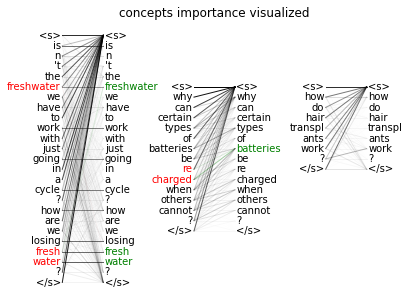

In [18]:
plot_attn_lines_concepts_ids('concepts importance visualized',
                         examples_total[0],
                         0, 10,
                         concepts_to_spot,
                         relations_total[0])

In [7]:
x = {(17, 22): {(25, 30): 'related_to', (34, 40): 'is_a', (43, 50): 'has_last_subevent'}, (25, 30): {(17, 22): 'related_to', (34, 40): 'related_to'}, (34, 40): {(17, 22): 'related_to', (25, 30): 'related_to'}}

In [17]:
incoming_rels = list([y[0] for coord in x.values() for y in coord.items()])

In [18]:
incoming_rels

[(25, 30), (34, 40), (43, 50), (17, 22), (34, 40), (17, 22), (25, 30)]